<a href="https://colab.research.google.com/github/Thannos/Trabalho-de-Conclusao-de-Curso/blob/main/TCC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install unidecode

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 2.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive #acessar o drive
from google.colab import files #salvar o pdf no drive
import itertools #retirar valores nulos
import unicodedata #retirar acentos
from pandas.plotting import table
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Leitura de Arquivo (Banco de Dados) e pré-processamento

## Ajustes

### Cores

In [ ]:
def escolhecor (instituto):
  if (instituto == 'ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS'):
    return '#0000FF' #Blue
  if (instituto == 'IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS'):
    return '#00FF7F' #SpringGreen
  if (instituto == 'ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS'):
    return '#006400' #DarkGreen
  if (instituto == 'ICB - INSTITUTO DE CIENCIAS BIOLOGICAS'):
    return '#FF8C00' #DarkOrange
  if (instituto == 'ICA - INSTITUTO DE CIENCIAS DA ARTE'):
    return '#FF00FF' #Magenta
  if (instituto == 'ILC - INSTITUTO DE LETRAS E COMUNICACAO'):
    return '#DC143C' #Crimson
  if (instituto == 'ITEC - INSTITUTO DE TECNOLOGIA'):
    return '#ADD8E6' #LightBlue
  if (instituto == 'ICM - INSTITUTO DE CIENCIAS MEDICAS'):
    return '#DAA520' #GoldenRod
  if (instituto == 'ICED - INSTITUTO DE CIENCIAS DA EDUCACAO'):
    return '#FF0000' #Red
  if (instituto == 'ICS - INSTITUTO DE CIENCIAS DA SAUDE'):
    return '#FFFF00' #Yellow
  if (instituto == 'ICJ - INSTITUTO DE CIENCIAS JURIDICAS'):
    return '#4B0082' #Indigo
  else:
    return '#808080' #Gray
# https://celke.com.br/artigo/tabela-de-cores-html-nome-hexadecimal-rgb

### Campus e Cursos da UFPA

In [ ]:
df_institutos = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Cursos_ufpa/cursos%20ufpa.csv', delimiter=';', low_memory=False)
df_lista_completa = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Cursos_ufpa/lista_completa.csv', delimiter=';', low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
df_lista_completa

,Nome,Sede,Campus,Modalidade,Coordenador
0,AGROECOLOGIA,ABAETETUBA,CABAE - CAMPUS UNIVERSITARIO DE ABAETETUBA,Presencial,RICARDO EDUARDO DE FREITAS MAIA
1,AGROECOLOGIA,ACAR?,CABAE - CAMPUS UNIVERSITARIO DE ABAETETUBA,Presencial,RICARDO EDUARDO DE FREITAS MAIA
2,AGROECOLOGIA,TOM?-A??,CABAE - CAMPUS UNIVERSITARIO DE ABAETETUBA,Presencial,RICARDO EDUARDO DE FREITAS MAIA
3,EDUCACAO DO CAMPO,ABAETETUBA,CABAE - CAMPUS UNIVERSITARIO DE ABAETETUBA,Presencial,JOSELINE SIMONE BARRETO TRINDADE
4,EDUCACAO DO CAMPO,ACAR?,CABAE - CAMPUS UNIVERSITARIO DE ABAETETUBA,Presencial,RONALDO LOPES DE SOUSA
...,...,...,...,...,...
642,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,BELÉM,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,Presencial,BIANCA BENTES DA SILVA
643,NEB -NUCLEO DE ESTUDOS TRANSDISCIPLINARES,BELÉM,NEB - NUCLEO DE ESTUDOS TRANSDISCIPLINARES EM ...,Presencial,NaN
644,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,BELÉM,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,Presencial,MARIA ATAIDE MALCHER
645,NMT - NUCLEO DE MEDIDINA TROPICAL,BELÉM,NMT - NUCLEO DE MEDICINA TROPICAL,Presencial,EDNA AOBA YASSUI ISHIKAWA


In [ ]:
print(df_lista_completa['Sede'].value_counts())

BELÉM                         105
CAMET?                         32
BRAGAN?A                       27
TUCURU?                        27
ABAETETUBA                     26
                             ... 
VILA DO CARMO DO TOCANTINS      1
SENADOR JOS? PORF?RIO           1
VIT?RIA DO XINGU                1
OUTEIRO                         1
MARACAN?                        1
Name: Sede, Length: 85, dtype: int64


In [ ]:
# Código dos cursos de belém
valor_desejado = 'BELÉM'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
df_lista_completa = df_lista_completa[df_lista_completa['Sede'] == valor_desejado]

df_lista_completa


,Nome,Sede,Campus,Modalidade,Coordenador
243,EDUCACAO FISICA - PARFOR,BELÉM,CCAST - CAMPUS UNIVERSITARIO DE CASTANHAL,Presencial,NaN
302,ARTES VISUAIS,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,LUIZAN PINHEIRO DA COSTA
321,CINEMA E AUDIOVISUAL,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,ANA CLAUDIA DA CRUZ MELO
322,CINEMA E AUDIOVISUAL - INTENSIVO,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,RICARDO HARADA ONO
323,DANCA,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,MARIA ANA AZEVEDO DE OLIVEIRA
...,...,...,...,...,...
642,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,BELÉM,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,Presencial,BIANCA BENTES DA SILVA
643,NEB -NUCLEO DE ESTUDOS TRANSDISCIPLINARES,BELÉM,NEB - NUCLEO DE ESTUDOS TRANSDISCIPLINARES EM ...,Presencial,NaN
644,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,BELÉM,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,Presencial,MARIA ATAIDE MALCHER
645,NMT - NUCLEO DE MEDIDINA TROPICAL,BELÉM,NMT - NUCLEO DE MEDICINA TROPICAL,Presencial,EDNA AOBA YASSUI ISHIKAWA


In [ ]:
df_institutos

,Nome,Instituto
0,MATEMÁTICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
1,QUÍMICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
2,MATEMÁTICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
3,FILOSOFIA (LICENCIATURA),IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS
4,QUÍMICA (BACHARELADO),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
...,...,...
122,QUÍMICA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
123,MATEMÁTICA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
124,CIÊNCIAS BIOLÓGICAS,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS
125,LETRAS-PORTUGUÊS,ILC - INSTITUTO DE LETRAS E COMUNICACAO


### PGO

In [ ]:
pgo_2014 = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Cursos_ufpa/PGO/tentando.csv', delimiter=';', low_memory=False, decimal=",", encoding='latin_1')
pgo_2014

,instituto,tipo,valor
0,ICB,total,790160.0
1,ICB,Matriz Orçamentária - FUNCIONAMENTO DAS UNIDAD...,543807.0
2,ICB,PROINFRA - RECUPERAÇÃO DA INFRA-ESTRUTURA FÍSI...,109364.0
3,ICB,PROINFRA - AQUISIÇÃO DE EQUIPAMENTOS PARA AS U...,49134.0
4,ICB,Viagem de Campo - do Instituto,29659.0
...,...,...,...
71,ICA,Educação Profissional - TECNOLOGIA DA INFORMAÇ...,82362.0
72,ICA,Educação Profissional - TECNOLOGIA DA INFORMAÇ...,48965.0
73,ICA,Tecnologia da Informação - DAS UNIDADES ACADÊM...,10545.0
74,ICA,Assistência ao Educando do Ensino Técnico - AS...,166737.0


## Conceitos

### Conceito de 2021

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/conceito_enade_2021.csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
print(df.value_counts())

Ano   Código da Área  Área de Avaliação                                 Grau Acadêmico  Código da IES  Nome da IES*                                  Sigla da IES*  Organização Acadêmica  Categoria Administrativa     Código do Curso  Modalidade de Ensino  Código do Município**  Município do Curso**  Sigla da UF**   Nº de Concluintes Inscritos  Nº  de Concluintes Participantes  Nota Bruta - FG  Nota Padronizada - FG  Nota Bruta - CE  Nota Padronizada - CE  Conceito Enade (Contínuo)  Conceito Enade (Faixa)
2021  26              DESIGN                                            Bacharelado     2              UNIVERSIDADE DE BRASÍLIA                      UNB            Universidade           Pública Federal              26978            Educação Presencial   5300108                Brasília              DF              20                           15                                55.593           5.000                  58.893           4.853                  4.890                      5    

In [ ]:
df_2021 = df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2021 = df[df['Código do Município**'] == valor_desejado]

belem_2021

,Ano,Código da Área,Área de Avaliação,Grau Acadêmico,Código da IES,Nome da IES*,Sigla da IES*,Organização Acadêmica,Categoria Administrativa,Código do Curso,...,Município do Curso**,Sigla da UF**,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa)
35,2021,2501,ARTES VISUAIS,Licenciatura,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,52386,...,Belém,PA,51,0,NaN,NaN,NaN,NaN,NaN,NaN
43,2021,2501,ARTES VISUAIS,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,114907,...,Belém,PA,38,0,NaN,NaN,NaN,NaN,NaN,NaN
200,2021,4004,CIÊNCIA DA COMPUTAÇÃO,Bacharelado,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,20009,...,Belém,PA,29,0,NaN,NaN,NaN,NaN,NaN,NaN
247,2021,4004,CIÊNCIA DA COMPUTAÇÃO,Bacharelado,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12025,...,Belém,PA,42,0,NaN,NaN,NaN,NaN,NaN,NaN
292,2021,4004,CIÊNCIA DA COMPUTAÇÃO,Bacharelado,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pública Federal,1110857,...,Belém,PA,20,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7079,2021,4006,SISTEMAS DE INFORMAÇÃO,Bacharelado,2459,FACULDADE DE ESTUDOS AVANÇADOS DO PARÁ,FEAPA,Faculdade,Privada com fins lucrativos,73898,...,Belém,PA,23,0,NaN,NaN,NaN,NaN,NaN,NaN
7263,2021,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,Tecnológico,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,115142,...,Belém,PA,20,0,NaN,NaN,NaN,NaN,NaN,NaN
7412,2021,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,Tecnológico,1423,Faculdade Ideal Wyden,Faci Wyden,Faculdade,Privada com fins lucrativos,101418,...,Belém,PA,3,0,NaN,NaN,NaN,NaN,NaN,NaN
7489,2021,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,Tecnológico,1813,"INSTITUTO FEDERAL DE EDUCAÇÃO, CIÊNCIA E TECNO...",IFPA,"Instituto Federal de Educação, Ciência e Tecno...",Pública Federal,87330,...,Belém,PA,52,2,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2021 = belem_2021[belem_2021['Código da IES'] == valor_desejado]

ufpa_2021

,Ano,Código da Área,Área de Avaliação,Grau Acadêmico,Código da IES,Nome da IES*,Sigla da IES*,Organização Acadêmica,Categoria Administrativa,Código do Curso,...,Município do Curso**,Sigla da UF**,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa)
43,2021,2501,ARTES VISUAIS,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,114907,...,Belém,PA,38,0,NaN,NaN,NaN,NaN,NaN,NaN
247,2021,4004,CIÊNCIA DA COMPUTAÇÃO,Bacharelado,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12025,...,Belém,PA,42,0,NaN,NaN,NaN,NaN,NaN,NaN
795,2021,1602,CIÊNCIAS BIOLÓGICAS,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12023,...,Belém,PA,115,0,NaN,NaN,NaN,NaN,NaN,NaN
796,2021,1601,CIÊNCIAS BIOLÓGICAS,Bacharelado,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12027,...,Belém,PA,48,0,NaN,NaN,NaN,NaN,NaN,NaN
800,2021,1602,CIÊNCIAS BIOLÓGICAS,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1148030,...,Belém,PA,43,15,26.620,1.147,38.460,1.741,1.593,2
1288,2021,5402,CIÊNCIAS SOCIAIS,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11992,...,Belém,PA,49,0,NaN,NaN,NaN,NaN,NaN,NaN
1289,2021,5401,CIÊNCIAS SOCIAIS,Bacharelado,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,311992,...,Belém,PA,44,0,NaN,NaN,NaN,NaN,NaN,NaN
1907,2021,3502,EDUCAÇÃO FÍSICA,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,104598,...,Belém,PA,106,0,NaN,NaN,NaN,NaN,NaN,NaN
2773,2021,3202,FILOSOFIA,Licenciatura,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11994,...,Belém,PA,43,0,NaN,NaN,NaN,NaN,NaN,NaN
2774,2021,3201,FILOSOFIA,Bacharelado,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,311994,...,Belém,PA,8,0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2021_sem_valores = ufpa_2021[ufpa_2021['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2021 = ufpa_2021[ufpa_2021['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2021_sem_valores = belem_2021[belem_2021['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2021 = belem_2021[belem_2021['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2021_sem_valores = df_2021[df_2021['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2021 = df_2021[df_2021['Conceito Enade (Contínuo)'].notna()]

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2021 - renomeando colunas
df_2021=df_2021.rename(columns={'Área de Avaliação': 'Área de Avaliação','Grau Acadêmico': 'Grau Acadêmico','Nome da IES*': 'Nome da IES', 'Sigla da IES*': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso**': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observacao': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})
ufpa_2021=ufpa_2021.rename(columns={'Área de Avaliação': 'Área de Avaliação','Grau Acadêmico': 'Grau Acadêmico','Nome da IES*': 'Nome da IES', 'Sigla da IES*': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso**': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observacao': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})
belem_2021=belem_2021.rename(columns={'Área de Avaliação': 'Área de Avaliação','Grau Acadêmico': 'Grau Acadêmico','Nome da IES*': 'Nome da IES', 'Sigla da IES*': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso**': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observacao': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})

#ano de 2021 - Adicionando colunas
df_2021['Observação'] = None
ufpa_2021['Observação'] = None
belem_2021['Observação'] = None

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2021 = df_2021.drop( columns = [coluna for coluna in df_2021.columns if coluna not in manter])
ufpa_2021 = ufpa_2021.drop( columns = [coluna for coluna in ufpa_2021.columns if coluna not in manter])
belem_2021 = belem_2021.drop( columns = [coluna for coluna in belem_2021.columns if coluna not in manter])

In [ ]:
df_2021.columns

Index(['Ano', 'Código da Área', 'Área de Avaliação', 'Grau Acadêmico',
       'Nome da IES', 'Sigla da IES', 'Código do Curso',
       'Modalidade de Ensino', 'Município do Curso', 'Concluintes Inscritos',
       'Concluintes Participantes', 'Nota Padronizada - FG',
       'Nota Padronizada - CE', 'Conceito Enade (Contínuo)', 'Observação'],
      dtype='object')

#### Antiga plotação de Gráfico

In [ ]:
"""# Especificar a coluna de interesse
coluna_interesse = 'Conceito Enade (Continuo)'

# Concatenar as colunas para criar o eixo y
df_2021['Concatenacao_Colunas'] = df_2021['Area de Avaliacao'].astype(str) + '-' + df_2021['Nome da IES*'].astype(str) + '-' + df_2021['Codigo do Curso'].astype(str)
lista = list(range(len(df_2021['Concatenacao_Colunas'])))

# Criar o gráfico (por exemplo, um gráfico de barras)
#plt.figure(figsize=(10, 6))  # Define o tamanho da figura
plt.bar(lista ,df_2021[coluna_interesse].str.replace(',', '.').astype(float))  # Substitua 'OutraColuna' pela coluna que você deseja no eixo y
plt.xticks(range(0, len(lista), 1), lista[::1])

# Criar a legenda personalizada
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='b') for label in df_2021['Concatenacao_Colunas'] ]
# Usar uma compreensão de lista para combinar os elementos
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='b') for label in listat ]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.ylabel('Conceito Enade (Continuo)')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico"""

'# Especificar a coluna de interesse\ncoluna_interesse = \'Conceito Enade (Continuo)\'\n\n# Concatenar as colunas para criar o eixo y\ndf_2021[\'Concatenacao_Colunas\'] = df_2021[\'Area de Avaliacao\'].astype(str) + \'-\' + df_2021[\'Nome da IES*\'].astype(str) + \'-\' + df_2021[\'Codigo do Curso\'].astype(str)\nlista = list(range(len(df_2021[\'Concatenacao_Colunas\'])))\n\n# Criar o gráfico (por exemplo, um gráfico de barras)\n#plt.figure(figsize=(10, 6))  # Define o tamanho da figura\nplt.bar(lista ,df_2021[coluna_interesse].str.replace(\',\', \'.\').astype(float))  # Substitua \'OutraColuna\' pela coluna que você deseja no eixo y\nplt.xticks(range(0, len(lista), 1), lista[::1])\n\n# Criar a legenda personalizada\nlegenda_personalizada = [plt.Line2D([0], [0], marker=\'o\', color=\'w\', label=label, markersize=10, markerfacecolor=\'b\') for label in df_2021[\'Concatenacao_Colunas\'] ]\n# Usar uma compreensão de lista para combinar os elementos\nlistat = [f"{a}-{b}" for a, b in zip(lis

In [ ]:
"""# Especificar a coluna de interesse
coluna_interesse = 'Conceito Enade (Continuo)'

# Concatenar as colunas para criar o eixo y
df_com_valores['Concatenacao_Colunas'] = df_com_valores['Area de Avaliacao'].astype(str) + '-' + df_com_valores['Nome da IES*'].astype(str) + '-' + df_com_valores['Codigo do Curso'].astype(str)
lista = list(range(len(df_com_valores['Concatenacao_Colunas'])))

# Criar o gráfico (por exemplo, um gráfico de barras)
#plt.figure(figsize=(10, 6))  # Define o tamanho da figura
plt.bar(lista ,df_com_valores[coluna_interesse].str.replace(',', '.').astype(float))  # Substitua 'OutraColuna' pela coluna que você deseja no eixo y
plt.xticks(range(0, len(lista), 1), lista[::1])

# Criar a legenda personalizada
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='b') for label in df_com_valores['Concatenacao_Colunas'] ]
# Usar uma compreensão de lista para combinar os elementos
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='b') for label in listat ]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.ylabel('Conceito Enade (Continuo)')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico"""

'# Especificar a coluna de interesse\ncoluna_interesse = \'Conceito Enade (Continuo)\'\n\n# Concatenar as colunas para criar o eixo y\ndf_com_valores[\'Concatenacao_Colunas\'] = df_com_valores[\'Area de Avaliacao\'].astype(str) + \'-\' + df_com_valores[\'Nome da IES*\'].astype(str) + \'-\' + df_com_valores[\'Codigo do Curso\'].astype(str)\nlista = list(range(len(df_com_valores[\'Concatenacao_Colunas\'])))\n\n# Criar o gráfico (por exemplo, um gráfico de barras)\n#plt.figure(figsize=(10, 6))  # Define o tamanho da figura\nplt.bar(lista ,df_com_valores[coluna_interesse].str.replace(\',\', \'.\').astype(float))  # Substitua \'OutraColuna\' pela coluna que você deseja no eixo y\nplt.xticks(range(0, len(lista), 1), lista[::1])\n\n# Criar a legenda personalizada\nlegenda_personalizada = [plt.Line2D([0], [0], marker=\'o\', color=\'w\', label=label, markersize=10, markerfacecolor=\'b\') for label in df_com_valores[\'Concatenacao_Colunas\'] ]\n# Usar uma compreensão de lista para combinar os el

### Conceito 2019

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/Conceito_Enade_2019.csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
df.value_counts()

Series([], dtype: int64)

In [ ]:
df_2019 = df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2019 = df[df['Código do Município'] == valor_desejado]

belem_2019

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
60,2019,5,MEDICINA VETERINÁRIA,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,1313832,Educação Presencial,...,PA,128,125,37.1504,1.8031,45.7856,0.9843,1.1890,2,NaN
109,2019,5,MEDICINA VETERINÁRIA,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pública Federal,14559,Educação Presencial,...,PA,58,57,45.9175,3.2800,53.9684,2.4500,2.6575,3,NaN
316,2019,6,ODONTOLOGIA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12017,Educação Presencial,...,PA,92,92,53.6913,4.2502,61.0707,3.2973,3.5355,4,NaN
358,2019,6,ODONTOLOGIA,792,CENTRO UNIVERSITÁRIO DO ESTADO DO PARÁ,CESUPA,Centro Universitário,Privada sem fins lucrativos,18166,Educação Presencial,...,PA,48,48,44.8937,2.9419,57.9208,2.8918,2.9043,3,NaN
417,2019,6,ODONTOLOGIA,2745,ESCOLA SUPERIOR DA AMAZÔNIA,ESAMAZ,Faculdade,Privada com fins lucrativos,99228,Educação Presencial,...,PA,248,239,32.1640,1.0488,38.8967,0.4427,0.5943,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8102,2019,6307,ENGENHARIA AMBIENTAL,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pública Federal,1180610,Educação Presencial,...,PA,60,50,45.8700,2.5087,44.7400,2.5986,2.5761,3,NaN
8170,2019,6307,ENGENHARIA AMBIENTAL,1423,Faculdade Ideal Wyden,Faci Wyden,Faculdade,Privada com fins lucrativos,1350827,Educação Presencial,...,PA,24,24,33.9042,1.0277,30.8292,0.8578,0.9003,1,NaN
8179,2019,6307,ENGENHARIA AMBIENTAL,1521,FACULDADE ESTÁCIO DE BELÉM - ESTÁCIO BELÉM,ESTÁCIO BELÉM,Faculdade,Privada com fins lucrativos,109380,Educação Presencial,...,PA,35,33,37.8636,1.5178,35.5091,1.4434,1.4620,2,NaN
8261,2019,6307,ENGENHARIA AMBIENTAL,13982,FACULDADE UNINASSAU BELÉM,NaN,Faculdade,Privada com fins lucrativos,1180101,Educação Presencial,...,PA,43,43,39.1093,1.6719,31.1930,0.9033,1.0955,2,NaN


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2019 = belem_2019[belem_2019['Código da IES'] == valor_desejado]

ufpa_2019

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
316,2019,6,ODONTOLOGIA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12017,Educação Presencial,...,PA,92,92,53.6913,4.2502,61.0707,3.2973,3.5355,4,NaN
559,2019,12,MEDICINA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12015,Educação Presencial,...,PA,156,153,50.6876,2.4308,57.8935,1.8904,2.0255,3,NaN
1139,2019,19,FARMÁCIA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,52003,Educação Presencial,...,PA,58,56,53.0107,4.4750,53.8964,3.3209,3.6094,4,NaN
1588,2019,21,ARQUITETURA E URBANISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12002,Educação Presencial,...,PA,96,92,53.5109,4.1166,67.4511,3.8109,3.8873,4,NaN
2073,2019,23,ENFERMAGEM,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12013,Educação Presencial,...,PA,74,69,49.0493,4.1935,50.5072,3.3755,3.5800,4,NaN
2837,2019,28,NUTRIÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12018,Educação Presencial,...,PA,93,75,47.8973,3.9064,58.4067,3.5458,3.6359,4,NaN
3291,2019,36,FISIOTERAPIA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1113541,Educação Presencial,...,PA,26,26,52.0731,4.3665,51.8192,4.6166,4.5541,5,NaN
3843,2019,55,BIOMEDICINA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12014,Educação Presencial,...,PA,33,32,56.6156,4.3482,50.1219,3.0450,3.3708,4,NaN
5171,2019,4003,ENGENHARIA DA COMPUTAÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,53193,Educação Presencial,...,PA,82,63,53.6016,4.1449,29.1794,1.1320,1.8852,2,NaN
5527,2019,5710,ENGENHARIA CIVIL,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12001,Educação Presencial,...,PA,159,134,51.5940,3.9231,50.6403,3.3685,3.5072,4,NaN


In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2019_sem_valores = ufpa_2019[ufpa_2019['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2019 = ufpa_2019[ufpa_2019['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2019_sem_valores = belem_2019[belem_2019['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2019 = belem_2019[belem_2019['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2019_sem_valores = df_2019[df_2019['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2019 = df_2019[df_2019['Conceito Enade (Contínuo)'].notna()]

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2019 - renomeando colunas
df_2019=df_2019.rename(columns={'Área de Avaliação': 'Área de Avaliação', 'Nome da IES': 'Nome da IES', 'Sigla da IES': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observação': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})
ufpa_2019=ufpa_2019.rename(columns={'Área de Avaliação': 'Área de Avaliação', 'Nome da IES': 'Nome da IES', 'Sigla da IES': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observação': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})
belem_2019=belem_2019.rename(columns={'Área de Avaliação': 'Área de Avaliação', 'Nome da IES': 'Nome da IES', 'Sigla da IES': 'Sigla da IES', 'Código do Curso': 'Código do Curso', 'Município do Curso': 'Município do Curso', 'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes', 'Observação': 'Observação',  'Conceito Enade (Contínuo)': 'Conceito Enade (Contínuo)'})

#ano de 2019 - Adicionando colunas
df_2019['Grau Acadêmico'] = None
ufpa_2019['Grau Acadêmico'] = None
belem_2019['Grau Acadêmico'] = None

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2019 = df_2019.drop( columns = [coluna for coluna in df_2019.columns if coluna not in manter])
ufpa_2019 = ufpa_2019.drop( columns = [coluna for coluna in ufpa_2019.columns if coluna not in manter])
belem_2019 = belem_2019.drop( columns = [coluna for coluna in belem_2019.columns if coluna not in manter])

In [ ]:
for index, row in df_institutos.iterrows():
  seq = row['Nome']
  filtro = ufpa_2019['Área de Avaliação'].str.match(seq)
  #print(seq,'---',filtro)
  if filtro.any():
    ind = filtro.idxmax()
    valor = df_institutos.at[index, 'Instituto']
    #print(ind,'---',valor)
    ufpa_2019.at[ind, 'Instituto'] = valor
ufpa_2019['Cor'] = ufpa_2019['Instituto'].apply(escolhecor)
ufpa_2019

,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Instituto,Cor
316,2019,6,ODONTOLOGIA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12017,Educação Presencial,Belém,92,92,4.2502,3.2973,3.5355,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
559,2019,12,MEDICINA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12015,Educação Presencial,Belém,156,153,2.4308,1.8904,2.0255,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
1139,2019,19,FARMÁCIA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,52003,Educação Presencial,Belém,58,56,4.4750,3.3209,3.6094,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
1588,2019,21,ARQUITETURA E URBANISMO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12002,Educação Presencial,Belém,96,92,4.1166,3.8109,3.8873,NaN,None,ITEC - INSTITUTO DE TECNOLOGIA,#ADD8E6
2073,2019,23,ENFERMAGEM,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12013,Educação Presencial,Belém,74,69,4.1935,3.3755,3.5800,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
2837,2019,28,NUTRIÇÃO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12018,Educação Presencial,Belém,93,75,3.9064,3.5458,3.6359,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
3291,2019,36,FISIOTERAPIA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,1113541,Educação Presencial,Belém,26,26,4.3665,4.6166,4.5541,NaN,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
3843,2019,55,BIOMEDICINA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12014,Educação Presencial,Belém,33,32,4.3482,3.0450,3.3708,NaN,None,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS,#FF8C00
5171,2019,4003,ENGENHARIA DA COMPUTAÇÃO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,53193,Educação Presencial,Belém,82,63,4.1449,1.1320,1.8852,NaN,None,ITEC - INSTITUTO DE TECNOLOGIA,#ADD8E6
5527,2019,5710,ENGENHARIA CIVIL,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12001,Educação Presencial,Belém,159,134,3.9231,3.3685,3.5072,NaN,None,ITEC - INSTITUTO DE TECNOLOGIA,#ADD8E6


In [ ]:
#erro identificado, mas não entendi e não concertei
ufpa_2019.at[5171,'Instituto'] = 'ITEC - INSTITUTO DE TECNOLOGIA'
ufpa_2019['Instituto']

316       ICS - INSTITUTO DE CIENCIAS DA SAUDE
559       ICS - INSTITUTO DE CIENCIAS DA SAUDE
1139      ICS - INSTITUTO DE CIENCIAS DA SAUDE
1588            ITEC - INSTITUTO DE TECNOLOGIA
2073      ICS - INSTITUTO DE CIENCIAS DA SAUDE
2837      ICS - INSTITUTO DE CIENCIAS DA SAUDE
3291      ICS - INSTITUTO DE CIENCIAS DA SAUDE
3843    ICB - INSTITUTO DE CIENCIAS BIOLOGICAS
5171            ITEC - INSTITUTO DE TECNOLOGIA
5527            ITEC - INSTITUTO DE TECNOLOGIA
6193            ITEC - INSTITUTO DE TECNOLOGIA
6815            ITEC - INSTITUTO DE TECNOLOGIA
7089            ITEC - INSTITUTO DE TECNOLOGIA
7217            ITEC - INSTITUTO DE TECNOLOGIA
8075            ITEC - INSTITUTO DE TECNOLOGIA
Name: Instituto, dtype: object

### Conceito 2018

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/resultados_conceito_enade_2018.csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
df.value_counts()

Series([], dtype: int64)

In [ ]:
df_2018 = df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2018 = df[df['Código do Município'] == valor_desejado]

belem_2018

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
478,2018,18,PSICOLOGIA,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,8059,Educação Presencial,...,PA,189,174,53.55517,2.92494,48.35057,2.50820,2.61239,3,NaN
479,2018,2,DIREITO,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,8061,Educação Presencial,...,PA,482,424,52.58514,2.74220,39.54340,2.46472,2.53409,3,NaN
480,2018,38,SERVIÇO SOCIAL,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,8065,Educação Presencial,...,PA,148,127,39.07638,1.96267,41.77795,2.00104,1.99145,3,NaN
730,2018,22,CIÊNCIAS CONTÁBEIS,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11988,Educação Presencial,...,PA,155,130,50.60231,3.81138,41.34385,3.16647,3.32769,4,NaN
731,2018,1,ADMINISTRAÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11989,Educação Presencial,...,PA,288,231,56.14329,4.15630,42.30476,3.26737,3.48960,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8315,2018,84,TECNOLOGIA EM MARKETING,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,1313838,Educação Presencial,...,PA,16,15,50.78000,3.73039,53.93333,3.17556,3.31426,4,NaN
8316,2018,81,RELAÇÕES INTERNACIONAIS,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,1313839,Educação Presencial,...,PA,54,45,65.29778,3.08595,45.20444,3.22120,3.18739,4,NaN
8445,2018,103,TECNOLOGIA EM DESIGN DE INTERIORES,1423,Faculdade Ideal Wyden,Faci Wyden,Faculdade,Privada com fins lucrativos,1330688,Educação Presencial,...,PA,14,14,39.10000,2.18710,47.68571,2.37796,2.33025,3,NaN
8731,2018,2,DIREITO,3783,FACULDADE PARAENSE DE ENSINO,FAPEN,Faculdade,Privada com fins lucrativos,5000864,Educação Presencial,...,PA,69,66,46.66667,1.99858,33.30303,1.56333,1.67214,2,NaN


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2018 = belem_2018[belem_2018['Código da IES'] == valor_desejado]

ufpa_2018

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
730,2018,22,CIÊNCIAS CONTÁBEIS,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11988,Educação Presencial,...,PA,155,130,50.60231,3.81138,41.34385,3.16647,3.32769,4,NaN
731,2018,1,ADMINISTRAÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11989,Educação Presencial,...,PA,288,231,56.14329,4.15630,42.30476,3.26737,3.48960,4,NaN
732,2018,2,DIREITO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11990,Educação Presencial,...,PA,257,228,65.30175,4.33996,48.26404,3.72438,3.87827,4,NaN
733,2018,13,CIÊNCIAS ECONÔMICAS,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11993,Educação Presencial,...,PA,74,59,53.31695,2.69406,26.43051,1.15980,1.54336,2,NaN
734,2018,38,SERVIÇO SOCIAL,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11998,Educação Presencial,...,PA,134,116,55.00431,4.11471,55.17155,3.49736,3.65170,4,NaN
735,2018,29,TURISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12012,Educação Presencial,...,PA,167,120,47.30917,2.27083,49.80000,2.59343,2.51278,3,NaN
1739,2018,803,COMUNICAÇÃO SOCIAL - JORNALISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,25795,Educação Presencial,...,PA,45,44,62.67500,3.92284,59.78409,3.91928,3.92017,4,NaN
1789,2018,804,COMUNICAÇÃO SOCIAL - PUBLICIDADE E PROPAGANDA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,28352,Educação Presencial,...,PA,20,18,64.65000,4.77221,60.11667,4.23088,4.36621,5,NaN
1867,2018,18,PSICOLOGIA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,31850,Educação Presencial,...,PA,78,62,65.07903,4.22502,56.63387,3.70132,3.83225,4,NaN
7605,2018,100,ADMINISTRAÇÃO PÚBLICA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1203245,Educação a Distância,...,PA,6,0,NaN,NaN,NaN,NaN,NaN,SC,NaN


In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2018_sem_valores = ufpa_2018[ufpa_2018['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2018 = ufpa_2018[ufpa_2018['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2018_sem_valores = belem_2018[belem_2018['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2018 = belem_2018[belem_2018['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2018_sem_valores = df_2018[df_2018['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2018 = df_2018[df_2018['Conceito Enade (Contínuo)'].notna()]

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2018 - renomeando colunas
df_2018=df_2018.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
ufpa_2018=ufpa_2018.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
belem_2018=belem_2018.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
#ano de 2018 - Adicionando colunas
df_2018['Grau Acadêmico'] = None
ufpa_2018['Grau Acadêmico'] = None
belem_2018['Grau Acadêmico'] = None

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2018 = df_2018.drop( columns = [coluna for coluna in df_2018.columns if coluna not in manter])
ufpa_2018 = ufpa_2018.drop( columns = [coluna for coluna in ufpa_2018.columns if coluna not in manter])
belem_2018 = belem_2018.drop( columns = [coluna for coluna in belem_2018.columns if coluna not in manter])

In [ ]:
for index, row in df_institutos.iterrows():
  seq = row['Nome']
  filtro = ufpa_2018['Área de Avaliação'].str.contains(seq)
  if filtro.any():
    ind = filtro.idxmax()
    valor = df_institutos.at[index, 'Instituto']
    ufpa_2018.at[ind, 'Instituto'] = valor
ufpa_2018['Cor'] = ufpa_2018['Instituto'].apply(escolhecor)
ufpa_2018

<ipython-input-850-6d403b4f19cc>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2018['Área de Avaliação'].str.contains(seq)
<ipython-input-850-6d403b4f19cc>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2018['Área de Avaliação'].str.contains(seq)


,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Instituto,Cor
730,2018,22,CIÊNCIAS CONTÁBEIS,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11988,Educação Presencial,BELEM,155,130,3.81138,3.16647,3.32769,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
731,2018,1,ADMINISTRAÇÃO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11989,Educação Presencial,BELEM,288,231,4.15630,3.26737,3.48960,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
732,2018,2,DIREITO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11990,Educação Presencial,BELEM,257,228,4.33996,3.72438,3.87827,NaN,None,ICJ - INSTITUTO DE CIENCIAS JURIDICAS,#4B0082
733,2018,13,CIÊNCIAS ECONÔMICAS,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11993,Educação Presencial,BELEM,74,59,2.69406,1.15980,1.54336,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
734,2018,38,SERVIÇO SOCIAL,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11998,Educação Presencial,BELEM,134,116,4.11471,3.49736,3.65170,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
735,2018,29,TURISMO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12012,Educação Presencial,BELEM,167,120,2.27083,2.59343,2.51278,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
1739,2018,803,COMUNICAÇÃO SOCIAL - JORNALISMO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,25795,Educação Presencial,BELEM,45,44,3.92284,3.91928,3.92017,NaN,None,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
1789,2018,804,COMUNICAÇÃO SOCIAL - PUBLICIDADE E PROPAGANDA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,28352,Educação Presencial,BELEM,20,18,4.77221,4.23088,4.36621,NaN,None,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
1867,2018,18,PSICOLOGIA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,31850,Educação Presencial,BELEM,78,62,4.22502,3.70132,3.83225,NaN,None,IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS,#00FF7F


### conceito 2017

In [ ]:
aux1 = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/resultados_conceito_enade_2017(parte%201).csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')
aux2 = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/resultados_conceito_enade_2017(parte%202).csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
# Adicionar df2 ao final de df_2017 usando append
df = aux1.append(aux2, ignore_index=True)

<ipython-input-852-ed4cf38b83c8>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = aux1.append(aux2, ignore_index=True)


In [ ]:
#verificando se há linhas repitidas
df.value_counts()

Series([], dtype: int64)

In [ ]:
df_2017 = df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2017 = df[df['Código do Município'] == valor_desejado]

belem_2017

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
98,2017,21,ARQUITETURA E URBANISMO,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,8062,Educação Presencial,...,PA,137,119,54.6815,2.4265,45.0034,2.1683,2.2328,3,NaN
151,2017,21,ARQUITETURA E URBANISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12002,Educação Presencial,...,PA,96,65,62.4831,3.5824,57.0815,3.6702,3.6483,4,NaN
229,2017,21,ARQUITETURA E URBANISMO,1423,FACULDADE IDEAL WYDEN,FACI WYDEN,Faculdade,Privada com fins lucrativos,1157246,Educação Presencial,...,PA,51,50,50.2460,1.7692,40.9800,1.6680,1.6933,2,NaN
373,2017,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,115142,Educação Presencial,...,PA,38,27,50.0185,3.1386,35.7852,2.0637,2.3324,3,NaN
492,2017,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,1423,FACULDADE IDEAL WYDEN,FACI WYDEN,Faculdade,Privada com fins lucrativos,101418,Educação Presencial,...,PA,36,23,47.3522,2.7998,31.1043,1.4961,1.8220,2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10190,2017,6307,ENGENHARIA AMBIENTAL,1521,FACULDADE ESTÁCIO DE BELÉM - ESTÁCIO BELÉM,ESTÁCIO BELÉM,Faculdade,Privada com fins lucrativos,109380,Educação Presencial,...,PA,34,33,59.2606,3.1124,41.0303,2.1110,2.3614,3,NaN
10302,2017,6405,ENGENHARIA FLORESTAL,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pública Federal,14558,Educação Presencial,...,PA,59,55,62.0527,3.4419,45.2145,2.2107,2.5185,3,NaN
10379,2017,6407,Letras - Inglês,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,23777,Educação Presencial,...,PA,88,76,50.5263,2.4138,44.6697,1.8882,2.0196,3,NaN
10420,2017,6407,Letras - Inglês,2426,FACULDADE INTEGRADA BRASIL AMAZONIA - FIBRA,FIBRA,Faculdade,Privada com fins lucrativos,66645,Educação Presencial,...,PA,8,6,34.0000,0.1076,43.6500,1.7625,1.3488,2,NaN


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2017 = belem_2017[belem_2017['Código da IES'] == valor_desejado]

ufpa_2017

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
151,2017,21,ARQUITETURA E URBANISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12002,Educação Presencial,...,PA,96,65,62.4831,3.5824,57.0815,3.6702,3.6483,4,NaN
1148,2017,702,MATEMÁTICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,11999,Educação Presencial,...,PA,423,267,41.4270,1.5413,30.0442,1.3163,1.3726,2,NaN
1153,2017,702,MATEMÁTICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,86396,Educação a Distância,...,PA,77,60,44.2200,1.8673,27.6617,1.0455,1.2509,2,NaN
1614,2017,904,LETRAS-PORTUGUÊS (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,27645,Educação Presencial,...,PA,219,146,53.0671,3.0203,44.8884,2.9771,2.9879,4,NaN
1620,2017,904,LETRAS-PORTUGUÊS (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,115161,Educação a Distância,...,PA,132,80,49.5063,2.5045,34.8413,1.5877,1.8169,2,NaN
2227,2017,1401,FÍSICA (BACHARELADO),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12000,Educação Presencial,...,PA,23,21,45.4905,1.9847,30.1286,1.5397,1.6510,2,NaN
2322,2017,1402,FÍSICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12022,Educação Presencial,...,PA,75,60,48.1517,1.8869,32.8767,1.9082,1.9029,2,NaN
2535,2017,1501,QUÍMICA (BACHARELADO),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12007,Educação Presencial,...,PA,15,14,51.2357,2.1240,26.1143,1.3417,1.5373,2,NaN
2681,2017,1502,QUÍMICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,12026,Educação Presencial,...,PA,66,42,47.9452,1.7876,34.4643,2.5112,2.3303,3,NaN
2682,2017,1502,QUÍMICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,114892,Educação a Distância,...,PA,24,22,48.9500,1.9235,24.8227,1.0451,1.2647,2,NaN


In [ ]:
#, 'Nota Padronizada - CE', 'Nota Padronizada - FG']
teste1 = ufpa_2017[ufpa_2017['Conceito Enade (Contínuo)'].isna()]
teste2 = ufpa_2017[ufpa_2017['Nota Padronizada - CE'].isna()]
teste3 = ufpa_2017[ufpa_2017['Nota Padronizada - FG'].isna()]
teste1.equals(teste1)

True

In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2017_sem_valores = ufpa_2017[ufpa_2017['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2017 = ufpa_2017[ufpa_2017['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2017_sem_valores = belem_2017[belem_2017['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2017 = belem_2017[belem_2017['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2017_sem_valores = df_2017[df_2017['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2017 = df_2017[df_2017['Conceito Enade (Contínuo)'].notna()]

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2017 - renomeando colunas
df_2017=df_2017.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
ufpa_2017=ufpa_2017.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
belem_2017=belem_2017.rename(columns={'Nº de Concluintes Inscritos': 'Concluintes Inscritos', 'Nº  de Concluintes Participantes': 'Concluintes Participantes'})
#ano de 2017 - Adicionando colunas
df_2017['Grau Acadêmico'] = None
ufpa_2017['Grau Acadêmico'] = None
belem_2017['Grau Acadêmico'] = None

In [ ]:
# Verificar o grau do curso: licenciatura ou bacharel
def verificar_e_adicionar(valor):
    if (valor.count('LICENCIATURA')):
        return 'LICENCIATURA'
    elif (valor.count('BACHARELADO')):
        return 'BACHARELADO'
    else:
        return 'None'  # Caso não tenha sido informado o grau do curso

# só verificado no ano de 2014 pois foi o único do primeiro trienio que informou
ufpa_2017['Grau Acadêmico'] = ufpa_2017['Área de Avaliação'].apply(verificar_e_adicionar)
df_2017['Grau Acadêmico'] = df_2017['Área de Avaliação'].apply(verificar_e_adicionar)
belem_2017['Grau Acadêmico'] = belem_2017['Área de Avaliação'].apply(verificar_e_adicionar)

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2017 = df_2017.drop( columns = [coluna for coluna in df_2017.columns if coluna not in manter])
ufpa_2017 = ufpa_2017.drop( columns = [coluna for coluna in ufpa_2017.columns if coluna not in manter])
belem_2017 = belem_2017.drop( columns = [coluna for coluna in belem_2017.columns if coluna not in manter])

In [ ]:
"""for index, row in df_institutos.iterrows():
    seq = row['Nome'].strip()  # Remova espaços em branco no início e no final da string
    filtro = ufpa_2017['Área de Avaliação'].str.strip().str.match(fr'^{seq}$', case=False)

    # Encontre todos os índices onde há correspondência
    indices = filtro[filtro].index
    #print(seq,'---',filtro,'---',indices)

    # Verifique se há correspondências
    if not indices.empty:
        valor = df_institutos.at[index, 'Instituto']

        # Associe o valor aos índices correspondentes
        for ind in indices:
            ufpa_2017.at[ind, 'Instituto'] = valor

# Depois de completar a associação, você pode definir a cor
ufpa_2017['Cor'] = ufpa_2017['Instituto'].apply(escolhecor)"""
#ufpa_2017

"for index, row in df_institutos.iterrows():\n    seq = row['Nome'].strip()  # Remova espaços em branco no início e no final da string\n    filtro = ufpa_2017['Área de Avaliação'].str.strip().str.match(fr'^{seq}$', case=False)\n\n    # Encontre todos os índices onde há correspondência\n    indices = filtro[filtro].index\n    #print(seq,'---',filtro,'---',indices)\n\n    # Verifique se há correspondências\n    if not indices.empty:\n        valor = df_institutos.at[index, 'Instituto']\n\n        # Associe o valor aos índices correspondentes\n        for ind in indices:\n            ufpa_2017.at[ind, 'Instituto'] = valor\n\n# Depois de completar a associação, você pode definir a cor\nufpa_2017['Cor'] = ufpa_2017['Instituto'].apply(escolhecor)"

In [ ]:
for index, row in df_institutos.iterrows():
  seq = row['Nome']
  filtro = ufpa_2017['Área de Avaliação'].str.contains(seq)
  #print(seq,'---',filtro)
  indices = filtro[filtro].index
  #print(seq,'---',filtro,'---',indices)

    # Verifique se há correspondências
  if not indices.empty:
        valor = df_institutos.at[index, 'Instituto']

        # Associe o valor aos índices correspondentes
        for ind in indices:
            ufpa_2017.at[ind, 'Instituto'] = valor
            #print(ind,'---',valor)
ufpa_2017['Cor'] = ufpa_2017['Instituto'].apply(escolhecor)
#ufpa_2017"""

<ipython-input-863-b75d812a079b>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2017['Área de Avaliação'].str.contains(seq)
<ipython-input-863-b75d812a079b>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2017['Área de Avaliação'].str.contains(seq)


In [ ]:
ufpa_2017.at[9837,'Instituto'] = 'Não Identificado'
ufpa_2017.at[9838,'Instituto'] = 'Não Identificado'
ufpa_2017['Cor'] = ufpa_2017['Instituto'].apply(escolhecor)

In [ ]:
ufpa_2017

,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Instituto,Cor
151,2017,21,ARQUITETURA E URBANISMO,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12002,Educação Presencial,Belém,96,65,3.5824,3.6702,3.6483,NaN,None,ITEC - INSTITUTO DE TECNOLOGIA,#ADD8E6
1148,2017,702,MATEMÁTICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11999,Educação Presencial,Belém,423,267,1.5413,1.3163,1.3726,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
1153,2017,702,MATEMÁTICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,86396,Educação a Distância,Belém,77,60,1.8673,1.0455,1.2509,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
1614,2017,904,LETRAS-PORTUGUÊS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,27645,Educação Presencial,Belém,219,146,3.0203,2.9771,2.9879,NaN,LICENCIATURA,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
1620,2017,904,LETRAS-PORTUGUÊS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,115161,Educação a Distância,Belém,132,80,2.5045,1.5877,1.8169,NaN,LICENCIATURA,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
2227,2017,1401,FÍSICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12000,Educação Presencial,Belém,23,21,1.9847,1.5397,1.6510,NaN,BACHARELADO,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2322,2017,1402,FÍSICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12022,Educação Presencial,Belém,75,60,1.8869,1.9082,1.9029,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2535,2017,1501,QUÍMICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12007,Educação Presencial,Belém,15,14,2.1240,1.3417,1.5373,NaN,BACHARELADO,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2681,2017,1502,QUÍMICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12026,Educação Presencial,Belém,66,42,1.7876,2.5112,2.3303,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2682,2017,1502,QUÍMICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,114892,Educação a Distância,Belém,24,22,1.9235,1.0451,1.2647,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF


### conceito 2016

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/resultado_enade2016_portal_06_09_2017.csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
df.value_counts()

Series([], dtype: int64)

In [ ]:
df_2016=df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2016 = df[df['Código do Município'] == valor_desejado]

belem_2016

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Unnamed: 21
248,2016,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada com fins lucrativos,8065,38,SERVIÇO SOCIAL,Educação Presencial,...,PA,106,92.0,42.9587,2.7165,52.3707,2.6836,2.6918,3,NaN
367,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,11998,38,SERVIÇO SOCIAL,Educação Presencial,...,PA,116,111.0,47.5613,3.3591,63.0009,3.7436,3.6475,4,NaN
368,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12013,23,ENFERMAGEM,Educação Presencial,...,PA,99,88.0,54.0159,3.8047,47.8580,3.1592,3.3206,4,NaN
369,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12014,55,BIOMEDICINA,Educação Presencial,...,PA,57,53.0,55.5623,3.1498,42.2717,2.3810,2.5732,3,NaN
370,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12015,12,MEDICINA,Educação Presencial,...,PA,178,167.0,59.1964,2.5758,63.0419,1.7019,1.9204,2,NaN
371,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12017,6,ODONTOLOGIA,Educação Presencial,...,PA,147,142.0,55.9437,3.7189,59.0458,2.6488,2.9163,3,NaN
372,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12018,28,NUTRIÇÃO,Educação Presencial,...,PA,56,48.0,53.4083,3.7011,53.0979,2.8672,3.0756,4,NaN
490,2016,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pessoa Jurídica de Direito Público - Federal,14557,17,AGRONOMIA,Educação Presencial,...,PA,118,114.0,50.0570,3.1132,55.5667,1.9947,2.2743,3,NaN
491,2016,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,Universidade,Pessoa Jurídica de Direito Público - Federal,14559,5,MEDICINA VETERINÁRIA,Educação Presencial,...,PA,79,75.0,50.8800,3.0953,48.8800,2.5553,2.6903,3,NaN
605,2016,792,CENTRO UNIVERSITÁRIO DO ESTADO DO PARÁ,CESUPA,Centro Universitário,Privada sem fins lucrativos,18166,6,ODONTOLOGIA,Educação Presencial,...,PA,75,73.0,52.4356,3.1728,57.6151,2.4533,2.6332,3,NaN


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2016 = belem_2016[belem_2016['Código da IES'] == valor_desejado]

ufpa_2016

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Unnamed: 21
367,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,11998,38,SERVIÇO SOCIAL,Educação Presencial,...,PA,116,111.0,47.5613,3.3591,63.0009,3.7436,3.6475,4,NaN
368,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12013,23,ENFERMAGEM,Educação Presencial,...,PA,99,88.0,54.0159,3.8047,47.8580,3.1592,3.3206,4,NaN
369,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12014,55,BIOMEDICINA,Educação Presencial,...,PA,57,53.0,55.5623,3.1498,42.2717,2.3810,2.5732,3,NaN
370,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12015,12,MEDICINA,Educação Presencial,...,PA,178,167.0,59.1964,2.5758,63.0419,1.7019,1.9204,2,NaN
371,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12017,6,ODONTOLOGIA,Educação Presencial,...,PA,147,142.0,55.9437,3.7189,59.0458,2.6488,2.9163,3,NaN
372,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,12018,28,NUTRIÇÃO,Educação Presencial,...,PA,56,48.0,53.4083,3.7011,53.0979,2.8672,3.0756,4,NaN
1177,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,52003,19,FARMÁCIA,Educação Presencial,...,PA,106,90.0,40.3000,1.5679,48.8989,2.1795,2.0266,3,NaN
3680,2016,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pessoa Jurídica de Direito Público - Federal,1113541,36,FISIOTERAPIA,Educação Presencial,...,PA,47,47.0,60.1021,4.7178,43.3681,3.4176,3.7426,4,NaN


In [ ]:
#, 'Nota Padronizada - CE', 'Nota Padronizada - FG']
teste1 = ufpa_2016[ufpa_2016['Conceito Enade (Contínuo)'].isna()]
teste2 = ufpa_2016[ufpa_2016['Nota Padronizada - CE'].isna()]
teste3 = ufpa_2016[ufpa_2016['Nota Padronizada - FG'].isna()]
teste1.equals(teste2)

True

In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2016_sem_valores = ufpa_2016[ufpa_2016['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2016 = ufpa_2016[ufpa_2016['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2016_sem_valores = belem_2016[belem_2016['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2016 = belem_2016[belem_2016['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2016_sem_valores = df_2016[df_2016['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2016 = df_2016[df_2016['Conceito Enade (Contínuo)'].notna()]

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2016 - renomeando colunas
df_2016=df_2016.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Município do Curso': 'Município do Curso'})
ufpa_2016=ufpa_2016.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Município do Curso': 'Município do Curso'})
belem_2016=belem_2016.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Município do Curso': 'Município do Curso'})
#ano de 2016 - Adicionando colunas
df_2016['Grau Acadêmico'] = None
df_2016['Observação'] = None
df_2016['Modalidade de Ensino'] = 'Presencial'
ufpa_2016['Grau Acadêmico'] = None
ufpa_2016['Observação'] = None
ufpa_2016['Modalidade de Ensino'] = 'Presencial'
belem_2016['Grau Acadêmico'] = None
belem_2016['Observação'] = None
belem_2016['Modalidade de Ensino'] = 'Presencial'

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2016 = df_2016.drop( columns = [coluna for coluna in df_2016.columns if coluna not in manter])
ufpa_2016 = ufpa_2016.drop( columns = [coluna for coluna in ufpa_2016.columns if coluna not in manter])
belem_2016 = belem_2016.drop( columns = [coluna for coluna in belem_2016.columns if coluna not in manter])

In [ ]:
for index, row in df_institutos.iterrows():
  seq = row['Nome']
  filtro = ufpa_2016['Área de Avaliação'].str.match(seq)
  #print(seq, '---', filtro)
  if filtro.any():
    ind = filtro.idxmax()
    valor = df_institutos.at[index, 'Instituto']
    ufpa_2016.at[ind, 'Instituto'] = valor
    #print(ind, '---', valor)
ufpa_2016['Cor'] = ufpa_2016['Instituto'].apply(escolhecor)
ufpa_2016

,Ano,Nome da IES,Sigla da IES,Código do Curso,Código da Área,Área de Avaliação,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Grau Acadêmico,Observação,Instituto,Cor
367,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11998,38,SERVIÇO SOCIAL,Presencial,BELÉM,116,111.0,3.3591,3.7436,3.6475,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
368,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12013,23,ENFERMAGEM,Presencial,BELÉM,99,88.0,3.8047,3.1592,3.3206,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
369,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12014,55,BIOMEDICINA,Presencial,BELÉM,57,53.0,3.1498,2.3810,2.5732,None,None,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS,#FF8C00
370,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12015,12,MEDICINA,Presencial,BELÉM,178,167.0,2.5758,1.7019,1.9204,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
371,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12017,6,ODONTOLOGIA,Presencial,BELÉM,147,142.0,3.7189,2.6488,2.9163,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
372,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12018,28,NUTRIÇÃO,Presencial,BELÉM,56,48.0,3.7011,2.8672,3.0756,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
1177,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,52003,19,FARMÁCIA,Presencial,BELÉM,106,90.0,1.5679,2.1795,2.0266,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00
3680,2016,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,1113541,36,FISIOTERAPIA,Presencial,BELÉM,47,47.0,4.7178,3.4176,3.7426,None,None,ICS - INSTITUTO DE CIENCIAS DA SAUDE,#FFFF00


### Conceito 2015

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/conceito_enade_2015_portal_atualizado_03_10_2017.csv', delimiter=';', usecols=range(22), low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
print(len(df.value_counts()), '\n', len(df))

7421 
 8124


In [ ]:
df_2015=df

In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2015 = df[df['Código do Município'] == valor_desejado]

belem_2015

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo)
315,2015,383,UNIVERSIDADE DA AMAZÔNIA,UNAMA,Universidade,Privada,1169763,1,ADMINISTRAÇÃO,Educação Presencial,...,PA,34,26,57.1577,"3,0212",40.8500,"2,6158",44.9385,"2,7206","2,7172"
484,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,11989,1,ADMINISTRAÇÃO,Educação Presencial,...,PA,239,203,58.9773,"3,3362",39.8044,"2,4582",44.6074,"2,6675","2,6777"
485,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,115174,1,ADMINISTRAÇÃO,Educação a Distância,...,PA,35,32,68.2281,"4,9378",40.9469,"2,6304",47.7813,"3,1765","3,2073"
651,2015,792,CENTRO UNIVERSITÁRIO DO ESTADO DO PARÁ,CESUPA,Centro Universitário,Privada,17563,1,ADMINISTRAÇÃO,Educação Presencial,...,PA,38,37,62.8865,"4,0130",54.0568,"4,6070",56.2838,"4,5402","4,4585"
945,2015,1423,FACULDADE IDEAL,FACI,Faculdade,Privada,48728,1,ADMINISTRAÇÃO,Educação Presencial,...,PA,24,16,68.5875,"5,0000",56.4313,"4,9650",59.4875,"5,0000","4,9737"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7913,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,28352,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,...,PA,29,26,70.9538,"5,0000",62.3346,"4,2854",64.5077,"4,4257","4,4641"
7942,2015,792,CENTRO UNIVERSITÁRIO DO ESTADO DO PARÁ,CESUPA,Centro Universitário,Privada,1174607,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,...,PA,15,14,56.5286,"2,4401",55.5714,"3,3588",55.8357,"3,0753","3,1291"
8065,2015,2036,Faculdade Estácio do Pará - Estácio FAP,ESTÁCIO FAP,Faculdade,Privada,80834,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,...,PA,38,37,58.3081,"2,7559",53.8595,"3,1242",54.9865,"2,9431","3,0322"
8075,2015,2459,FACULDADE DE ESTUDOS AVANÇADOS DO PARÁ,FEAPA,Faculdade,Privada,54270,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,...,PA,24,13,59.3846,"2,9469",53.0692,"3,0160",54.6538,"2,8913","2,9987"


In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2015 = belem_2015[belem_2015['Código da IES'] == valor_desejado]

ufpa_2015

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo)
484,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,11989,1,ADMINISTRAÇÃO,Educação Presencial,...,PA,239,203,58.9773,"3,3362",39.8044,"2,4582",44.6074,"2,6675","2,6777"
485,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,115174,1,ADMINISTRAÇÃO,Educação a Distância,...,PA,35,32,68.2281,"4,9378",40.9469,"2,6304",47.7813,"3,1765","3,2073"
2136,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,11990,2,DIREITO,Educação Presencial,...,PA,223,183,72.0169,"4,5915",55.6525,"4,2909",59.7568,"4,3850","4,3660"
2962,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,11993,13,CIÊNCIAS ECONÔMICAS,Educação Presencial,...,PA,103,91,56.0165,"1,9016",30.1154,"1,5375",36.6022,"1,7617","1,6285"
3253,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,31850,18,PSICOLOGIA,Educação Presencial,...,PA,108,100,59.3230,"2,8985",49.8400,"3,3989",52.2300,"2,9958","3,2738"
3842,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,11988,22,CIÊNCIAS CONTÁBEIS,Educação Presencial,...,PA,196,176,53.3176,"2,8401",41.5097,"2,7344",44.4727,"2,8096","2,7608"
4818,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,12012,29,TURISMO,Educação Presencial,...,PA,141,116,53.7397,"2,4009",53.1500,"2,3616",53.3095,"2,5044","2,3715"
6991,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,1203245,100,ADMINISTRAÇÃO PÚBLICA,Educação a Distância,...,PA,87,82,65.5415,"2,9650",60.9463,"2,8781",62.1110,"2,8951","2,8998"
7612,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,25795,803,JORNALISMO,Educação Presencial,...,PA,57,47,57.2255,"2,2150",49.4830,"3,5605",51.4319,"3,3646","3,2241"
7913,2015,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Federal,28352,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,...,PA,29,26,70.9538,"5,0000",62.3346,"4,2854",64.5077,"4,4257","4,4641"


In [ ]:
#, 'Nota Padronizada - CE', 'Nota Padronizada - FG']
teste1 = ufpa_2015[ufpa_2015['Conceito Enade (Contínuo)'].isna()]
teste2 = ufpa_2015[ufpa_2015['Nota Padronizada - CE'].isna()]
teste3 = ufpa_2015[ufpa_2015['Nota Padronizada - FG'].isna()]
teste1.equals(teste3)

True

In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2015_sem_valores = ufpa_2015[ufpa_2015['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2015 = ufpa_2015[ufpa_2015['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2015_sem_valores = belem_2015[belem_2015['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2015 = belem_2015[belem_2015['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2015_sem_valores = df_2015[df_2015['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2015 = df_2015[df_2015['Conceito Enade (Contínuo)'].notna()]

In [ ]:
df_2015.columns

Index(['Ano', 'Código da IES', 'Nome da IES', 'Sigla da IES',
       'Organização Acadêmica', 'Categoria Administrativa', 'Código do Curso',
       'Código da Área', 'Área de Enquadramento', 'Modalidade de Ensino',
       'Código do Município', 'Município do Curso', 'Sigla da UF',
       'Concluintes Inscritos', 'Concluintes Participantes', 'Nota Bruta - FG',
       'Nota Padronizada - FG', 'Nota Bruta - CE', 'Nota Padronizada - CE',
       'Nota Bruta - Geral', 'Nota Padronizada - Geral',
       'Conceito Enade (Contínuo)'],
      dtype='object')

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2015 - renomeando colunas
df_2015=df_2015.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Sigla da IES': 'Sigla da IES', 'Município do Curso': 'Município do Curso'})
ufpa_2015=ufpa_2015.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Sigla da IES': 'Sigla da IES', 'Município do Curso': 'Município do Curso'})
belem_2015=belem_2015.rename(columns={'Código do Curso':'Código do Curso', 'Área de Enquadramento': 'Área de Avaliação', 'Sigla da IES': 'Sigla da IES', 'Município do Curso': 'Município do Curso'})
#ano de 2015 - Adicionando colunas
df_2015['Grau Acadêmico'] = None
df_2015['Observação'] = None
ufpa_2015['Grau Acadêmico'] = None
ufpa_2015['Observação'] = None
belem_2015['Grau Acadêmico'] = None
belem_2015['Observação'] = None

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2015 = df_2015.drop( columns = [coluna for coluna in df_2015.columns if coluna not in manter])
ufpa_2015 = ufpa_2015.drop( columns = [coluna for coluna in ufpa_2015.columns if coluna not in manter])
belem_2015 = belem_2015.drop( columns = [coluna for coluna in belem_2015.columns if coluna not in manter])

In [ ]:
ufpa_2015['Conceito Enade (Contínuo)'] = ufpa_2015['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)
ufpa_2015['Nota Padronizada - CE'] = ufpa_2015['Nota Padronizada - CE'].str.replace(',', '.').astype(float)
ufpa_2015['Nota Padronizada - FG'] = ufpa_2015['Nota Padronizada - FG'].str.replace(',', '.').astype(float)
belem_2015['Conceito Enade (Contínuo)'] = belem_2015['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)
#df_2015['Conceito Enade (Contínuo)'] = df_2015['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)

In [ ]:
for index, row in df_institutos.iterrows():
    seq = row['Nome']
    filtro = ufpa_2015['Área de Avaliação'].str.match(seq)

    # Encontre todos os índices onde há correspondência
    indices = filtro[filtro].index

    # Verifique se há correspondências
    if not indices.empty:
        valor = df_institutos.at[index, 'Instituto']

        # Associe o valor aos índices correspondentes
        for ind in indices:
            ufpa_2015.at[ind, 'Instituto'] = valor

# Depois de completar a associação, você pode definir a cor
ufpa_2015['Cor'] = ufpa_2015['Instituto'].apply(escolhecor)
ufpa_2015


,Ano,Nome da IES,Sigla da IES,Código do Curso,Código da Área,Área de Avaliação,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Grau Acadêmico,Observação,Instituto,Cor
484,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11989,1,ADMINISTRAÇÃO,Educação Presencial,BELEM,239,203,3.3362,2.4582,2.6777,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
485,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,115174,1,ADMINISTRAÇÃO,Educação a Distância,BELEM,35,32,4.9378,2.6304,3.2073,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
2136,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11990,2,DIREITO,Educação Presencial,BELEM,223,183,4.5915,4.2909,4.3660,None,None,ICJ - INSTITUTO DE CIENCIAS JURIDICAS,#4B0082
2962,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11993,13,CIÊNCIAS ECONÔMICAS,Educação Presencial,BELEM,103,91,1.9016,1.5375,1.6285,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
3253,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,31850,18,PSICOLOGIA,Educação Presencial,BELEM,108,100,2.8985,3.3989,3.2738,None,None,IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS,#00FF7F
3842,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11988,22,CIÊNCIAS CONTÁBEIS,Educação Presencial,BELEM,196,176,2.8401,2.7344,2.7608,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
4818,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12012,29,TURISMO,Educação Presencial,BELEM,141,116,2.4009,2.3616,2.3715,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
6991,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,1203245,100,ADMINISTRAÇÃO PÚBLICA,Educação a Distância,BELEM,87,82,2.9650,2.8781,2.8998,None,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
7612,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,25795,803,JORNALISMO,Educação Presencial,BELEM,57,47,2.2150,3.5605,3.2241,None,None,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
7913,2015,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,28352,804,PUBLICIDADE E PROPAGANDA,Educação Presencial,BELEM,29,26,5.0000,4.2854,4.4641,None,None,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C


### Conceito 2014

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/Thannos/Trabalho-de-Conclusao-de-Curso/main/Conceito_Enade/conceito/conceito_enade_2014_atualizado_em_04122017.csv', delimiter=';', low_memory=False, decimal=",", encoding='latin_1')

In [ ]:
#verificando se há linhas repitidas
print(len(df.value_counts()), '\n', len(df))

0 
 8959


In [ ]:
df_2014=df
df

,Ano,Cód Area,Área,Cód. IES,Nome da IES,Cod. Município,Nome do Município,UF do Curso,Inscritos,Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
0,2014,21,ARQUITETURA E URBANISMO,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,5103403,CUIABA,MT,42,40,67.4,3.8,54.9,4.1,58.0,4.2,"4,052",5,NaN
1,2014,21,ARQUITETURA E URBANISMO,2,UNIVERSIDADE DE BRASÍLIA,5300108,BRASILIA,DF,123,111,60.7,2.9,51.7,3.6,54.0,3.4,"3,395",4,NaN
2,2014,21,ARQUITETURA E URBANISMO,3,UNIVERSIDADE FEDERAL DE SERGIPE,2803609,LARANJEIRAS,SE,60,39,54.5,2.0,43.5,2.1,46.3,1.9,"2,071",3,NaN
3,2014,21,ARQUITETURA E URBANISMO,4,UNIVERSIDADE FEDERAL DO AMAZONAS,1302603,MANAUS,AM,17,17,67.3,3.8,51.6,3.5,55.5,3.7,"3,604",4,NaN
4,2014,21,ARQUITETURA E URBANISMO,5,UNIVERSIDADE FEDERAL DO PIAUÍ,2211001,TERESINA,PI,26,17,63.2,3.2,52.1,3.6,54.9,3.5,"3,535",4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8954,2014,6405,ENGENHARIA FLORESTAL,4396,CENTRO UNIVERSITÁRIO DE MINEIROS,5213103,MINEIROS,GO,8,7,56.7,1.7,32.2,0.0,38.4,0.2,"0,413",1,NaN
8955,2014,6405,ENGENHARIA FLORESTAL,4503,UNIVERSIDADE FEDERAL DO RECÔNCAVO DA BAHIA,2909802,CRUZ DAS ALMAS,BA,24,21,60.7,2.4,46.9,3.0,50.4,2.8,"2,869",3,NaN
8956,2014,6405,ENGENHARIA FLORESTAL,5322,FUNDAÇÃO UNIVERSIDADE FEDERAL DO PAMPA - UNIPAMPA,4318309,SAO GABRIEL,RS,22,21,66.7,3.6,44.0,2.4,49.7,2.7,"2,712",3,NaN
8957,2014,6405,ENGENHARIA FLORESTAL,5701,UNIVERSIDADE DO ESTADO DO AMAPÁ,1600303,MACAPA,AP,40,34,59.2,2.1,39.6,1.5,44.5,1.5,"1,669",2,NaN


In [ ]:
# Código dos cursos de belém
valor_desejado = 1501402

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
belem_2014 = df[df['Cod. Município'] == valor_desejado]

belem_2014

,Ano,Cód Area,Área,Cód. IES,Nome da IES,Cod. Município,Nome do Município,UF do Curso,Inscritos,Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
76,2014,21,ARQUITETURA E URBANISMO,383,UNIVERSIDADE DA AMAZÔNIA,1501402,BELEM,PA,94,87,56.8,2.4,42.2,1.8,45.9,1.8,"1,975",3,NaN
119,2014,21,ARQUITETURA E URBANISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,59,44,60.2,2.8,47.5,2.8,50.7,2.7,"2,803",3,NaN
273,2014,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,383,UNIVERSIDADE DA AMAZÔNIA,1501402,BELEM,PA,33,29,59.5,2.9,35.6,2.2,41.6,2.5,"2,388",3,NaN
369,2014,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,1423,FACULDADE IDEAL,1501402,BELEM,PA,49,35,45.4,0.8,24.8,0.8,30.0,1.0,"0,812",1,NaN
410,2014,72,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SIS...,1813,"INSTITUTO FEDERAL DE EDUCAÇÃO, CIÊNCIA E TECNO...",1501402,BELEM,PA,59,30,61.4,3.2,35.2,2.2,41.7,2.5,"2,416",3,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8754,2014,6307,ENGENHARIA AMBIENTAL,383,UNIVERSIDADE DA AMAZÔNIA,1501402,BELEM,PA,12,12,48.5,0.4,34.3,0.8,37.9,0.7,"0,678",1,NaN
8777,2014,6307,ENGENHARIA AMBIENTAL,569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,26,20,64.1,2.5,47.0,2.4,51.3,2.6,"2,44",3,NaN
8797,2014,6307,ENGENHARIA AMBIENTAL,590,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,1501402,BELEM,PA,31,30,69.6,3.3,44.9,2.1,51.1,2.6,"2,42",3,NaN
8848,2014,6307,ENGENHARIA AMBIENTAL,1521,INSTITUTO DE ESTUDOS SUPERIORES DA AMAZÔNIA,1501402,BELEM,PA,42,41,63.1,2.4,42.6,1.8,47.7,2.1,"1,977",3,NaN


In [ ]:
belem_2014['Nome da IES']

76                               UNIVERSIDADE DA AMAZÔNIA
119                          UNIVERSIDADE FEDERAL DO PARÁ
273                              UNIVERSIDADE DA AMAZÔNIA
369                                       FACULDADE IDEAL
410     INSTITUTO FEDERAL DE EDUCAÇÃO, CIÊNCIA E TECNO...
                              ...                        
8754                             UNIVERSIDADE DA AMAZÔNIA
8777                         UNIVERSIDADE FEDERAL DO PARÁ
8797               UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA
8848          INSTITUTO DE ESTUDOS SUPERIORES DA AMAZÔNIA
8934               UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA
Name: Nome da IES, Length: 89, dtype: object

In [ ]:
# Código dos cursos da ufpa
valor_desejado = 569

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos da UFPA de Belém
ufpa_2014 = belem_2014[belem_2014['Cód. IES'] == valor_desejado]

ufpa_2014

,Ano,Cód Area,Área,Cód. IES,Nome da IES,Cod. Município,Nome do Município,UF do Curso,Inscritos,Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
119,2014,21,ARQUITETURA E URBANISMO,569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,59,44,60.2,2.8,47.5,2.8,50.7,2.7,"2,803",3,NaN
1065,2014,702,MATEMÁTICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,498,393,45.4,1.5,22.1,1.2,27.9,1.4,"1,258",2,NaN
1518,2014,904,LETRAS-PORTUGUÊS (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,438,247,43.3,0.6,32.0,0.8,34.8,0.7,"0,752",1,NaN
2173,2014,1401,FÍSICA (BACHARELADO),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,23,7,64.7,3.2,33.5,2.7,41.3,3.0,"2,851",3,NaN
2258,2014,1402,FÍSICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,151,54,52.8,1.8,34.2,1.9,38.8,1.8,"1,896",2,NaN
2432,2014,1501,QUÍMICA (BACHARELADO),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,19,14,60.6,2.2,31.4,1.9,38.7,2.5,"2,009",3,NaN
2566,2014,1502,QUÍMICA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,109,95,49.2,1.6,31.4,1.5,35.8,1.4,"1,52",2,NaN
2839,2014,1601,CIÊNCIAS BIOLÓGICAS (BACHARELADO),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,29,24,59.6,2.8,47.5,2.9,50.6,3.0,"2,838",3,NaN
3154,2014,1602,CIÊNCIAS BIOLÓGICAS (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,115,100,47.7,1.6,38.3,2.1,40.7,2.0,"1,956",3,NaN
3772,2014,2001,PEDAGOGIA (LICENCIATURA),569,UNIVERSIDADE FEDERAL DO PARÁ,1501402,BELEM,PA,615,555,51.4,2.8,52.1,3.0,51.9,3.0,"2,944",3,NaN


In [ ]:
#, 'Nota Padronizada - CE', 'Nota Padronizada - FG']
teste1 = ufpa_2014[ufpa_2014['Conceito Enade (Contínuo)'].isna()]
teste2 = ufpa_2014[ufpa_2014['Nota Padronizada - CE'].isna()]
teste3 = ufpa_2014[ufpa_2014['Nota Padronizada - FG'].isna()]
teste1.equals(teste3)

True

In [ ]:
#Trabalhar só com linhas dos cursos que têm conceito enade porém sem excluir os que não têm

#--------------DataFrame da ufpa------------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
ufpa_2014_sem_valores = ufpa_2014[ufpa_2014['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
ufpa_2014 = ufpa_2014[ufpa_2014['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame de Belém-----------------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
belem_2014_sem_valores = belem_2014[belem_2014['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
belem_2014 = belem_2014[belem_2014['Conceito Enade (Contínuo)'].notna()]

#--------------DataFrame do ano de 2021-----------------------------------------
# Criar um DataFrame com linhas que não apresentam valores na coluna 'nota'
df_2014_sem_valores = df_2014[df_2014['Conceito Enade (Contínuo)'].isna()]

# Criar um DataFrame com linhas que apresentam valores na coluna 'nota'
df_2014 = df_2014[df_2014['Conceito Enade (Contínuo)'].notna()]

In [ ]:
df.columns

Index(['Ano', 'Cód Area', 'Área', 'Cód. IES', 'Nome da IES', 'Cod. Município',
       'Nome do Município', 'UF do Curso', 'Inscritos', 'Participantes',
       'Nota Bruta - FG', 'Nota Padronizada - FG', 'Nota Bruta - CE',
       'Nota Padronizada - CE', 'Nota Bruta - Geral',
       'Nota Padronizada - Geral', 'Conceito Enade (Contínuo)',
       'Conceito Enade (Faixa)', 'Observação'],
      dtype='object')

In [ ]:
#organizando as colunas para que todos os Dataframes tenham o mesmo nome de coluna

#ano de 2014 - renomeando colunas
df_2014=df_2014.rename(columns={'Cód Area': 'Código da Área', 'Área': 'Área de Avaliação',  'Nome do Município': 'Município do Curso', 'Inscritos': 'Concluintes Inscritos', 'Participantes': 'Concluintes Participantes'})
belem_2014=belem_2014.rename(columns={'Cód Area': 'Código da Área', 'Área': 'Área de Avaliação',  'Nome do Município': 'Município do Curso', 'Inscritos': 'Concluintes Inscritos', 'Participantes': 'Concluintes Participantes'})
ufpa_2014=ufpa_2014.rename(columns={'Cód Area': 'Código da Área', 'Área': 'Área de Avaliação',  'Nome do Município': 'Município do Curso', 'Inscritos': 'Concluintes Inscritos', 'Participantes': 'Concluintes Participantes'})
#ano de 2014 - Adicionando colunas
df_2014['Grau Acadêmico'] = None
df_2014['Modalidade de Ensino'] = 'Presencial'
df_2014['Código do Curso'] = None
df_2014['Sigla da IES'] = None
belem_2014['Grau Acadêmico'] = None
belem_2014['Modalidade de Ensino'] = 'Presencial'
belem_2014['Código do Curso'] = None
belem_2014['Sigla da IES'] = None
ufpa_2014['Grau Acadêmico'] = None
ufpa_2014['Modalidade de Ensino'] = 'Presencial'
ufpa_2014['Código do Curso'] = None
ufpa_2014['Sigla da IES'] = None

In [ ]:
# Verificar o grau do curso: licenciatura ou bacharel
def verificar_e_adicionar(valor):
    if (valor.count('LICENCIATURA')):
        return 'LICENCIATURA'
    elif (valor.count('BACHARELADO')):
        return 'BACHARELADO'
    else:
        return 'None'  # Caso não tenha sido informado o grau do curso

# só verificado no ano de 2014 pois foi o único do primeiro trienio que informou
ufpa_2014['Grau Acadêmico'] = ufpa_2014['Área de Avaliação'].apply(verificar_e_adicionar)
df_2014['Grau Acadêmico'] = df_2014['Área de Avaliação'].apply(verificar_e_adicionar)
belem_2014['Grau Acadêmico'] = belem_2014['Área de Avaliação'].apply(verificar_e_adicionar)

In [ ]:
ufpa_2014['Nota Padronizada - FG']

119     2.8
1065    1.5
1518    0.6
2173    3.2
2258    1.8
2432    2.2
2566    1.6
2839    2.8
3154    1.6
3772    2.8
4571    1.4
4788    0.9
5020    1.3
5109    1.1
5259    1.5
5410    3.8
5510    1.6
5775    2.9
6217    2.9
6585    2.9
6943    1.9
7017    2.0
7095    1.8
7270    2.4
7518    1.8
7698    3.5
7968    2.3
8114    4.1
8197    1.7
8614    3.6
8777    2.5
Name: Nota Padronizada - FG, dtype: float64

In [ ]:
# Verificando Código do Curso e Sigla da IES de 2014 de acordo com 2017

#para ufpa
for index, row in ufpa_2014.iterrows():
    valor_a = row['Área de Avaliação']
    correspondente1 = ufpa_2017.loc[ufpa_2017['Área de Avaliação'] == valor_a, 'Sigla da IES'].values
    correspondente2 = ufpa_2017.loc[ufpa_2017['Área de Avaliação'] == valor_a, 'Código do Curso'].values
    if len(correspondente1) > 0:
        ufpa_2014.at[index, 'Sigla da IES'] = correspondente1[0]
    else:
        ufpa_2014.at[index, 'Sigla da IES'] = None
    if len(correspondente2) > 0:
        ufpa_2014.at[index, 'Código do Curso'] = correspondente2[0]
    else:
        ufpa_2014.at[index, 'Código do Curso'] = None

#para belem
for index, row in belem_2014.iterrows():
    valor_a = row['Área de Avaliação']
    correspondente1 = ufpa_2017.loc[belem_2017['Área de Avaliação'] == valor_a, 'Sigla da IES'].values
    correspondente2 = ufpa_2017.loc[belem_2017['Área de Avaliação'] == valor_a, 'Código do Curso'].values
    if len(correspondente1) > 0:
        belem_2014.at[index, 'Sigla da IES'] = correspondente1[0]
    else:
        belem_2014.at[index, 'Sigla da IES'] = None
    if len(correspondente2) > 0:
        belem_2014.at[index, 'Código do Curso'] = correspondente2[0]
    else:
        belem_2014.at[index, 'Código do Curso'] = None

#para toda df
for index, row in df_2014.iterrows():
    valor_a = row['Área de Avaliação']
    correspondente1 = ufpa_2017.loc[df_2017['Área de Avaliação'] == valor_a, 'Sigla da IES'].values
    correspondente2 = ufpa_2017.loc[df_2017['Área de Avaliação'] == valor_a, 'Código do Curso'].values
    if len(correspondente1) > 0:
        df_2014.at[index, 'Sigla da IES'] = correspondente1[0]
    else:
        df_2014.at[index, 'Sigla da IES'] = None
    if len(correspondente2) > 0:
        df_2014.at[index, 'Código do Curso'] = correspondente2[0]
    else:
        df_2014.at[index, 'Código do Curso'] = None

In [ ]:
#excluindo colunas que não farão parte da avaliação do primeiro trienio
manter=['Ano', 'Código do Curso', 'Área de Avaliação', 'Sigla da IES', 'Nome da IES', 'Município do Curso', 'Concluintes Inscritos', 'Concluintes Participantes', 'Conceito Enade (Contínuo)', 'Observação', 'Grau Acadêmico', 'Modalidade de Ensino', 'Código da Área', 'Nota Padronizada - CE', 'Nota Padronizada - FG']
df_2014 = df_2014.drop( columns = [coluna for coluna in df_2014.columns if coluna not in manter])
ufpa_2014 = ufpa_2014.drop( columns = [coluna for coluna in ufpa_2014.columns if coluna not in manter])
belem_2014 = belem_2014.drop( columns = [coluna for coluna in belem_2014.columns if coluna not in manter])

In [ ]:
ufpa_2014['Conceito Enade (Contínuo)'] = ufpa_2014['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)
#ufpa_2014['Nota Padronizada - CE'] = ufpa_2014['Nota Padronizada - CE'].str.replace(',', '.').astype(float)
#ufpa_2014['Nota Padronizada - FG'] = ufpa_2014['Nota Padronizada - FG'].str.replace(',', '.').astype(float)
belem_2014['Conceito Enade (Contínuo)'] = belem_2014['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)
#df_2014['Conceito Enade (Contínuo)'] = df_2014['Conceito Enade (Contínuo)'].str.replace(',', '.').astype(float)

In [ ]:
for index, row in df_institutos.iterrows():
  seq = row['Nome']
  filtro = ufpa_2014['Área de Avaliação'].str.contains(seq)
  #print(seq,'---',filtro)
  indices = filtro[filtro].index
  #print(seq,'---',filtro,'---',indices)

    # Verifique se há correspondências
  if not indices.empty:
        valor = df_institutos.at[index, 'Instituto']

        # Associe o valor aos índices correspondentes
        for ind in indices:
            ufpa_2014.at[ind, 'Instituto'] = valor
            #print(ind,'---',valor)
ufpa_2014['Cor'] = ufpa_2014['Instituto'].apply(escolhecor)
ufpa_2014

<ipython-input-903-c3f34a6c4a45>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2014['Área de Avaliação'].str.contains(seq)
<ipython-input-903-c3f34a6c4a45>:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtro = ufpa_2014['Área de Avaliação'].str.contains(seq)


,Ano,Código da Área,Área de Avaliação,Nome da IES,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Modalidade de Ensino,Código do Curso,Sigla da IES,Instituto,Cor
119,2014,21,ARQUITETURA E URBANISMO,UNIVERSIDADE FEDERAL DO PARÁ,BELEM,59,44,2.8,2.8,2.803,NaN,None,Presencial,12002,UFPA,ITEC - INSTITUTO DE TECNOLOGIA,#ADD8E6
1065,2014,702,MATEMÁTICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,498,393,1.5,1.2,1.258,NaN,LICENCIATURA,Presencial,11999,UFPA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
1518,2014,904,LETRAS-PORTUGUÊS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,438,247,0.6,0.8,0.752,NaN,LICENCIATURA,Presencial,27645,UFPA,ILC - INSTITUTO DE LETRAS E COMUNICACAO,#DC143C
2173,2014,1401,FÍSICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,23,7,3.2,2.7,2.851,NaN,BACHARELADO,Presencial,12000,UFPA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2258,2014,1402,FÍSICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,151,54,1.8,1.9,1.896,NaN,LICENCIATURA,Presencial,12022,UFPA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2432,2014,1501,QUÍMICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,19,14,2.2,1.9,2.009,NaN,BACHARELADO,Presencial,12007,UFPA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2566,2014,1502,QUÍMICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,109,95,1.6,1.5,1.520,NaN,LICENCIATURA,Presencial,12026,UFPA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2839,2014,1601,CIÊNCIAS BIOLÓGICAS (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,29,24,2.8,2.9,2.838,NaN,BACHARELADO,Presencial,12027,UFPA,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS,#FF8C00
3154,2014,1602,CIÊNCIAS BIOLÓGICAS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,115,100,1.6,2.1,1.956,NaN,LICENCIATURA,Presencial,12023,UFPA,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS,#FF8C00
3772,2014,2001,PEDAGOGIA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,BELEM,615,555,2.8,3.0,2.944,NaN,LICENCIATURA,Presencial,11996,UFPA,ICED - INSTITUTO DE CIENCIAS DA EDUCACAO,#FF0000


In [ ]:
ufpa_2014.at[8614,'Instituto'] = 'Não Identificado'
#ufpa_2014.at[9838,'Instituto'] = 'Não Identificado'
ufpa_2014['Cor'] = ufpa_2014['Instituto'].apply(escolhecor)

#Processamento

In [ ]:
media1 =[] # media geral 1° trienio
media2 =[] # media geral 2° trienio
media3 =[] # media reavaliados 1 trienio
media4 =[] # media reavaliados 2° trienio (2017)
media5 =[] # media reavaliados 2° trienio (2019)
cont=0

##Sem Avaliação

In [ ]:
cursos = df_lista_completa.copy()
cursos

,Nome,Sede,Campus,Modalidade,Coordenador
243,EDUCACAO FISICA - PARFOR,BELÉM,CCAST - CAMPUS UNIVERSITARIO DE CASTANHAL,Presencial,NaN
302,ARTES VISUAIS,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,LUIZAN PINHEIRO DA COSTA
321,CINEMA E AUDIOVISUAL,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,ANA CLAUDIA DA CRUZ MELO
322,CINEMA E AUDIOVISUAL - INTENSIVO,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,RICARDO HARADA ONO
323,DANCA,BELÉM,ICA - INSTITUTO DE CIENCIAS DA ARTE,Presencial,MARIA ANA AZEVEDO DE OLIVEIRA
...,...,...,...,...,...
642,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,BELÉM,NEAP - NUCLEO DE ECOLOGIA AQUATICA E PESCA DA ...,Presencial,BIANCA BENTES DA SILVA
643,NEB -NUCLEO DE ESTUDOS TRANSDISCIPLINARES,BELÉM,NEB - NUCLEO DE ESTUDOS TRANSDISCIPLINARES EM ...,Presencial,NaN
644,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,BELÉM,NITAE - NUCLEO DE INOVACAO E TECNOLOGIAS APLIC...,Presencial,MARIA ATAIDE MALCHER
645,NMT - NUCLEO DE MEDIDINA TROPICAL,BELÉM,NMT - NUCLEO DE MEDICINA TROPICAL,Presencial,EDNA AOBA YASSUI ISHIKAWA


In [ ]:
df_institutos

,Nome,Instituto
0,MATEMÁTICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
1,QUÍMICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
2,MATEMÁTICA (LICENCIATURA),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
3,FILOSOFIA (LICENCIATURA),IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS
4,QUÍMICA (BACHARELADO),ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
...,...,...
122,QUÍMICA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
123,MATEMÁTICA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS
124,CIÊNCIAS BIOLÓGICAS,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS
125,LETRAS-PORTUGUÊS,ILC - INSTITUTO DE LETRAS E COMUNICACAO


In [ ]:
ufpasemaval = pd.concat([ufpa_2014_sem_valores,ufpa_2015_sem_valores, ufpa_2016_sem_valores, ufpa_2017_sem_valores, ufpa_2018_sem_valores, ufpa_2019_sem_valores])
ufpaaval = pd.concat([ufpa_2014,ufpa_2015, ufpa_2016, ufpa_2017, ufpa_2018, ufpa_2019])

In [ ]:
#manter = ['Ano', 'Código da Área', 'Área de Avaliação', 'Nº de Concluintes Inscritos', 'Nº de Concluintes Participantes', 'Nota Bruta - FG', 'Nota Padronizada - FG', 'Nota Bruta - CE', 'Nota Padronizada - CE', 'Nota Bruta - Geral', 'Nota Padronizada - Geral', 'Conceito Enade (Contínuo)', 'Conceito Enade (Faixa)', 'Observação']
manter = ['Ano', 'Código da Área', 'Área de Avaliação', 'Nº de Concluintes Inscritos', 'Nº  de Concluintes Participantes', 'Nota Bruta - FG', 'Nota Bruta - CE', 'Nota Bruta - Geral', 'Conceito Enade (Contínuo)', 'Conceito Enade (Faixa)', 'Observação']
ufpasemaval = ufpasemaval.drop( columns = [coluna for coluna in ufpasemaval if coluna not in manter])
ufpasemaval

,Ano,Nota Bruta - FG,Nota Bruta - CE,Nota Bruta - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação,Código da Área,Área de Avaliação,Nº de Concluintes Inscritos,Nº de Concluintes Participantes
6462,2017,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018,4003.0,ENGENHARIA DA COMPUTAÇÃO,11.0,0.0
8367,2017,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018,5806.0,ENGENHARIA ELÉTRICA,101.0,0.0
7605,2018,NaN,NaN,NaN,NaN,SC,NaN,100.0,ADMINISTRAÇÃO PÚBLICA,6.0,0.0


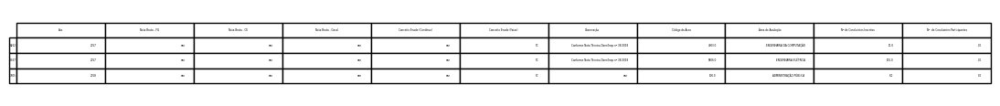

In [ ]:
df = ufpasemaval.copy()

# Criar uma figura vazia
fig, ax = plt.subplots(figsize=(5, 1.25))

# Desativar os eixos
ax.axis('off')

# Criar uma tabela com o conteúdo do DataFrame
tbl = table(ax, df, loc='center', colWidths=[0.25]*len(df.columns), fontsize=80)

# Salvar a tabela como PDF
plt.savefig('cursos sem avaliação registrados.pdf', bbox_inches='tight')

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/cursos sem avaliação registrados.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

In [ ]:
def remover_acentos(txt):
    return ''.join((c for c in unicodedata.normalize('NFD', txt) if unicodedata.category(c) != 'Mn'))

ufpaaval['Área de Avaliação'] = ufpaaval['Área de Avaliação'].apply(remover_acentos)

for index, row in cursos.iterrows():
    seq = row['Nome']
    filtro = ufpaaval['Área de Avaliação'].str.match(seq)

    # Encontre todos os índices onde há correspondência
    indices = filtro[filtro].index

    # Verifique se há correspondências
    if not indices.empty:
      cursos.drop(index, inplace=True)

"""valores = [410,445,476,354,609]
for i in valores:
  cursos.drop(valores, inplace=True)"""

'valores = [410,445,476,354,609]\nfor i in valores:\n  cursos.drop(valores, inplace=True)'

In [ ]:
def remover_acentos(txt):
    return ''.join((c for c in unicodedata.normalize('NFD', txt) if unicodedata.category(c) != 'Mn'))

df_institutos['Nome'] = df_institutos['Nome'].apply(remover_acentos)

for index, row in cursos.iterrows():
    seq = row['Nome']
    filtro = df_institutos['Nome'].str.match(seq)

    # Encontre todos os índices onde há correspondência
    indices = filtro[filtro].index

    # Verifique se há correspondências
    if not indices.empty:
      cursos.drop(index, inplace=True)

"""valores = [410,445,476,354,609]
for i in valores:
  cursos.drop(valores, inplace=True)"""

'valores = [410,445,476,354,609]\nfor i in valores:\n  cursos.drop(valores, inplace=True)'

In [ ]:
aux = 'sem'
for index, row in cursos.iterrows():
  novo=row['Campus']
  if (novo != aux):
    aux=novo
    print('\n',row['Campus'],': ',row['Nome'],'-',row['Modalidade'],';  ', end='')
  else:
    print(row['Nome'],'-',row['Modalidade'],'; ', end='')
  #print(row['Nome'],' & ',row['Campus'],' & ',row['Modalidade'],' \\')


 CCAST - CAMPUS UNIVERSITARIO DE CASTANHAL :  EDUCACAO FISICA - PARFOR - Presencial ;  
 ICA - INSTITUTO DE CIENCIAS DA ARTE :  CINEMA E AUDIOVISUAL - Presencial ;  CINEMA E AUDIOVISUAL - INTENSIVO - Presencial ; DANCA - Presencial ; MUSEOLOGIA - Presencial ; PRODUCAO CENICA - Presencial ; PRODUCAO MULTIMIDIA - Presencial ; TEATRO - Presencial ; 
 ICB - INSTITUTO DE CIENCIAS BIOLOGICAS :  BIOTECNOLOGIA - Presencial ;  CIENCIAS BIOLOGICAS (EAD) - A Dist?cia ; CIENCIAS BIOLOGICAS - PARFOR - Presencial ; ENGENHARIA DE BIOPROCESSOS - Presencial ; 
 ICED - INSTITUTO DE CIENCIAS DA EDUCACAO :  ENSINO RELIGIOSO (LIC) - Presencial ;  PEDAGOGIA - PARFOR - Presencial ; 
 ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS :  CIENCIAS NATURAIS - Presencial ;  CIENCIAS NATURAIS - INTENSIVO - Presencial ; ESTATISTICA - Presencial ; FISICA (EAD) - A Dist?cia ; FISICA - PARFOR - Presencial ; MATEMATICA (EAD) - A Dist?cia ; MATEMATICA - INTENSIVO - Presencial ; MATEMATICA - PARFOR - Presencial ; QUIMICA (

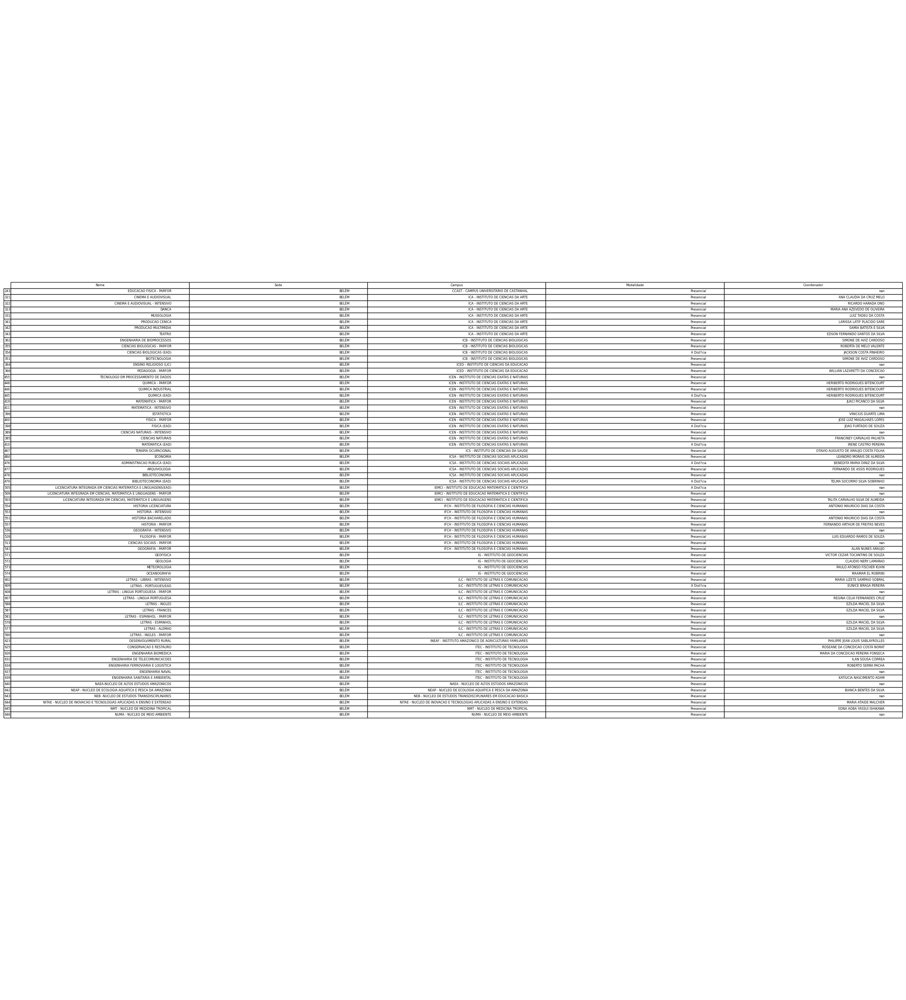

In [ ]:
cursos = cursos.sort_values(by='Campus')

df = cursos.copy()

# Criar uma figura vazia
fig, ax = plt.subplots(figsize=(25, 35))

# Desativar os eixos
ax.axis('off')

# Criar uma tabela com o conteúdo do DataFrame
tbl = table(ax, df, loc='center', colWidths=[0.25]*len(df.columns), fontsize=80)

# Salvar a tabela como PDF
plt.savefig('cursos sem avaliação registrados.pdf', bbox_inches='tight')

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
##images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
##plt.savefig(f"{images_dir}/cursos sem avaliação registrados.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

In [ ]:
ufpa_2014_sem_valores

,Ano,Cód Area,Área,Cód. IES,Nome da IES,Cod. Município,Nome do Município,UF do Curso,Inscritos,Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação


In [ ]:
ufpa_2015_sem_valores

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo)


In [ ]:
ufpa_2016_sem_valores

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Unnamed: 21


In [ ]:
ufpa_2017_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
6462,2017,4003,ENGENHARIA DA COMPUTAÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1179144,Educação Presencial,...,PA,11,0,NaN,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018
8367,2017,5806,ENGENHARIA ELÉTRICA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,53193,Educação Presencial,...,PA,101,0,NaN,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018


In [ ]:
ufpa_2018_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
7605,2018,100,ADMINISTRAÇÃO PÚBLICA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1203245,Educação a Distância,...,PA,6,0,NaN,NaN,NaN,NaN,NaN,SC,NaN


In [ ]:
ufpa_2019_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação


##Primeiro Triênio

###Não avaliados

In [ ]:
sem_2014 = df_2014_sem_valores['Nome da IES'].value_counts()
sem_2015 = df_2015_sem_valores['Nome da IES'].value_counts()
sem_2016 = df_2016_sem_valores['Nome da IES'].value_counts()
# Convert the whole dataframe as a string and display
sem_2014 = sem_2014.to_string()
sem_2015 = sem_2015.to_string()
sem_2016 = sem_2016.to_string()

In [ ]:
ufpa_2014_sem_valores

,Ano,Cód Area,Área,Cód. IES,Nome da IES,Cod. Município,Nome do Município,UF do Curso,Inscritos,Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação


In [ ]:
ufpa_2015_sem_valores

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Nota Bruta - Geral,Nota Padronizada - Geral,Conceito Enade (Contínuo)


In [ ]:
ufpa_2016_sem_valores

,Ano,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Código da Área,Área de Enquadramento,Modalidade de Ensino,...,Sigla da UF,Concluintes Inscritos,Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Unnamed: 21


###Avaliados

In [ ]:
#criando o dataframe do primeiro trienio
ufpaprimeiro = pd.concat([ufpa_2016,ufpa_2015, ufpa_2014])
dfprimeiro = pd.concat([ufpa_2016,ufpa_2015, ufpa_2014])
belemprimeiro = pd.concat([ufpa_2016,ufpa_2015, ufpa_2014])

In [ ]:
ufpaprimeiro = ufpaprimeiro.sort_values(by='Conceito Enade (Contínuo)')
belemprimeiro = ufpaprimeiro.sort_values(by='Conceito Enade (Contínuo)')
dfprimeiro = ufpaprimeiro.sort_values(by='Conceito Enade (Contínuo)')

In [ ]:
mediageral = ufpaprimeiro['Conceito Enade (Contínuo)'].mean()
mediageral1 = mediageral
media1 = []
fg1 = []
ce1 = []

### Geral

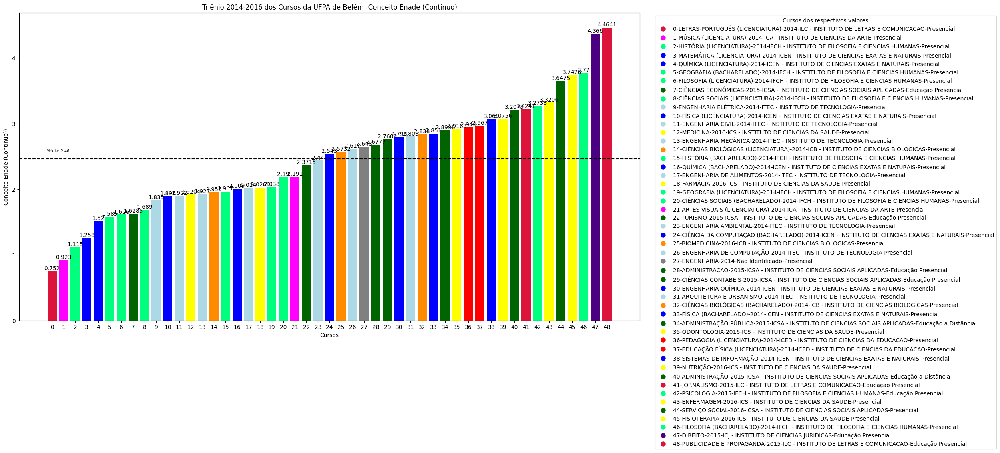

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = ufpaprimeiro['Área de Avaliação'].astype(str) + '-' + ufpaprimeiro['Ano'].astype(str) + '-' + ufpaprimeiro['Instituto'].astype(str)  + '-' + ufpaprimeiro['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ufpaprimeiro['Conceito Enade (Contínuo)'], color=ufpaprimeiro['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpaprimeiro['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpaprimeiro['Conceito Enade (Contínuo)'], color=ufpaprimeiro['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Triênio 2014-2016 dos Cursos da UFPA de Belém, Conceito Enade (Contínuo)', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Triênio 2014-2016 dos Cursos da UFPA de Belém, Conceito Enade (Contínuo).pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
#media1.append(mediageral)

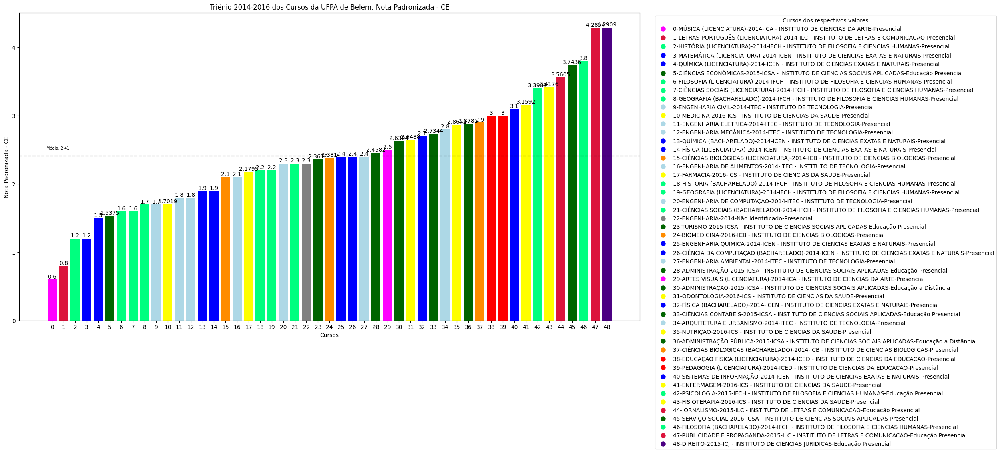

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
mediageral = ufpaprimeiro[avalia].mean()
mediageral1 = mediageral
ufpaprimeiro = ufpaprimeiro.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = ufpaprimeiro['Área de Avaliação'].astype(str) + '-' + ufpaprimeiro['Ano'].astype(str) + '-' + ufpaprimeiro['Instituto'].astype(str)  + '-' + ufpaprimeiro['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ufpaprimeiro[avalia], color=ufpaprimeiro['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpaprimeiro['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpaprimeiro[avalia], color=ufpaprimeiro['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')
titulo = 'Triênio 2014-2016 dos Cursos da UFPA de Belém, ' + avalia
plt.title( titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
geralce = mediageral
ufpaprimeiro = ufpaprimeiro.sort_values(by='Conceito Enade (Contínuo)')
mediageral = ufpaprimeiro['Conceito Enade (Contínuo)'].mean()
mediageral1 = mediageral

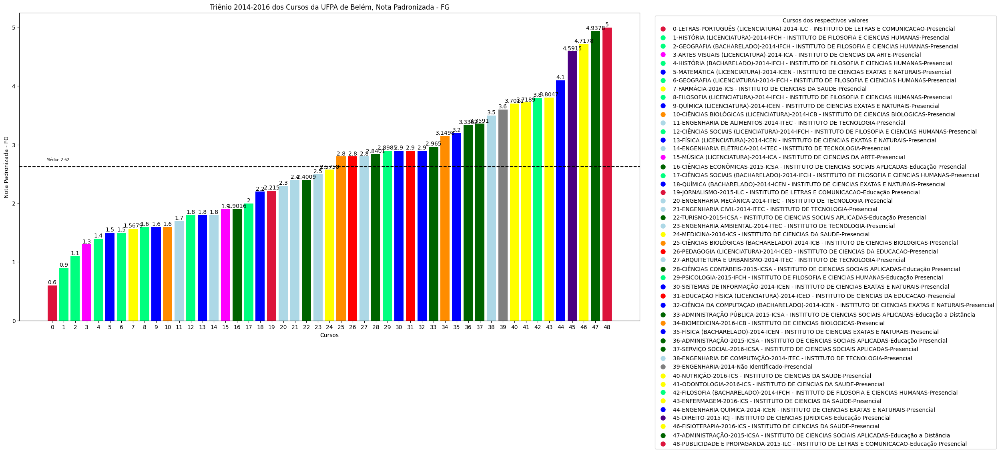

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
mediageral = ufpaprimeiro[avalia].mean()
mediageral1 = mediageral
ufpaprimeiro = ufpaprimeiro.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = ufpaprimeiro['Área de Avaliação'].astype(str) + '-' + ufpaprimeiro['Ano'].astype(str) + '-' + ufpaprimeiro['Instituto'].astype(str)  + '-' + ufpaprimeiro['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ufpaprimeiro[avalia], color=ufpaprimeiro['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpaprimeiro['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpaprimeiro[avalia], color=ufpaprimeiro['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')
titulo = 'Triênio 2014-2016 dos Cursos da UFPA de Belém, ' + avalia
plt.title( titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
geralfg = mediageral
ufpaprimeiro = ufpaprimeiro.sort_values(by='Conceito Enade (Contínuo)')
mediageral = ufpaprimeiro['Conceito Enade (Contínuo)'].mean()
mediageral1 = mediageral

### ICEN

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaicen = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
icen1 = instituto
media1.append(mediaicen)
fg1.append(mediafg)
ce1.append(mediace)

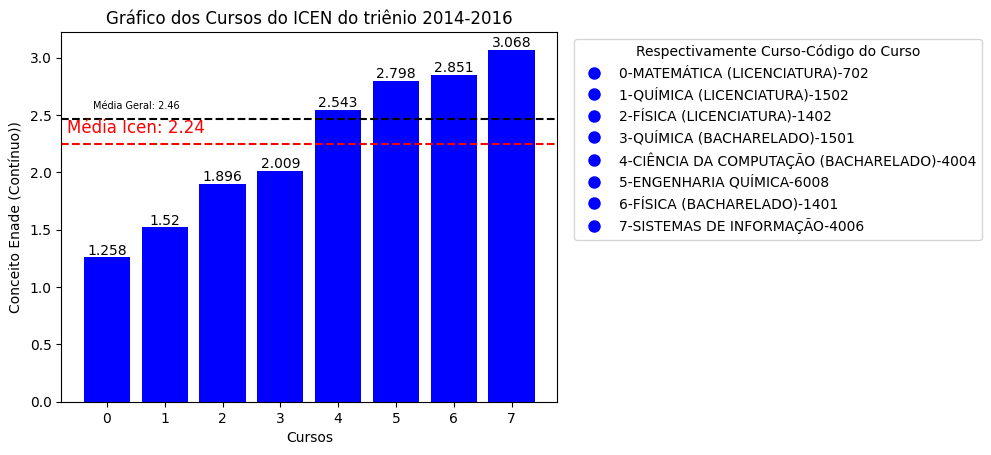

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) # + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaicen
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média Icen: {mediaicen:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.085, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICEN do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICEN do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

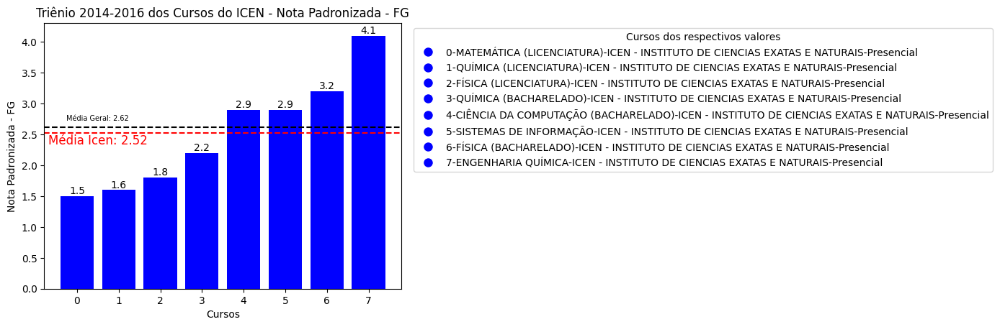

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y-0.18, f'Média Icen: {mediafg:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICEN - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

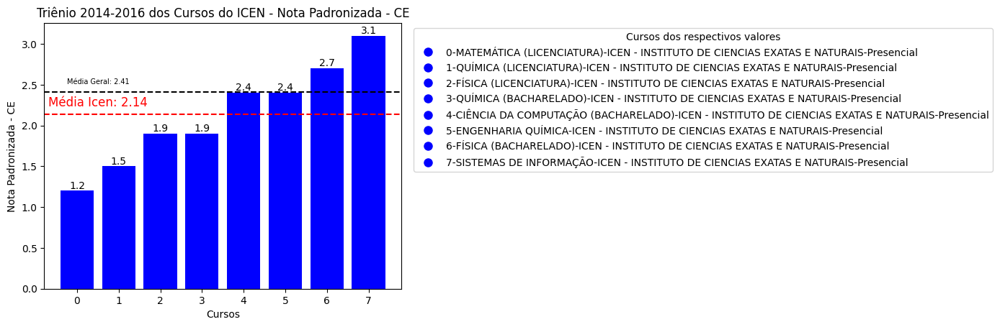

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média Icen: {mediace:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICEN - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### IFCH

In [ ]:
# Código dos cursos de belém
valor_desejado = 'IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaifch = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
ifch1 = instituto
media1.append(mediaifch)
fg1.append(mediafg)
ce1.append(mediace)

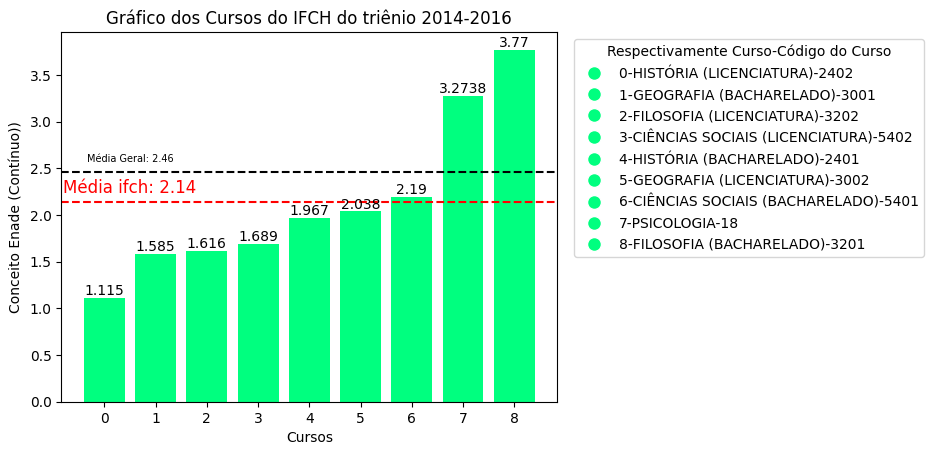

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-'  + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaifch
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ifch: {mediaifch:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do IFCH do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do IFCH do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

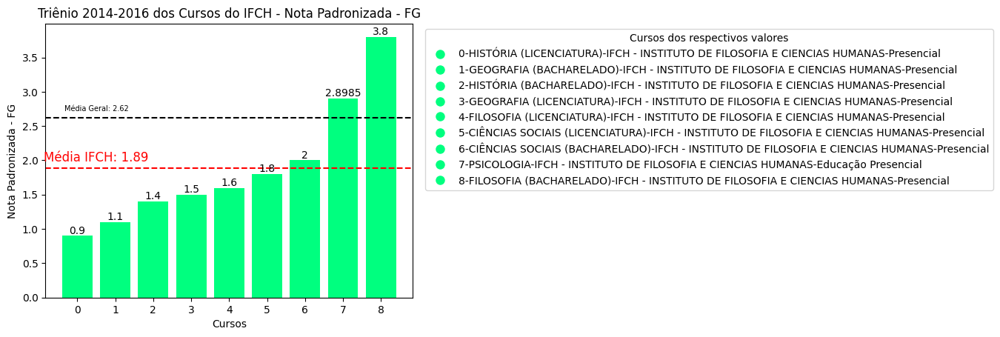

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média IFCH: {mediafg:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do IFCH - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

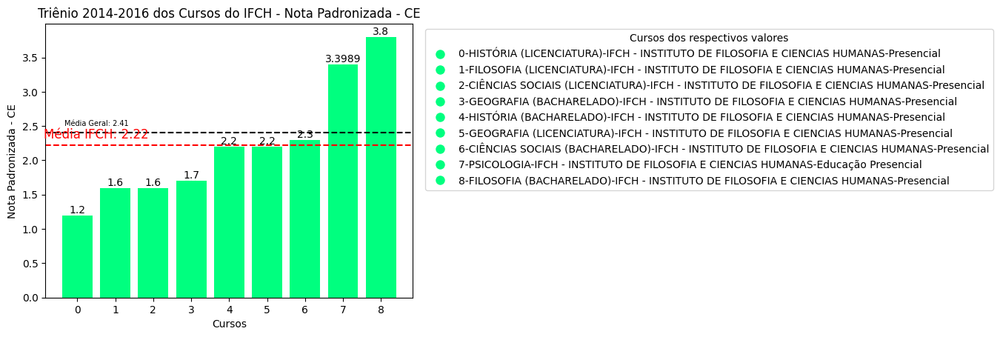

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média IFCH: {mediace:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do IFCH - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICSA

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaicsa = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
icsa1 = instituto
media1.append(mediaicsa)
fg1.append(mediafg)
ce1.append(mediace)

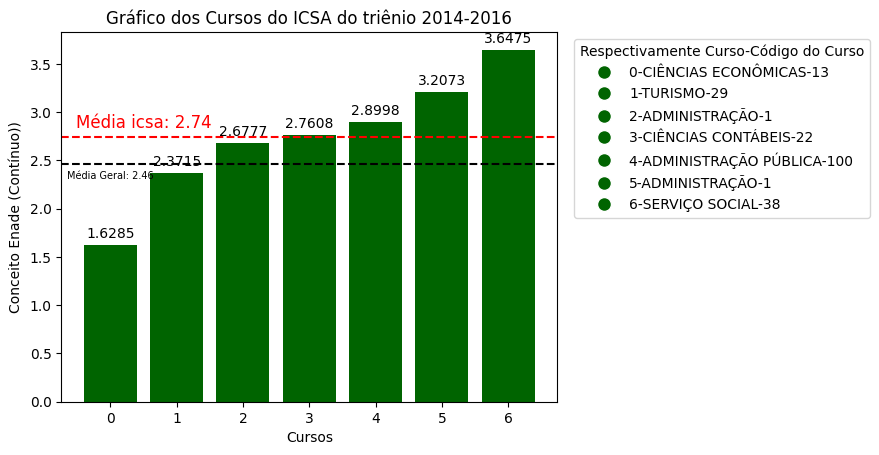

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge", padding=3)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaicsa
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média icsa: {mediaicsa:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y2-0.15, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICSA do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICSA do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

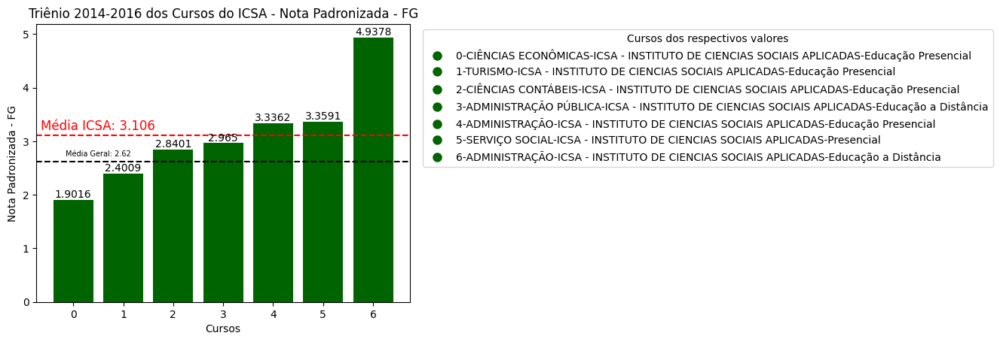

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICSA: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICSA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

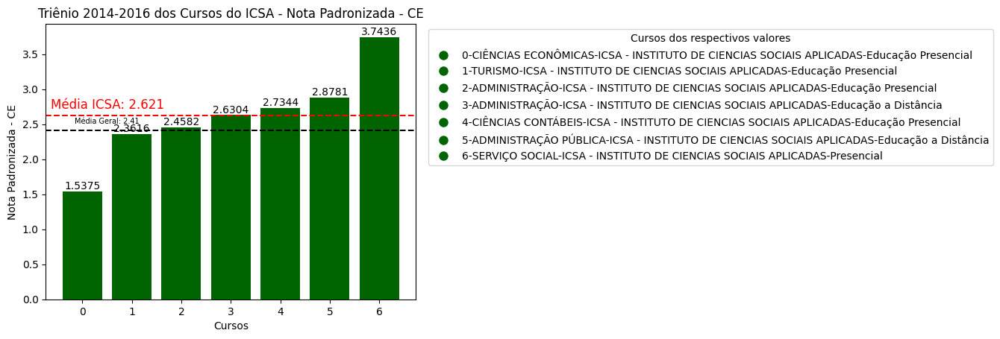

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICSA: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICSA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICB

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICB - INSTITUTO DE CIENCIAS BIOLOGICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaicb = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
icb1 = instituto
media1.append(mediaicb)
fg1.append(mediafg)
ce1.append(mediace)

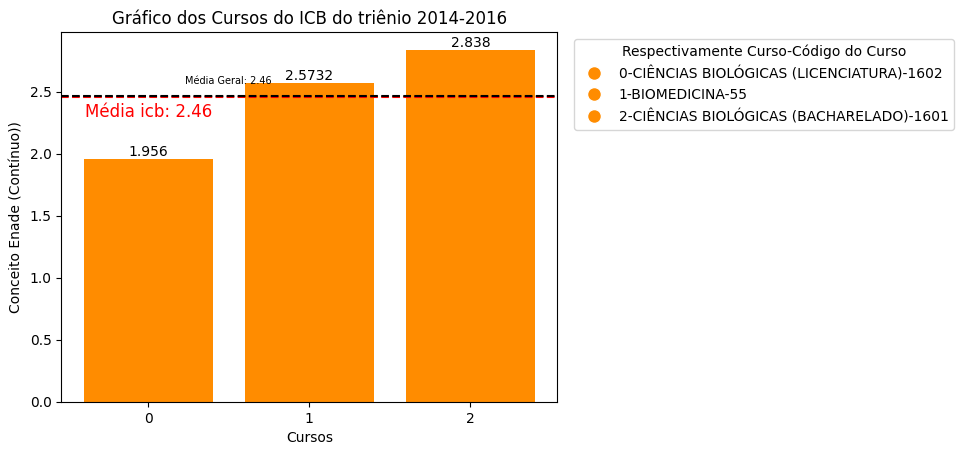

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaicb
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y-0.16, f'Média icb: {mediaicb:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICB do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICB do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

In [ ]:
posicao_y2

2.464824489795918

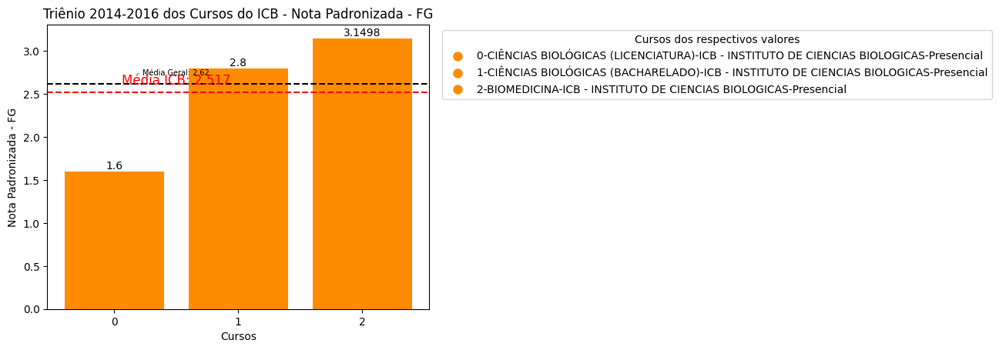

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICB: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICB - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

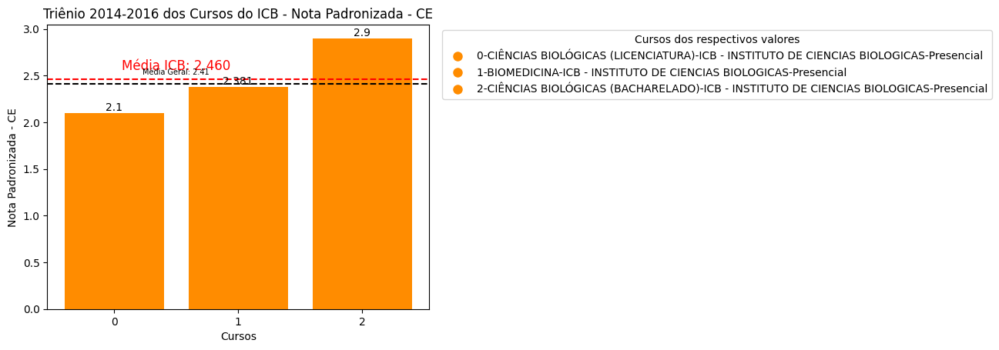

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICB: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICB - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICA

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICA - INSTITUTO DE CIENCIAS DA ARTE'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaica = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
ica1 = instituto
media1.append(mediaica)
fg1.append(mediafg)
ce1.append(mediace)

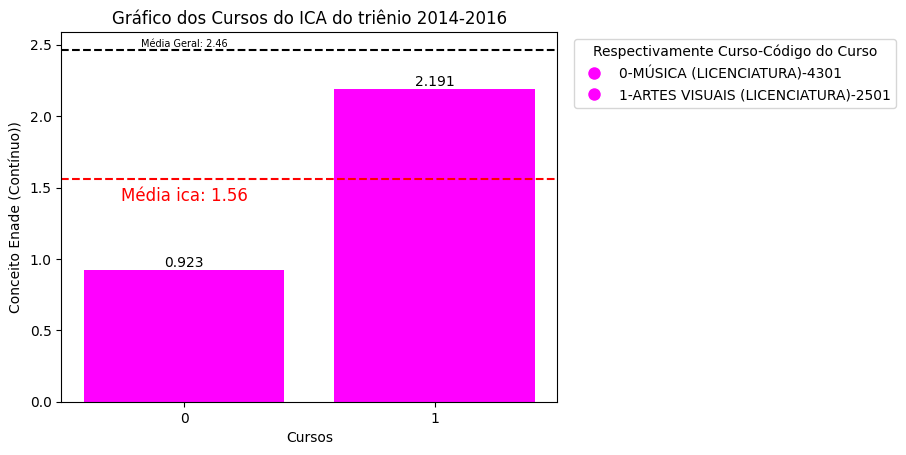

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaica
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y-0.15, f'Média ica: {mediaica:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y2+0.02, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICA do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICA do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

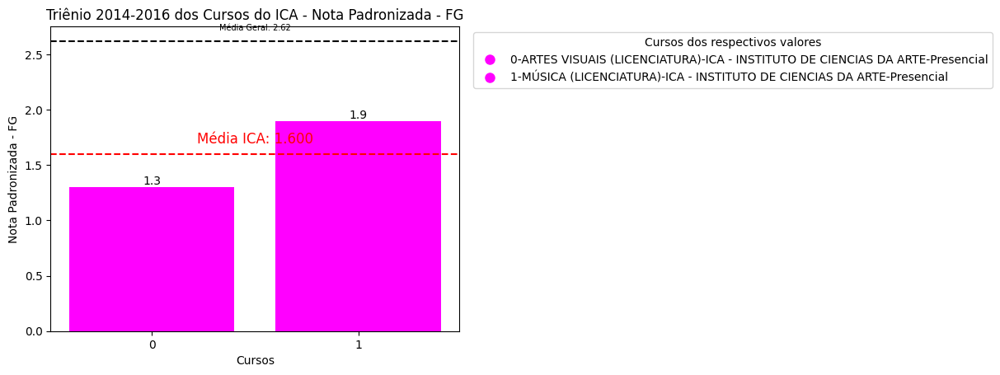

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICA: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

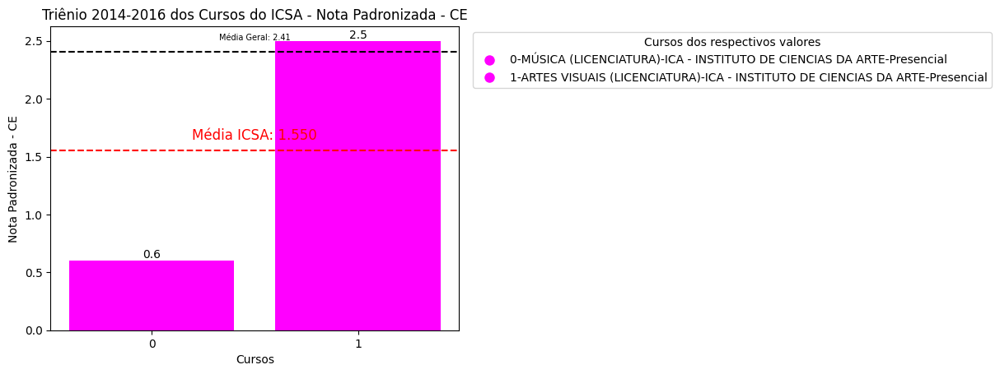

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICSA: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICSA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ILC

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ILC - INSTITUTO DE LETRAS E COMUNICACAO'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediailc = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
ilc1 = instituto
media1.append(mediailc)
fg1.append(mediafg)
ce1.append(mediace)

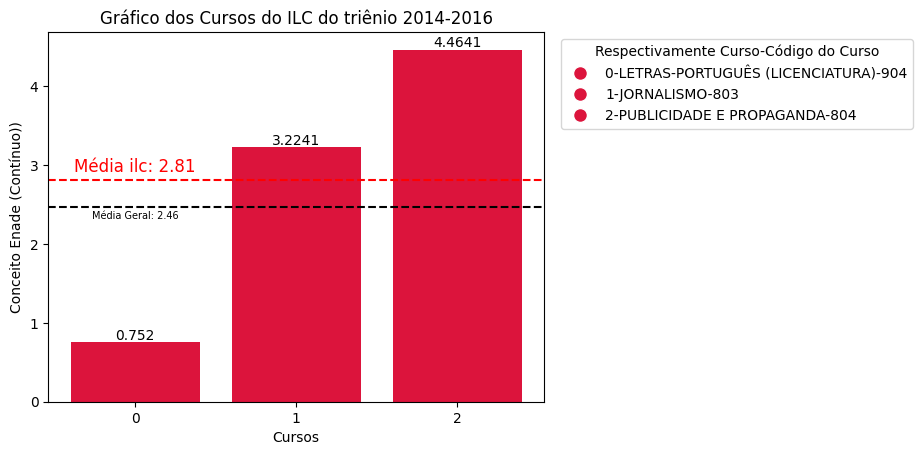

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediailc
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y+0.1, f'Média ilc: {mediailc:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0, posicao_y2-0.15, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ILC do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ILC do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

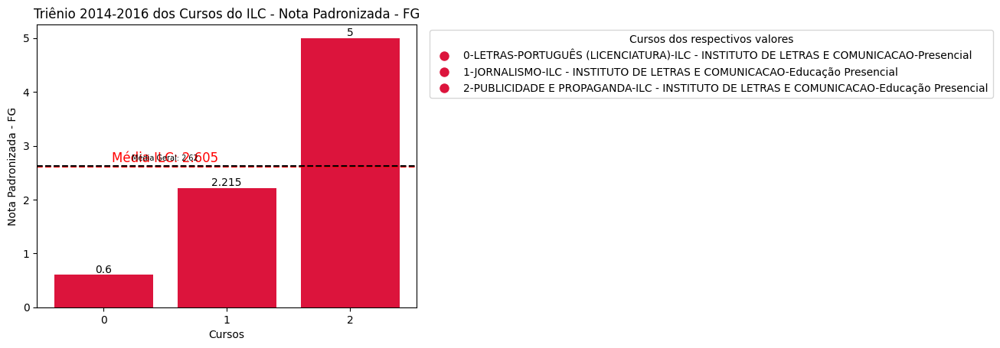

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ILC: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ILC - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

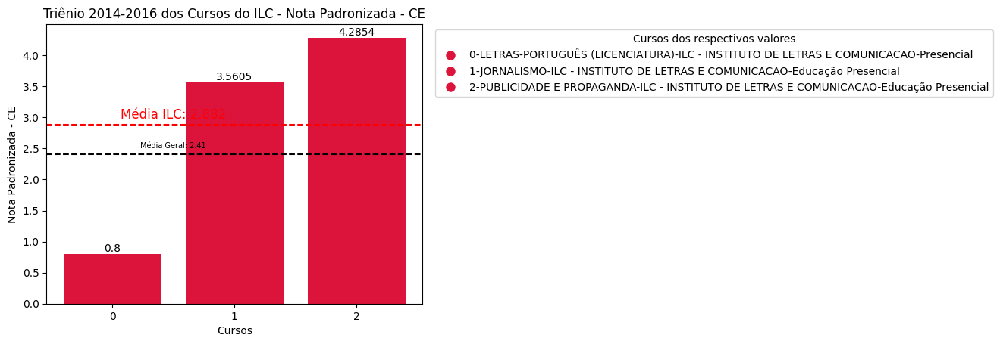

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ILC: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ILC - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ITEC

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ITEC - INSTITUTO DE TECNOLOGIA'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaitec = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
itec1 = instituto
media1.append(mediaitec)
fg1.append(mediafg)
ce1.append(mediace)

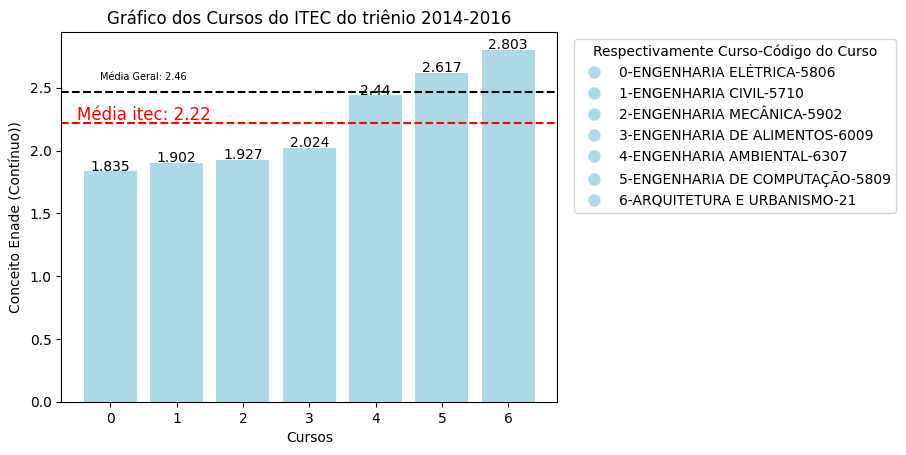

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge", padding=-1.5)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaitec
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.02, f'Média itec: {mediaitec:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ITEC do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ITEC do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

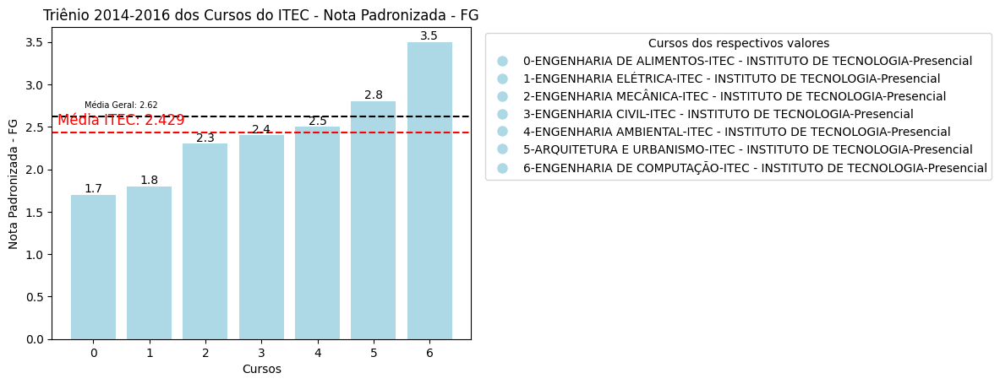

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ITEC: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ITEC - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

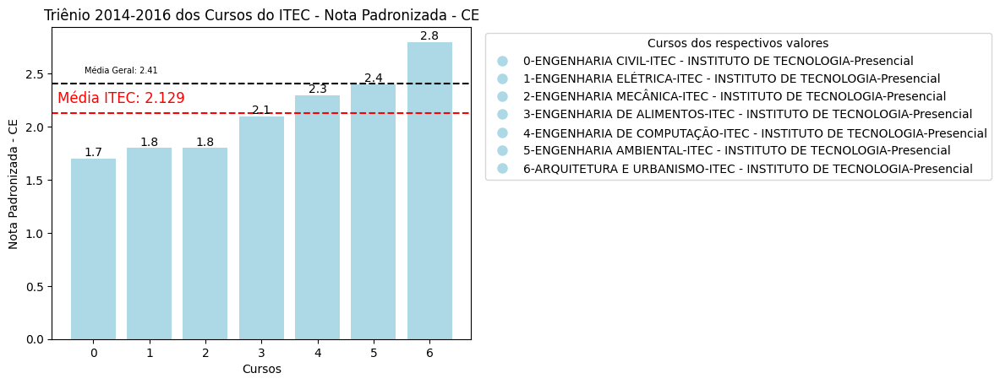

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ITEC: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ITEC - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICM

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICM - INSTITUTO DE CIENCIAS MEDICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaicm = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
icm1 = instituto
#media1.append(mediaicm)
#fg1.append(mediafg)
#ce1.append(mediace)

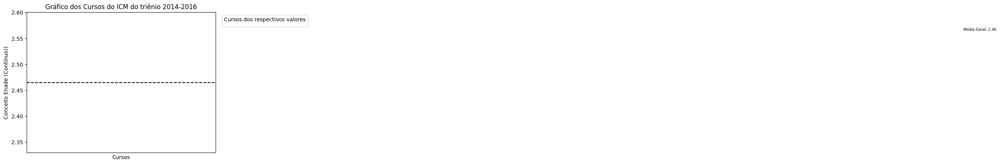

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaicm
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média icm: {mediaicm:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICM do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICM do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

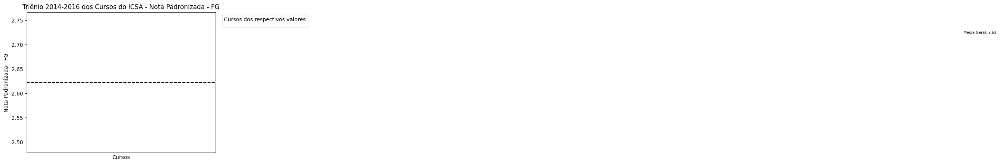

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICSA: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICSA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

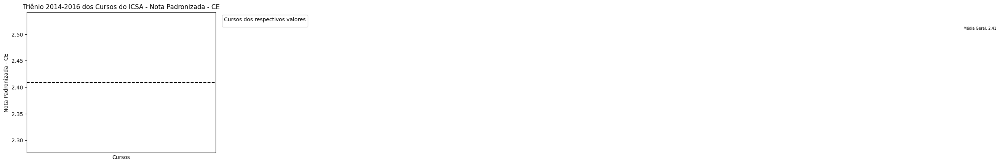

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICSA: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICSA - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICED

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICED - INSTITUTO DE CIENCIAS DA EDUCACAO'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaiced = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
iced1 = instituto
media1.append(mediaiced)
fg1.append(mediafg)
ce1.append(mediace)

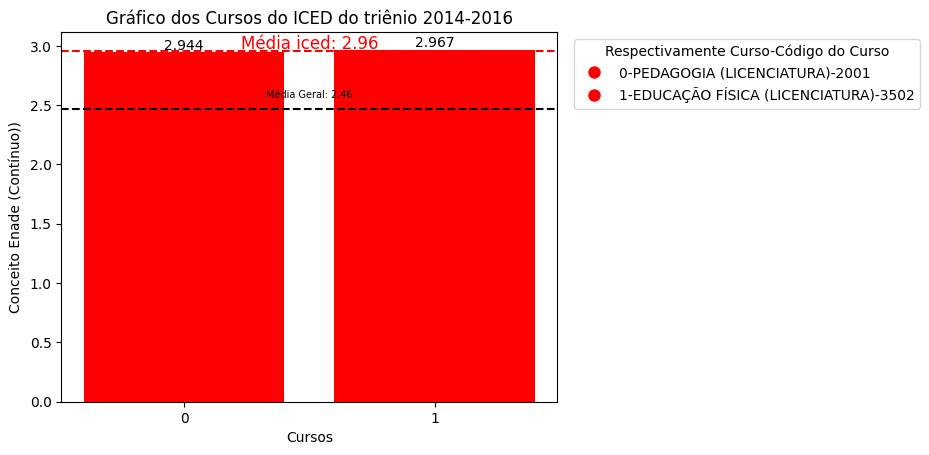

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaiced
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.02, f'Média iced: {mediaiced:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICED do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICED do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

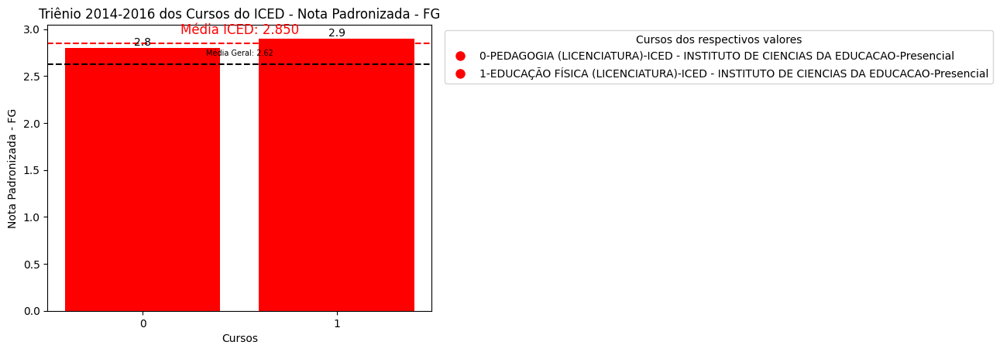

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICED: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICED - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

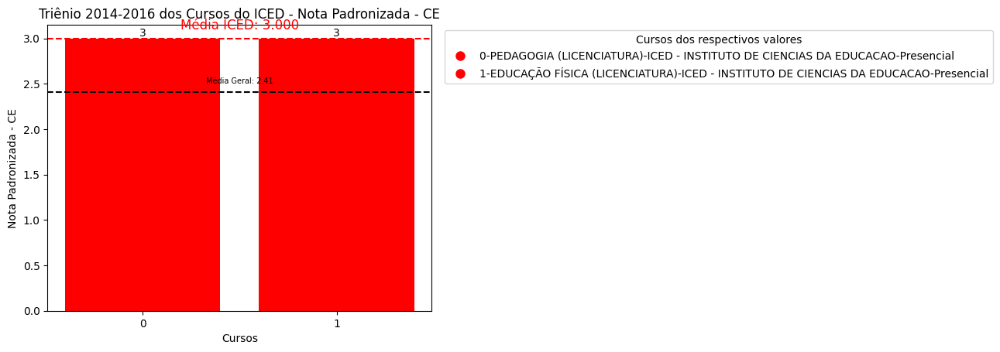

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICED: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICED - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.figure(figsize=(100, 100))
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

* Comparação rápida de pedagogia com outros cursos de belém

In [ ]:
# Código dos cursos de belém
valor_desejado = 2001

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
pedagogia = belemprimeiro[belemprimeiro['Código da Área'] == valor_desejado]

#media do instituto
mediapedag = pedagogia['Conceito Enade (Contínuo)'].mean()
pedagogia

,Ano,Nome da IES,Sigla da IES,Código do Curso,Código da Área,Área de Avaliação,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Grau Acadêmico,Observação,Instituto,Cor
3772,2014,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11996,2001,PEDAGOGIA (LICENCIATURA),Presencial,BELEM,615,555.0,2.8,3.0,2.944,LICENCIATURA,NaN,ICED - INSTITUTO DE CIENCIAS DA EDUCACAO,#FF0000


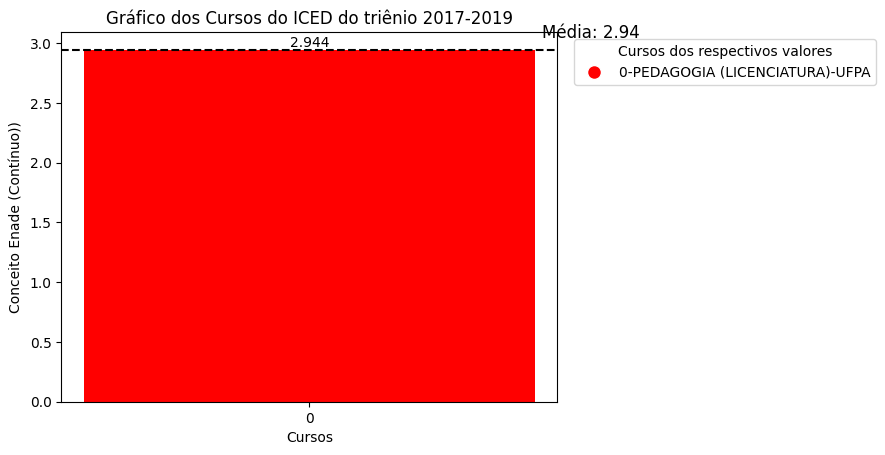

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = pedagogia['Área de Avaliação'].astype(str) + '-' + pedagogia['Sigla da IES'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, pedagogia['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='red') for label in listat]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,pedagogia['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediapedag
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediapedag:.2f}', color='black', fontsize=12, ha='center')

plt.title('Gráfico dos Cursos do ICED do triênio 2017-2019', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico

### ICJ

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICJ - INSTITUTO DE CIENCIAS JURIDICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaicj = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
icj1 = instituto
media1.append(mediaicj)
fg1.append(mediafg)
ce1.append(mediace)

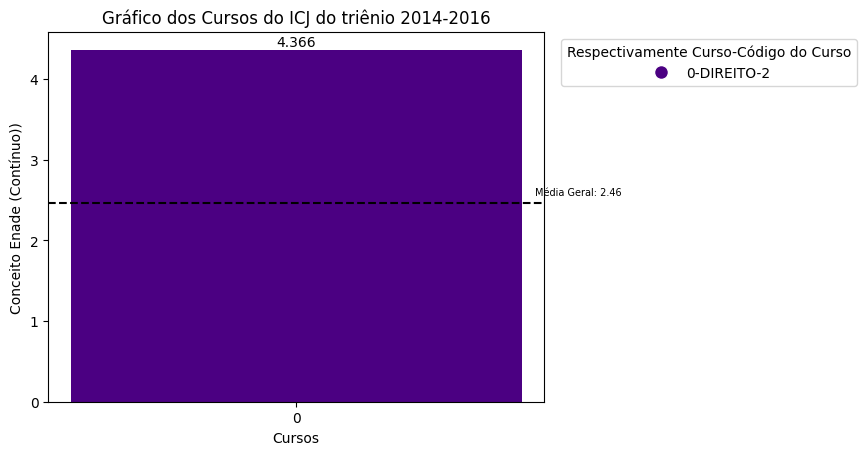

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
"""posicao_y = mediaicj
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(-0.3, posicao_y+0.1, f'Média icj: {mediaicj:.2f}', color='red', fontsize=12, ha='center')"""  #não colocado por ser só um

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICJ do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICJ do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

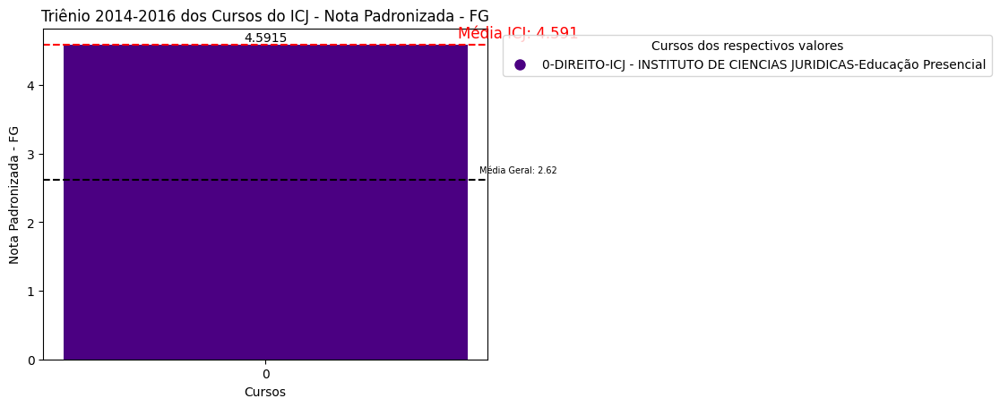

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICJ: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICJ - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

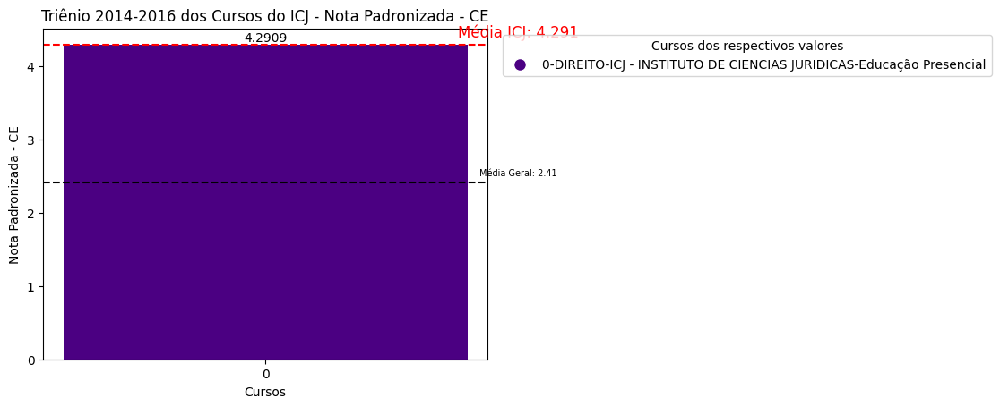

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICJ: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICJ - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICS

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICS - INSTITUTO DE CIENCIAS DA SAUDE'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]

#media do instituto
mediaics = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
ics1 = instituto
media1.append(mediaics)
fg1.append(mediafg)
ce1.append(mediace)

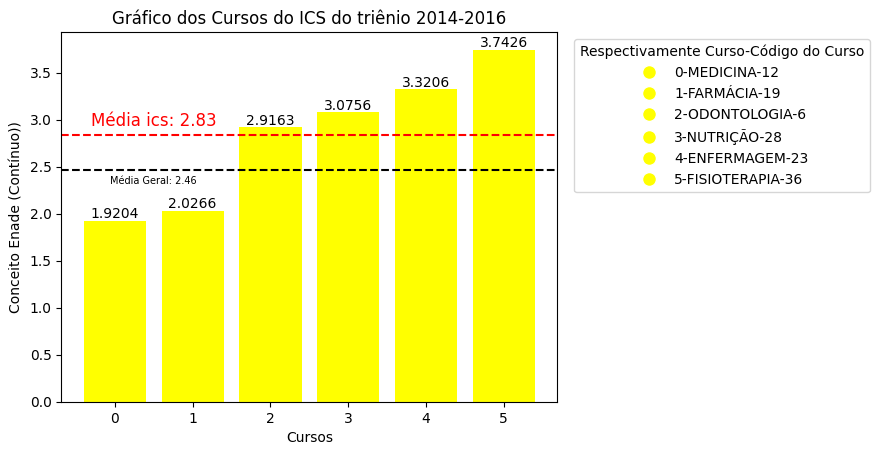

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) #+ instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaics
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ics: {mediaics:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.15, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do ICS do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do ICS do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

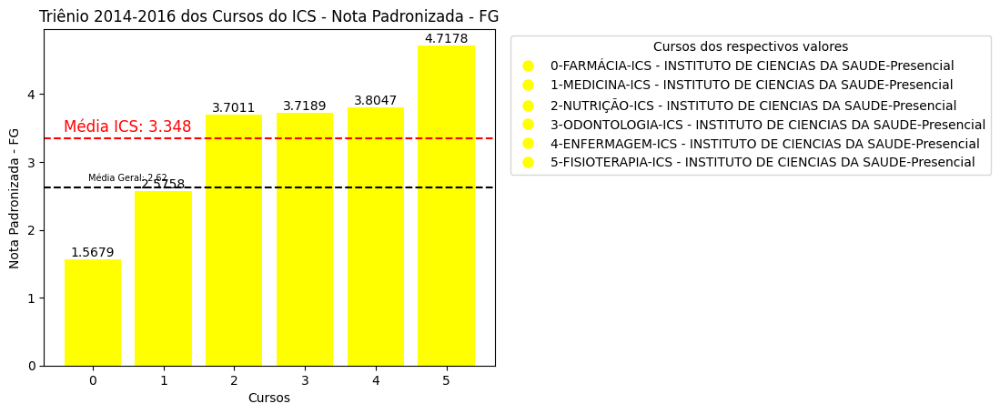

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICS: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICS - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

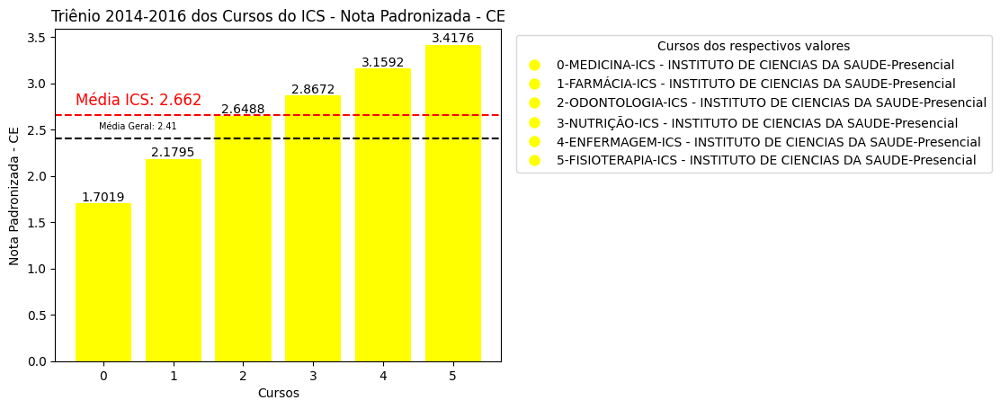

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média ICS: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do ICS - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### Sem Instituto

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Não Identificado'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpaprimeiro[ufpaprimeiro['Instituto'] == valor_desejado]
sem1 = instituto

#media do instituto
mediasem = instituto['Conceito Enade (Contínuo)'].mean()
mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
media1.append(mediasem)
fg1.append(mediafg)
ce1.append(mediace)

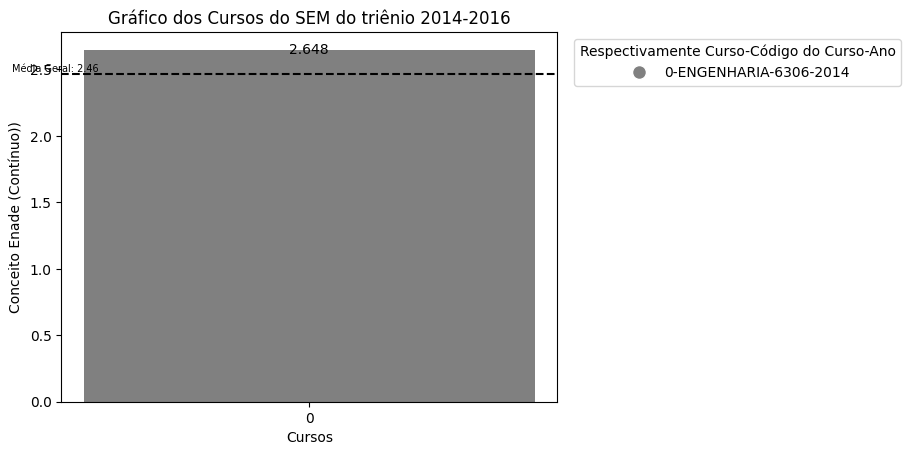

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str) + '-' + instituto['Ano'].astype(str)#  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Respectivamente Curso-Código do Curso-Ano", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge", padding=-5)

# Adicionar uma linha horizontal na posição y desejada
"""posicao_y = mediasem
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média sem: {mediasem:.2f}', color='red', fontsize=12, ha='center')""" #não add por ser só 1

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(-0.45, posicao_y2+0.02, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos do SEM do triênio 2014-2016', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Gráfico dos Cursos do SEM do triênio 2014-2016.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

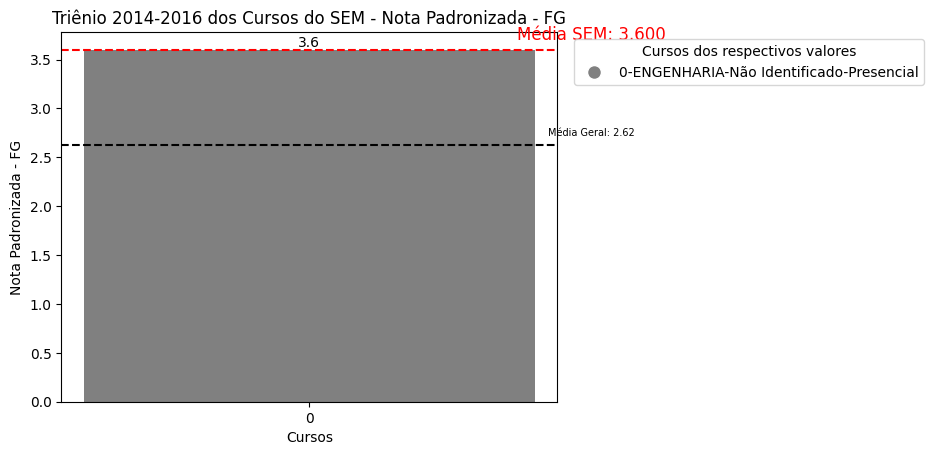

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediafg
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média SEM: {mediafg:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do SEM - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

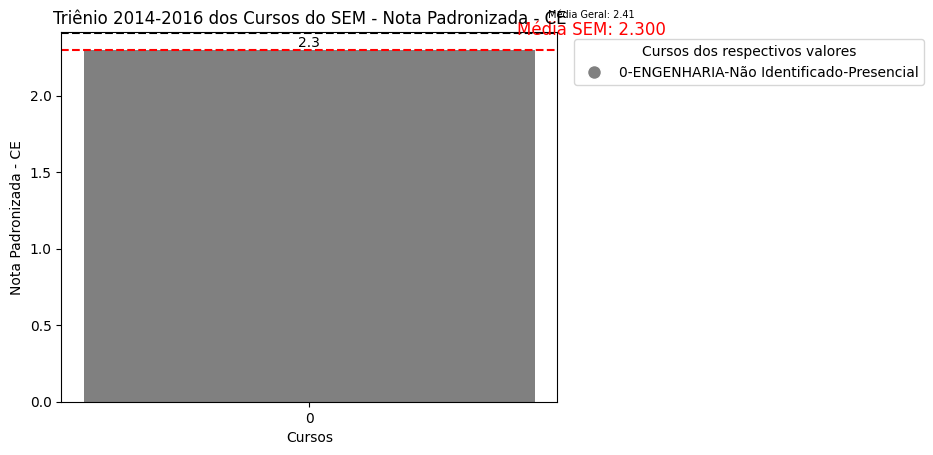

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto = instituto.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediace
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média SEM: {mediace:.3f}', color='red', fontsize=12, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2014-2016 dos Cursos do SEM - ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### Comparação de Institutos

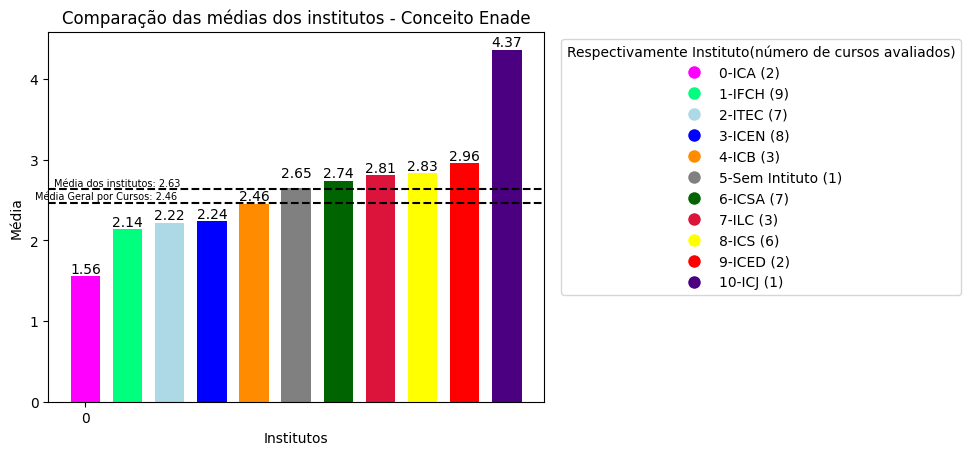

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (8)', 'IFCH (9)', 'ICSA (7)', 'ICB (3)', 'ICA (2)', 'ILC (3)', 'ITEC (7)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (1)']
medias = [mediaicen, mediaifch, mediaicsa, mediaicb, mediaica, mediailc, mediaitec, mediaiced, mediaicj, mediaics, mediasem]
#medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

#Ordenando todas as listas de acordo com a media
dados_combinados = list(zip(range(len(medias)), cursos, medias, cores))
dados_combinados.sort(key=lambda x: x[2])
cursos = [item[1] for item in dados_combinados]
medias = [item[2] for item in dados_combinados]
cores = [item[3] for item in dados_combinados]

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Respectivamente Instituto(número de cursos avaliados)", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    if (i != 5):
      plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')
    else:
      plt.text(cursos[i], media+0.1, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.04, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.04, f'Média Geral por Cursos: {mediageral :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos - Conceito Enade")

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Comparação das médias dos institutos - Conceito Enade.pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

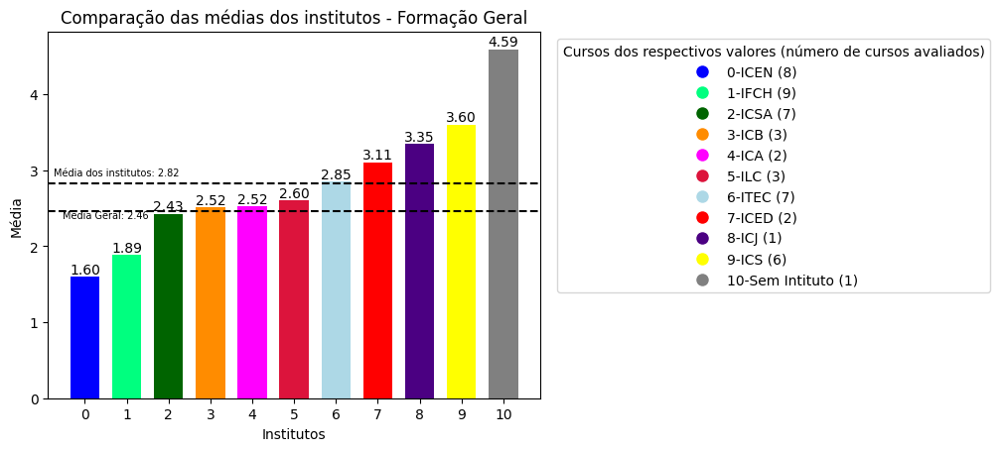

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (8)', 'IFCH (9)', 'ICSA (7)', 'ICB (3)', 'ICA (2)', 'ILC (3)', 'ITEC (7)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (1)']
medias = fg1
medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores (número de cursos avaliados)", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos - Formação Geral")

# Exibir o gráfico
plt.show()

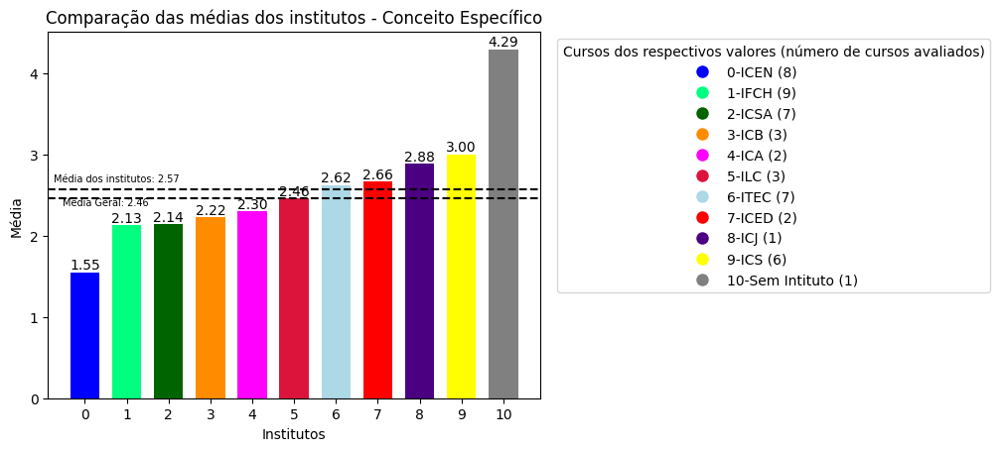

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (8)', 'IFCH (9)', 'ICSA (7)', 'ICB (3)', 'ICA (2)', 'ILC (3)', 'ITEC (7)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (1)']
medias = ce1
medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores (número de cursos avaliados)", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos - Conceito Específico")

# Exibir o gráfico
plt.show()

##Segundo Triênio

###Não Avaliados

In [ ]:
ufpa_2017_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
6462,2017,4003,ENGENHARIA DA COMPUTAÇÃO,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1179144,Educação Presencial,...,PA,11,0,NaN,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018
8367,2017,5806,ENGENHARIA ELÉTRICA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,53193,Educação Presencial,...,PA,101,0,NaN,NaN,NaN,NaN,NaN,SC,Conforme Nota Técnica Daes/Inep nº 38/2018


In [ ]:
ufpa_2018_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação
7605,2018,100,ADMINISTRAÇÃO PÚBLICA,569,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,Universidade,Pública Federal,1203245,Educação a Distância,...,PA,6,0,NaN,NaN,NaN,NaN,NaN,SC,NaN


In [ ]:
ufpa_2019_sem_valores

,Ano,Código da Área,Área de Avaliação,Código da IES,Nome da IES,Sigla da IES,Organização Acadêmica,Categoria Administrativa,Código do Curso,Modalidade de Ensino,...,Sigla da UF,Nº de Concluintes Inscritos,Nº de Concluintes Participantes,Nota Bruta - FG,Nota Padronizada - FG,Nota Bruta - CE,Nota Padronizada - CE,Conceito Enade (Contínuo),Conceito Enade (Faixa),Observação


###Avaliados

In [ ]:
#criando o dataframe do primeiro trienio
ufpasegundo = pd.concat([ufpa_2019,ufpa_2018, ufpa_2017])
dfsegundo = pd.concat([df_2019,df_2018, df_2017])
belemsegundo = pd.concat([belem_2019,belem_2018, belem_2017])

In [ ]:
belemsegundo

,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico
60,2019,5,MEDICINA VETERINÁRIA,UNIVERSIDADE DA AMAZÔNIA,UNAMA,1313832,Educação Presencial,Belém,128,125,1.8031,0.9843,1.1890,NaN,None
109,2019,5,MEDICINA VETERINÁRIA,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,14559,Educação Presencial,Belém,58,57,3.2800,2.4500,2.6575,NaN,None
316,2019,6,ODONTOLOGIA,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12017,Educação Presencial,Belém,92,92,4.2502,3.2973,3.5355,NaN,None
358,2019,6,ODONTOLOGIA,CENTRO UNIVERSITÁRIO DO ESTADO DO PARÁ,CESUPA,18166,Educação Presencial,Belém,48,48,2.9419,2.8918,2.9043,NaN,None
417,2019,6,ODONTOLOGIA,ESCOLA SUPERIOR DA AMAZÔNIA,ESAMAZ,99228,Educação Presencial,Belém,248,239,1.0488,0.4427,0.5943,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10190,2017,6307,ENGENHARIA AMBIENTAL,FACULDADE ESTÁCIO DE BELÉM - ESTÁCIO BELÉM,ESTÁCIO BELÉM,109380,Educação Presencial,Belém,34,33,3.1124,2.1110,2.3614,NaN,None
10302,2017,6405,ENGENHARIA FLORESTAL,UNIVERSIDADE FEDERAL RURAL DA AMAZÔNIA,UFRA,14558,Educação Presencial,Belém,59,55,3.4419,2.2107,2.5185,NaN,None
10379,2017,6407,Letras - Inglês,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,23777,Educação Presencial,Belém,88,76,2.4138,1.8882,2.0196,NaN,None
10420,2017,6407,Letras - Inglês,FACULDADE INTEGRADA BRASIL AMAZONIA - FIBRA,FIBRA,66645,Educação Presencial,Belém,8,6,0.1076,1.7625,1.3488,NaN,None


In [ ]:
ufpasegundo = ufpasegundo.sort_values(by='Conceito Enade (Contínuo)')
belemsegundo = ufpasegundo.sort_values(by='Conceito Enade (Contínuo)')
dfsegundo = ufpasegundo.sort_values(by='Conceito Enade (Contínuo)')

In [ ]:
mediageral = ufpasegundo['Conceito Enade (Contínuo)'].mean()
mediageral2 = mediageral
media2 = []
fg2 = []
ce2 = []

### Geral

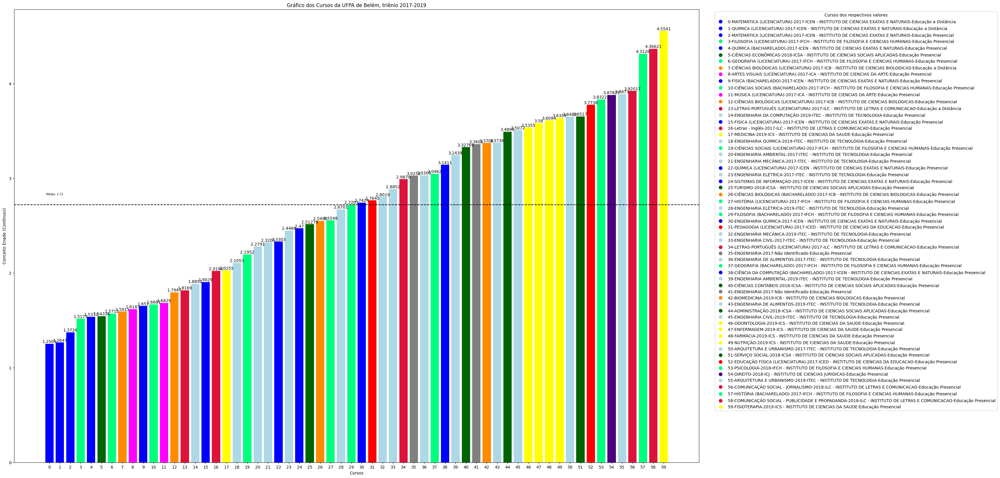

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = ufpasegundo['Área de Avaliação'].astype(str) + '-' + ufpasegundo['Ano'].astype(str) + '-' + ufpasegundo['Instituto'].astype(str)  + '-' + ufpasegundo['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(30, 20))  # Define o tamanho da figura
plt.bar(lista, ufpasegundo['Conceito Enade (Contínuo)'], color=ufpasegundo['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpasegundo['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpasegundo['Conceito Enade (Contínuo)'], color=ufpasegundo['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')

plt.title('Gráfico dos Cursos da UFPA de Belém, triênio 2017-2019', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/Gráfico dos Cursos da UFPA de Belém, triênio 2017-2019.pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
#media2.append(mediageral)

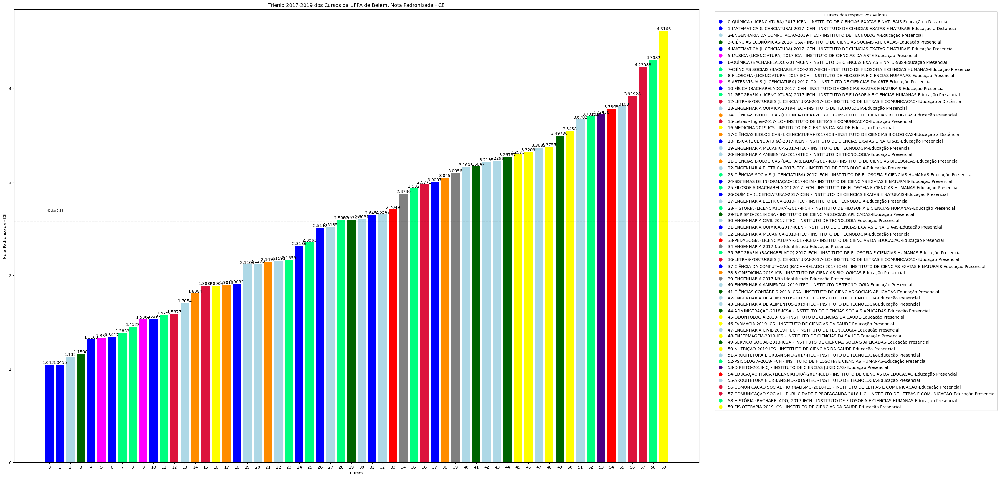

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
mediageral = ufpasegundo[avalia].mean()
mediageral2 = mediageral
geralce2 = mediageral
ufpasegundo = ufpasegundo.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = ufpasegundo['Área de Avaliação'].astype(str) + '-' + ufpasegundo['Ano'].astype(str) + '-' + ufpasegundo['Instituto'].astype(str)  + '-' + ufpasegundo['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(30, 20))  # Define o tamanho da figura
plt.bar(lista, ufpasegundo[avalia], color=ufpasegundo['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpasegundo['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpasegundo[avalia], color=ufpasegundo['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2017-2019 dos Cursos da UFPA de Belém, ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
mediageral = ufpasegundo['Conceito Enade (Contínuo)'].mean()
ufpasegundo = ufpasegundo.sort_values(by='Conceito Enade (Contínuo)')

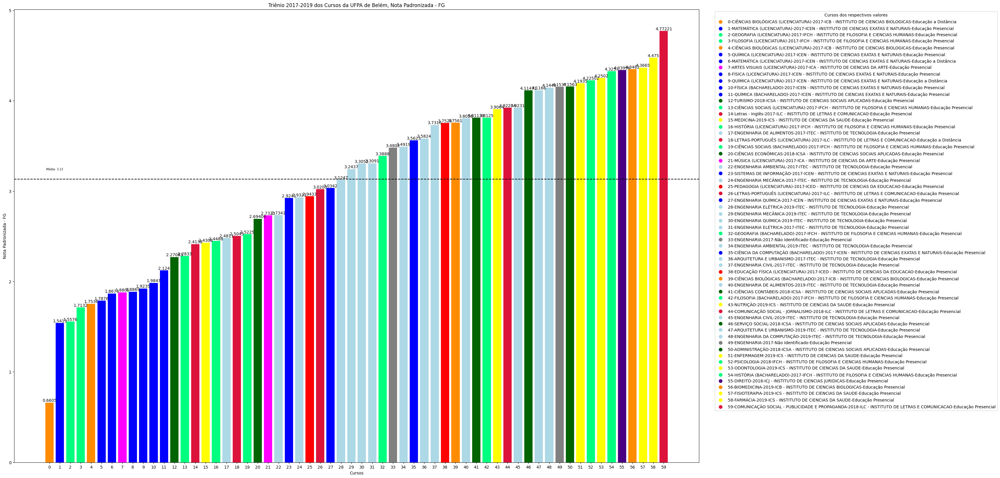

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
mediageral = ufpasegundo[avalia].mean()
geralfg2 = mediageral
ufpasegundo = ufpasegundo.sort_values(by=avalia)
# Concatenando as colunas para criar o eixo y
aux = ufpasegundo['Área de Avaliação'].astype(str) + '-' + ufpasegundo['Ano'].astype(str) + '-' + ufpasegundo['Instituto'].astype(str)  + '-' + ufpasegundo['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
plt.figure(figsize=(30, 20))  # Define o tamanho da figura
plt.bar(lista, ufpasegundo[avalia], color=ufpasegundo['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ufpasegundo['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ufpasegundo[avalia], color=ufpasegundo['Cor'])) , size=10, label_type="edge")

posicao_y = mediageral
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediageral :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Triênio 2017-2019 dos Cursos da UFPA de Belém, ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico
mediageral = ufpasegundo['Conceito Enade (Contínuo)'].mean()
ufpasegundo = ufpasegundo.sort_values(by='Conceito Enade (Contínuo)')

###ICEN

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
icen = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]

#media do instituto
mediaicen = icen['Conceito Enade (Contínuo)'].mean()
mediafg = icen['Nota Padronizada - FG'].mean()
mediace = icen['Nota Padronizada - CE'].mean()
icen2 = icen
media2.append(mediaicen)
fg2.append(mediafg)
ce2.append(mediace)

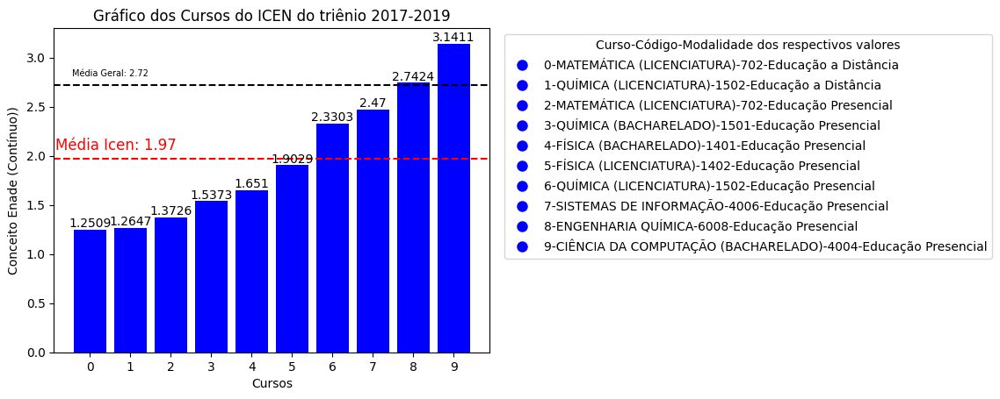

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = icen['Área de Avaliação'].astype(str) + '-' + icen['Código da Área'].astype(str) + '-' + icen['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icen['Conceito Enade (Contínuo)'], color=icen['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icen['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Modalidade dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icen['Conceito Enade (Contínuo)'], color=icen['Cor'])) , size=10, label_type="edge", padding=0)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediaicen
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.65, posicao_y+0.09, f'Média Icen: {mediaicen:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.09, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Gráfico dos Cursos do ICEN do triênio 2017-2019'
plt.title(titulo, loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

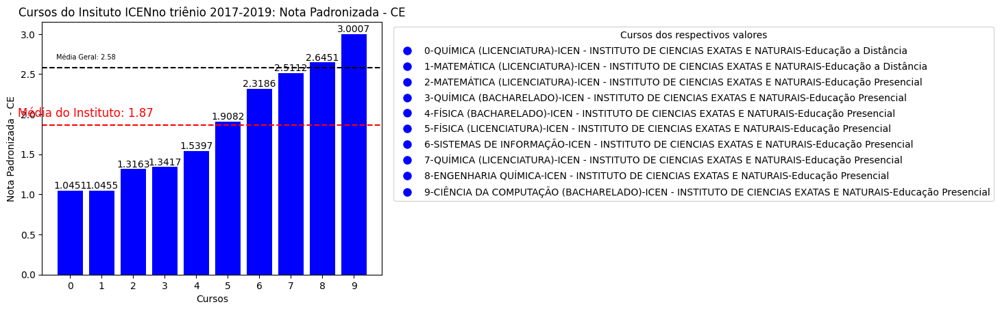

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
icen = icen.sort_values(by=avalia)
area = 'ICEN'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
# Concatenando as colunas para criar o eixo y
aux = icen['Área de Avaliação'].astype(str) + '-' + icen['Instituto'].astype(str)  + '-' + icen['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icen[avalia], color=icen['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icen['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icen[avalia], color=icen['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + 'no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

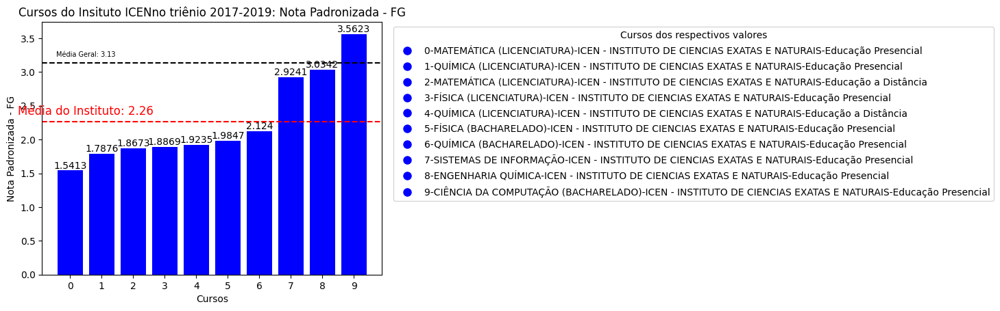

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
icen = icen.sort_values(by=avalia)
area = 'ICEN'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
# Concatenando as colunas para criar o eixo y
aux = icen['Área de Avaliação'].astype(str) + '-' + icen['Instituto'].astype(str)  + '-' + icen['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icen[avalia], color=icen['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icen['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icen[avalia], color=icen['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + 'no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### IFCH

In [ ]:
# Código dos cursos de belém
valor_desejado = 'IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
ifch = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
ifch2 = ifch

#media do instituto
mediaifch = ifch['Conceito Enade (Contínuo)'].mean()
media2.append(mediaifch)

mediafg = ifch['Nota Padronizada - FG'].mean()
mediace = ifch['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

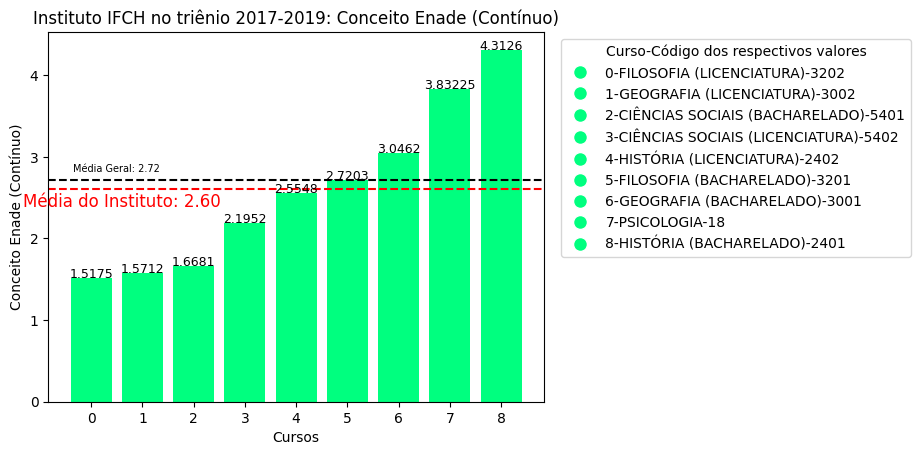

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
ifch = ifch.sort_values(by=avalia)
area = 'IFCH'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg #geral
elif (avalia == 'Nota Padronizada - CE'):
  mediag = geralce #geral
  medial = mediace #local
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = ifch['Área de Avaliação'].astype(str) + '-' + ifch['Código da Área'].astype(str)  #+ '-' + ifch['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ifch[avalia], color=ifch['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ifch['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ifch[avalia], color=ifch['Cor'])) , size=9, label_type="edge", padding=-2)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.6, posicao_y-0.21, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Instituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

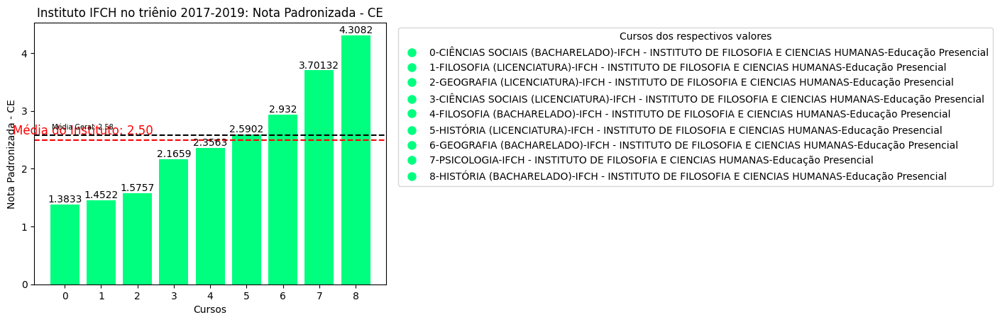

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
ifch = ifch.sort_values(by=avalia)
area = 'IFCH'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  mediag = geralce2 #geral
  medial = mediace #local
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = ifch['Área de Avaliação'].astype(str) + '-' + ifch['Instituto'].astype(str)  + '-' + ifch['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ifch[avalia], color=ifch['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ifch['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ifch[avalia], color=ifch['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Instituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

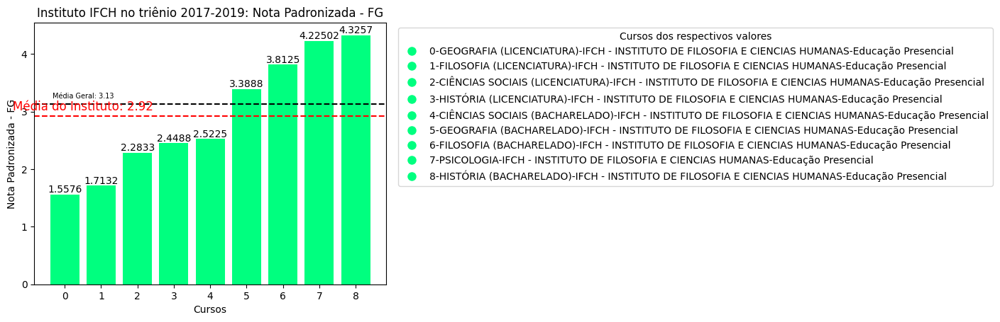

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
ifch = ifch.sort_values(by=avalia)
area = 'IFCH'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  mediag = geralce2 #geral
  medial = mediace #local
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = ifch['Área de Avaliação'].astype(str) + '-' + ifch['Instituto'].astype(str)  + '-' + ifch['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, ifch[avalia], color=ifch['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, ifch['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,ifch[avalia], color=ifch['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Instituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICSA

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
icsa = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
icsa2 = icsa

#media do instituto
mediaicsa = icsa['Conceito Enade (Contínuo)'].mean()
media2.append(mediaicsa)

mediafg = icsa['Nota Padronizada - FG'].mean()
mediace = icsa['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

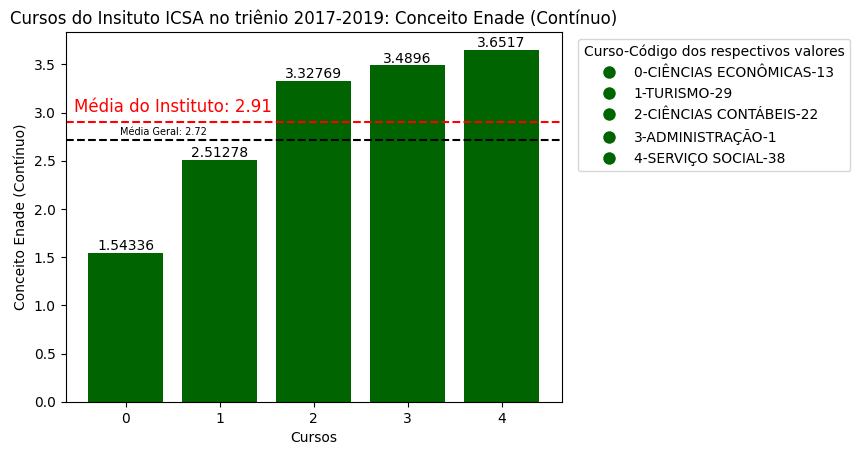

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
icen = icen.sort_values(by=avalia)
area = 'ICSA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicsa #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = icsa['Área de Avaliação'].astype(str) + '-' + icsa['Código da Área'].astype(str)  #+ '-' + ifch['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icsa[avalia], color=icsa['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icsa['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icsa[avalia], color=icsa['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.4, posicao_y2+0.05, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

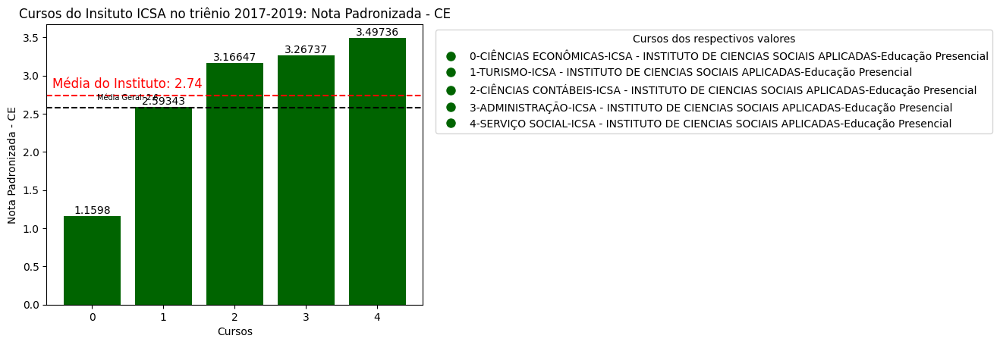

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
icen = icen.sort_values(by=avalia)
area = 'ICSA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = icsa['Área de Avaliação'].astype(str) + '-' + icsa['Instituto'].astype(str)  + '-' + icsa['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icsa[avalia], color=icsa['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icsa['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icsa[avalia], color=icsa['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.1f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

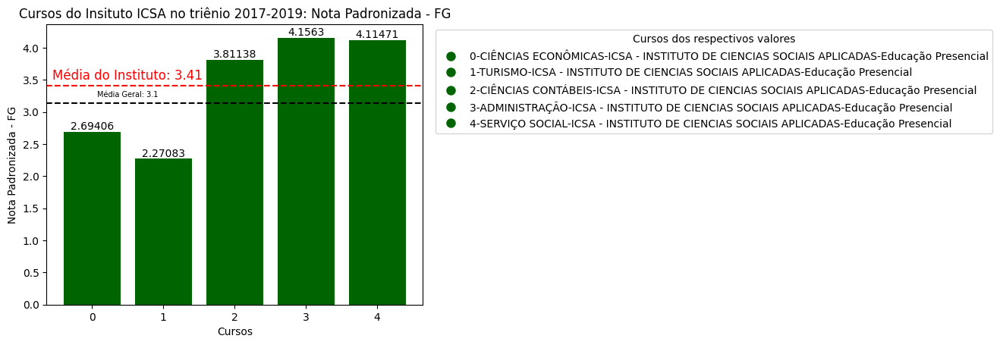

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
icen = icen.sort_values(by=avalia)
area = 'ICSA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral

# Concatenando as colunas para criar o eixo y
aux = icsa['Área de Avaliação'].astype(str) + '-' + icsa['Instituto'].astype(str)  + '-' + icsa['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, icsa[avalia], color=icsa['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, icsa['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,icsa[avalia], color=icsa['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.1f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICB

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICB - INSTITUTO DE CIENCIAS BIOLOGICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
icb2 = instituto

#media do instituto
mediaicb = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaicb)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

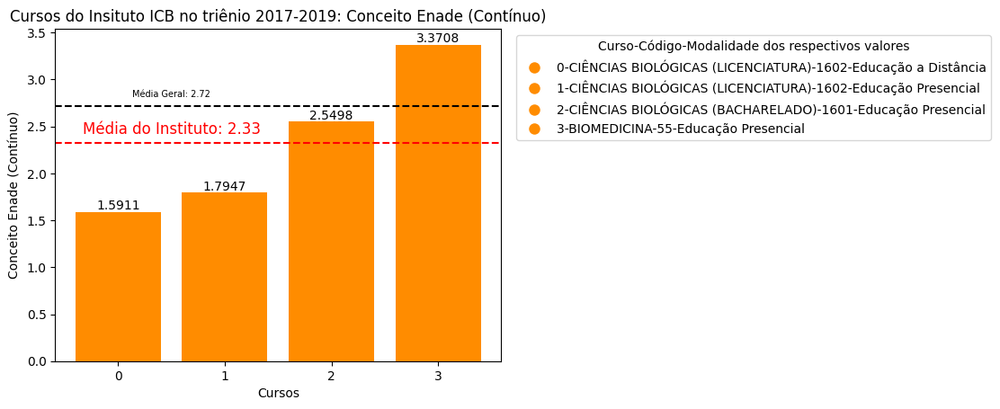

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICB'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicb #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Modalidade dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

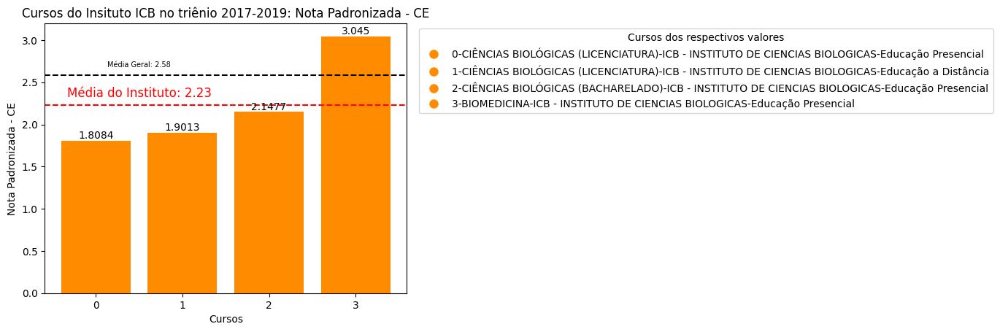

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICB'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

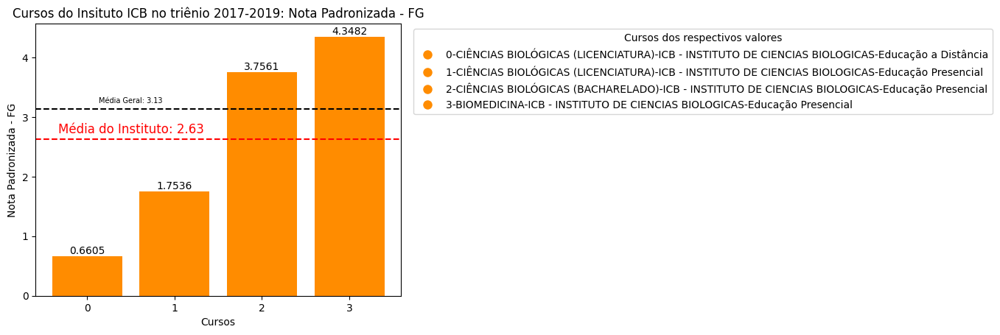

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ICB'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaifch #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICA

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICA - INSTITUTO DE CIENCIAS DA ARTE'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
ica2 = instituto

#media do instituto
mediaica = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaica)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

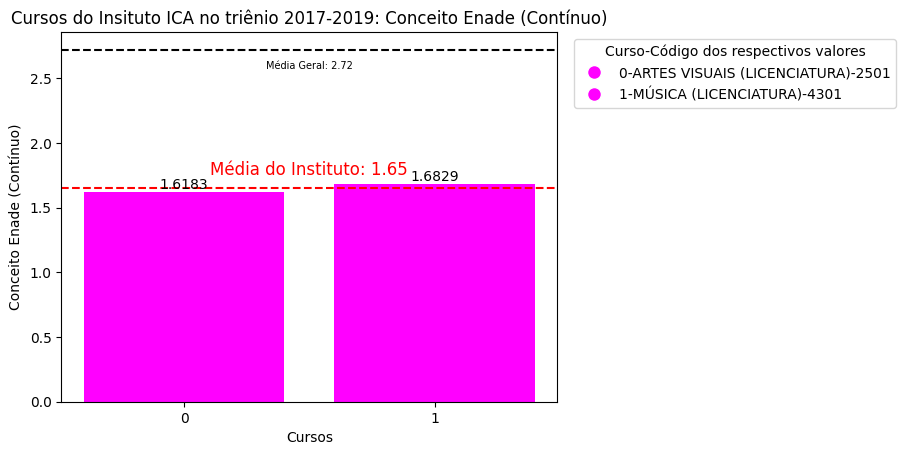

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaica #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  #+ '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.15, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

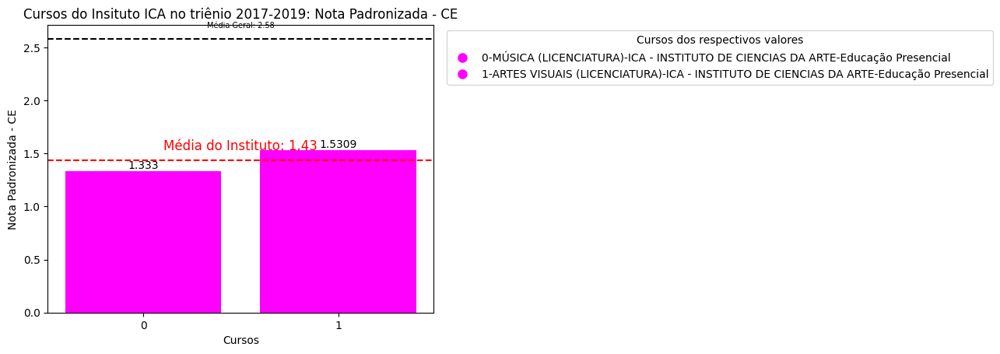

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaica #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

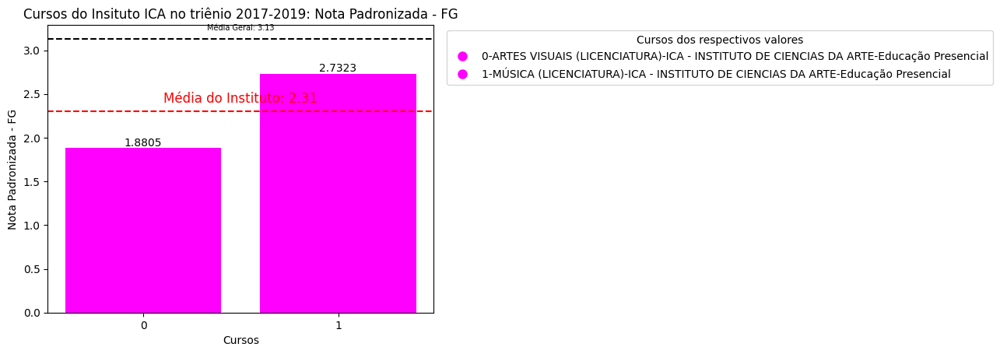

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ICA'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaica #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ILC

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ILC - INSTITUTO DE LETRAS E COMUNICACAO'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
ilc2 = instituto

#media do instituto
mediailc = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediailc)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

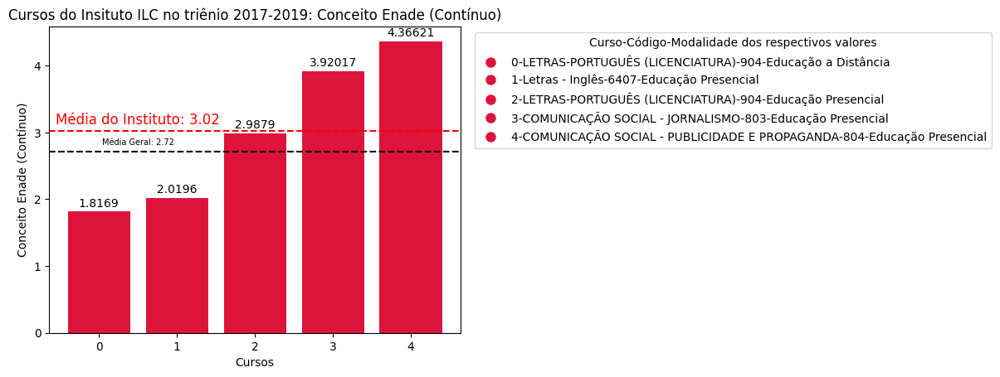

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ILC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediailc #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Modalidade dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge", padding=2)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

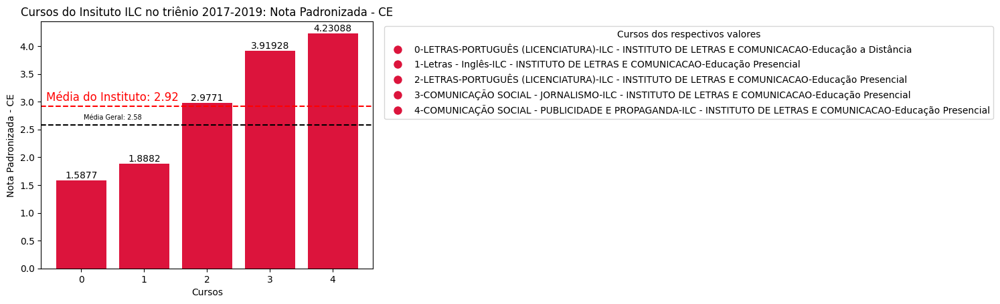

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ILC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediailc #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

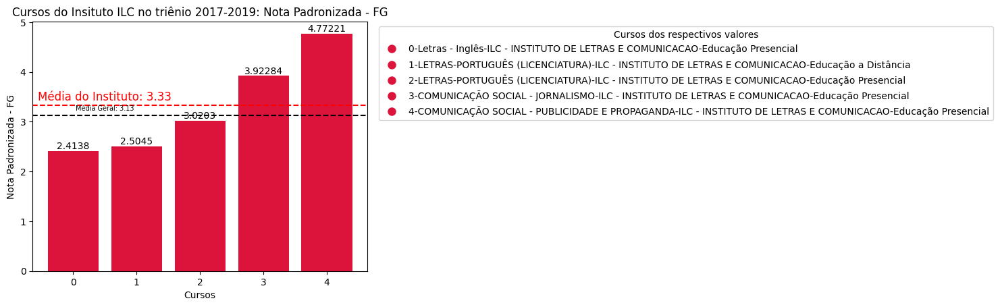

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ILC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediailc #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ITEC

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ITEC - INSTITUTO DE TECNOLOGIA'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
itec2 = instituto

#media do instituto
mediaitec = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaitec)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

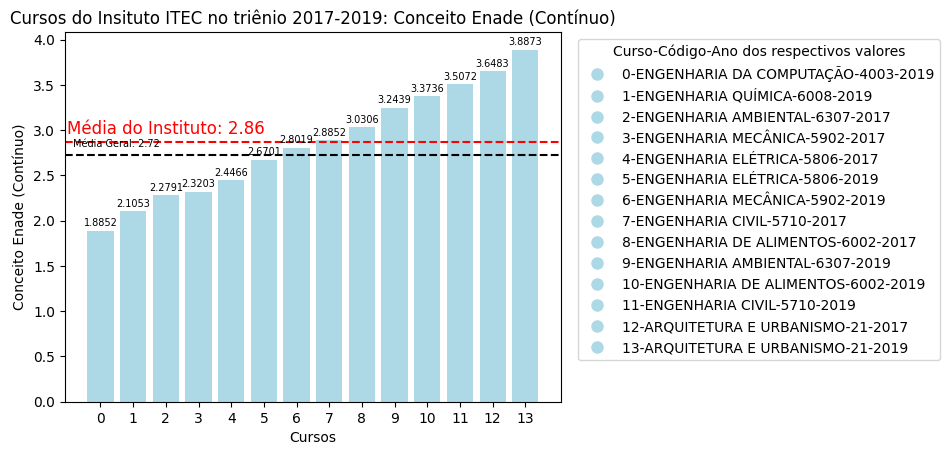

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ITEC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaitec #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Ano'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Ano dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=7, label_type="edge", padding=2)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(2, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

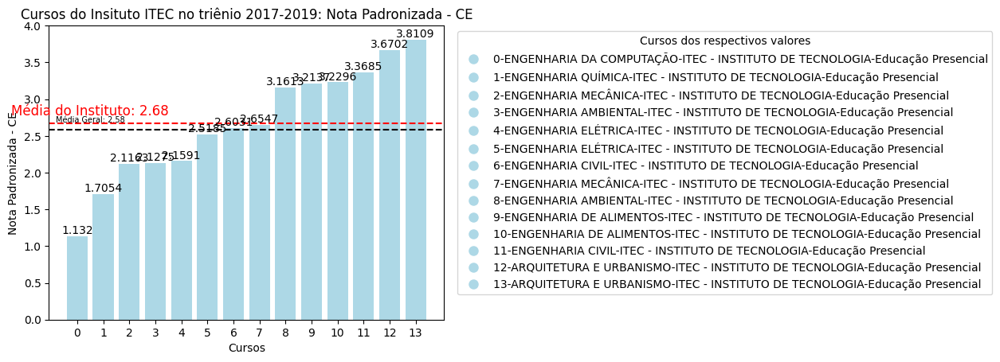

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ITEC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaitec #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

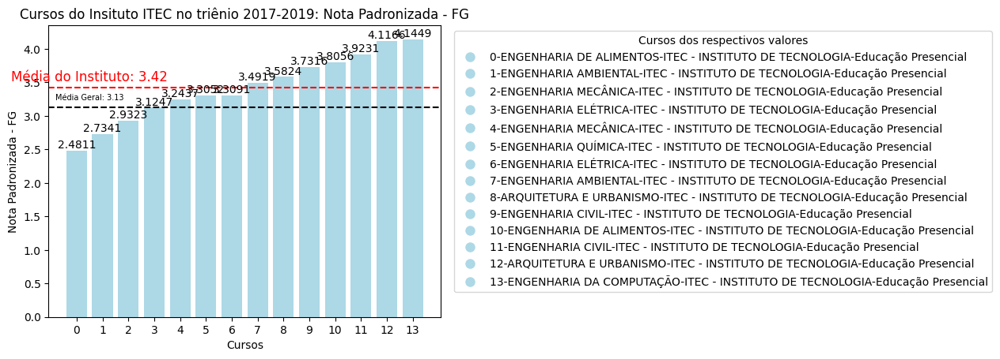

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ITEC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaitec #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

####2017 e 2019

In [ ]:
# Código dos cursos de belém
valor_desejado = 2017

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
itec2017 = instituto[instituto['Ano'] == valor_desejado]

# Código dos cursos de belém
valor_desejado = 2019

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
itec2019 = instituto[instituto['Ano'] == valor_desejado]

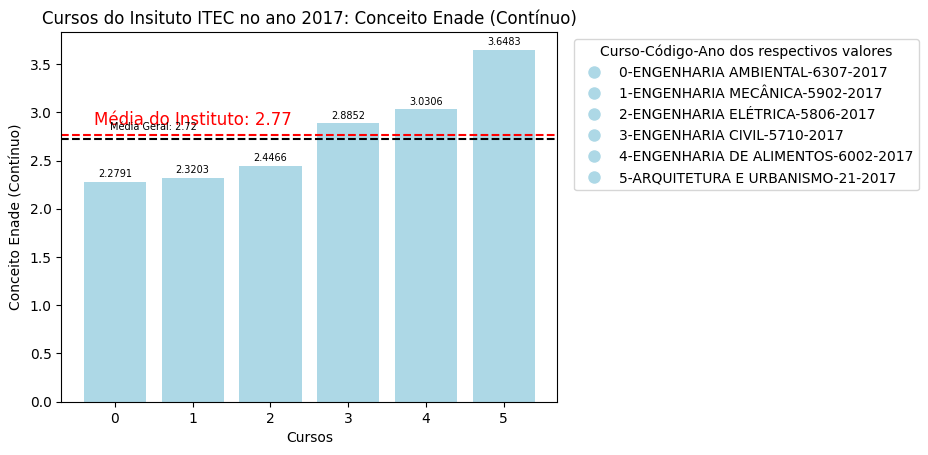

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= itec2017.sort_values(by=avalia)
area = 'ITEC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = instituto['Conceito Enade (Contínuo)'].mean() #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Ano'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Ano dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=7, label_type="edge", padding=2)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
media2017 = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(1, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no ano 2017: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

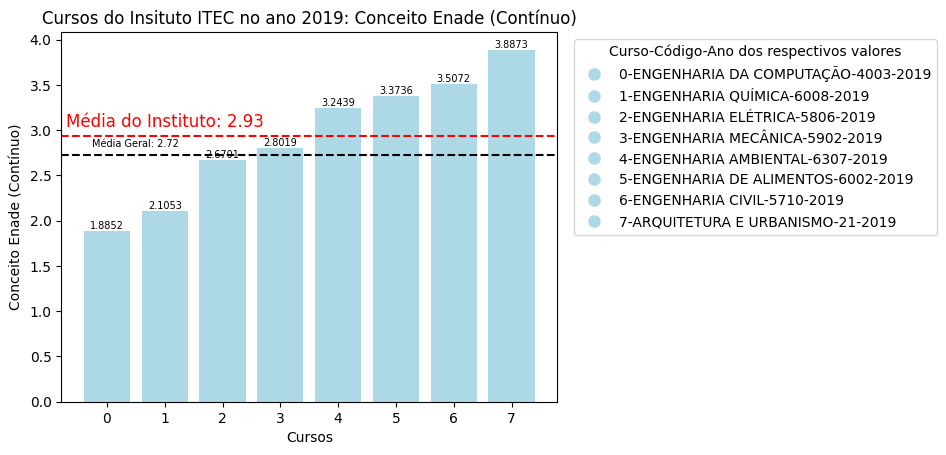

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= itec2019.sort_values(by=avalia)
area = 'ITEC'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = instituto['Conceito Enade (Contínuo)'].mean() #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Ano'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-Ano dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=7, label_type="edge", padding=0)

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
media2019 = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(1, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no ano 2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### ICM

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICM - INSTITUTO DE CIENCIAS MEDICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
icm2 = instituto

#media do instituto
mediaicm = instituto['Conceito Enade (Contínuo)'].mean()

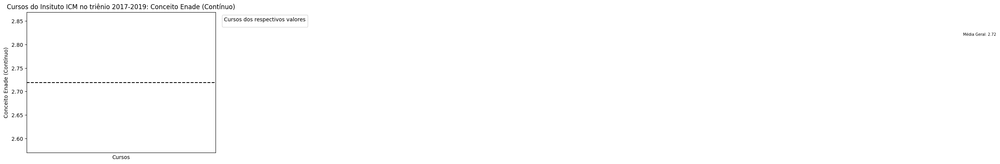

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICM'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicm #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

plt.show()  # Exibe o gráfico

### ICED

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICED - INSTITUTO DE CIENCIAS DA EDUCACAO'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
iced2 = instituto

#media do instituto
mediaiced = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaiced)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

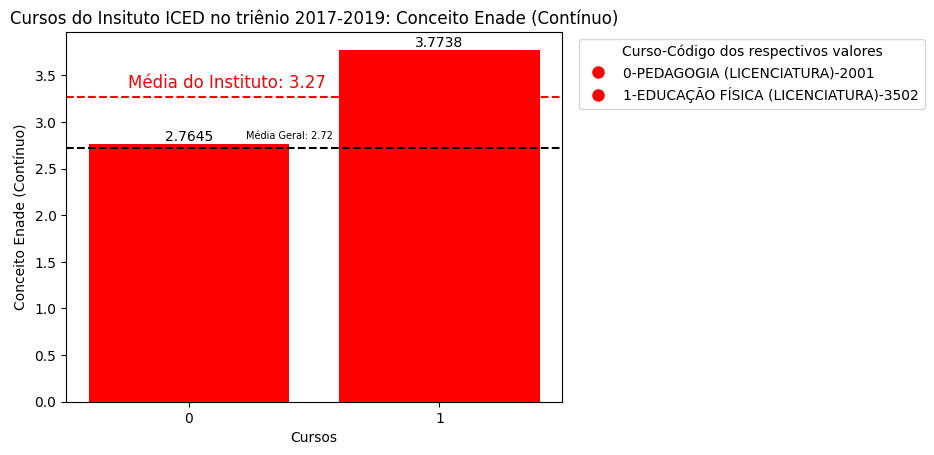

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICED'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaiced #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  #+ '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.15, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.4, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

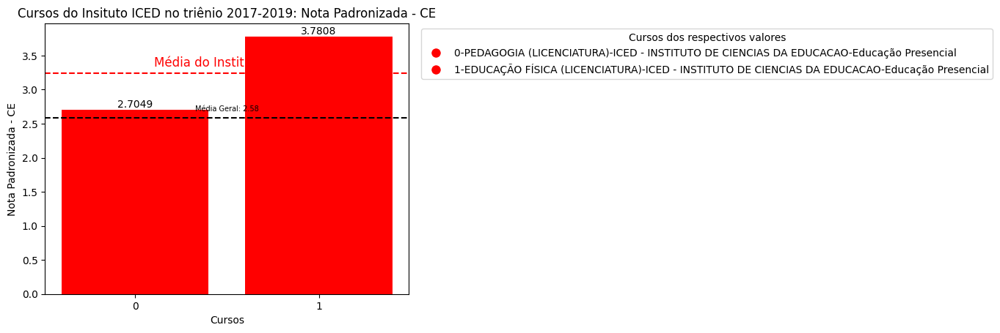

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICED'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaiced #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

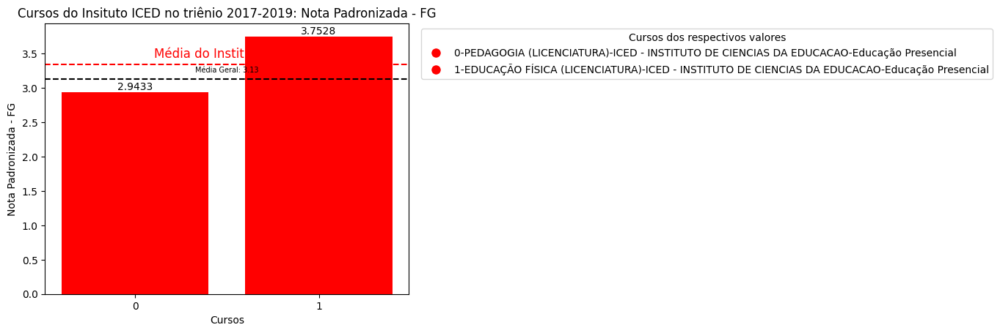

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ICED'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaiced #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

* Comparação rápida de pedagogia com outros cursos de belém

In [ ]:
belemsegundo

,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Instituto,Cor
1153,2017,702,MATEMÁTICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,86396,Educação a Distância,Belém,77,60,1.86730,1.04550,1.25090,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
2682,2017,1502,QUÍMICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,114892,Educação a Distância,Belém,24,22,1.92350,1.04510,1.26470,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
1148,2017,702,MATEMÁTICA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11999,Educação Presencial,Belém,423,267,1.54130,1.31630,1.37260,NaN,LICENCIATURA,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
5773,2017,3202,FILOSOFIA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11994,Educação Presencial,Belém,123,52,1.71320,1.45220,1.51750,NaN,LICENCIATURA,IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS,#00FF7F
2535,2017,1501,QUÍMICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12007,Educação Presencial,Belém,15,14,2.12400,1.34170,1.53730,NaN,BACHARELADO,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF
733,2018,13,CIÊNCIAS ECONÔMICAS,UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11993,Educação Presencial,BELEM,74,59,2.69406,1.15980,1.54336,NaN,None,ICSA - INSTITUTO DE CIENCIAS SOCIAIS APLICADAS,#006400
5509,2017,3002,GEOGRAFIA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11991,Educação Presencial,Belém,381,258,1.55760,1.57570,1.57120,NaN,LICENCIATURA,IFCH - INSTITUTO DE FILOSOFIA E CIENCIAS HUMANAS,#00FF7F
3336,2017,1602,CIÊNCIAS BIOLÓGICAS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,1148030,Educação a Distância,Belém,7,4,0.66050,1.90130,1.59110,NaN,LICENCIATURA,ICB - INSTITUTO DE CIENCIAS BIOLOGICAS,#FF8C00
5271,2017,2501,ARTES VISUAIS (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,114907,Educação Presencial,Belém,55,40,1.88050,1.53090,1.61830,NaN,LICENCIATURA,ICA - INSTITUTO DE CIENCIAS DA ARTE,#FF00FF
2227,2017,1401,FÍSICA (BACHARELADO),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,12000,Educação Presencial,Belém,23,21,1.98470,1.53970,1.65100,NaN,BACHARELADO,ICEN - INSTITUTO DE CIENCIAS EXATAS E NATURAIS,#0000FF


In [ ]:
# Código dos cursos de belém
valor_desejado = 2001

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
pedagogia = belemsegundo[belemsegundo['Código da Área'] == valor_desejado]

#media do instituto
mediapedag = pedagogia['Conceito Enade (Contínuo)'].mean()
pedagogia

,Ano,Código da Área,Área de Avaliação,Nome da IES,Sigla da IES,Código do Curso,Modalidade de Ensino,Município do Curso,Concluintes Inscritos,Concluintes Participantes,Nota Padronizada - FG,Nota Padronizada - CE,Conceito Enade (Contínuo),Observação,Grau Acadêmico,Instituto,Cor
3970,2017,2001,PEDAGOGIA (LICENCIATURA),UNIVERSIDADE FEDERAL DO PARÁ,UFPA,11996,Educação Presencial,Belém,509,415,2.9433,2.7049,2.7645,NaN,LICENCIATURA,ICED - INSTITUTO DE CIENCIAS DA EDUCACAO,#FF0000


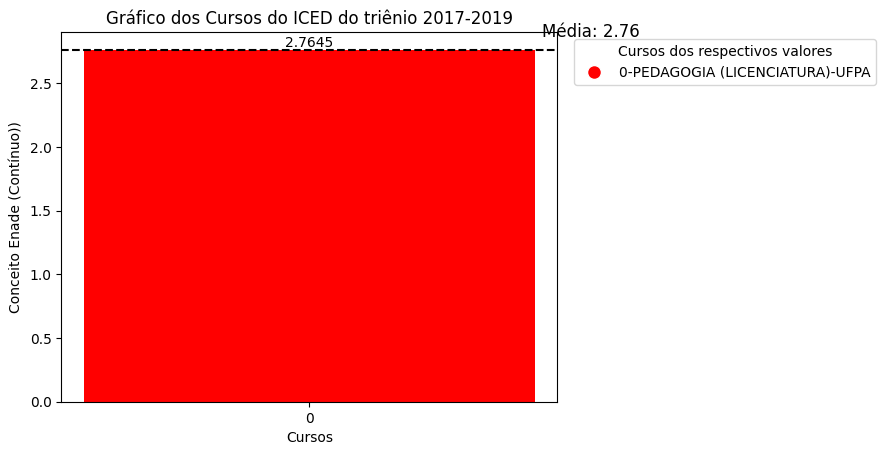

In [ ]:
#Gráfico da UFPA
# Concatenando as colunas para criar o eixo y
aux = pedagogia['Área de Avaliação'].astype(str) + '-' + pedagogia['Sigla da IES'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, pedagogia['Conceito Enade (Contínuo)'], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor='red') for label in listat]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,pedagogia['Conceito Enade (Contínuo)'], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = mediapedag
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média: {mediapedag:.2f}', color='black', fontsize=12, ha='center')

plt.title('Gráfico dos Cursos do ICED do triênio 2017-2019', loc='center')
plt.ylabel('Conceito Enade (Contínuo))')  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico

### ICJ

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICJ - INSTITUTO DE CIENCIAS JURIDICAS'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
icj2 = instituto

#media do instituto
mediaicj = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaicj)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

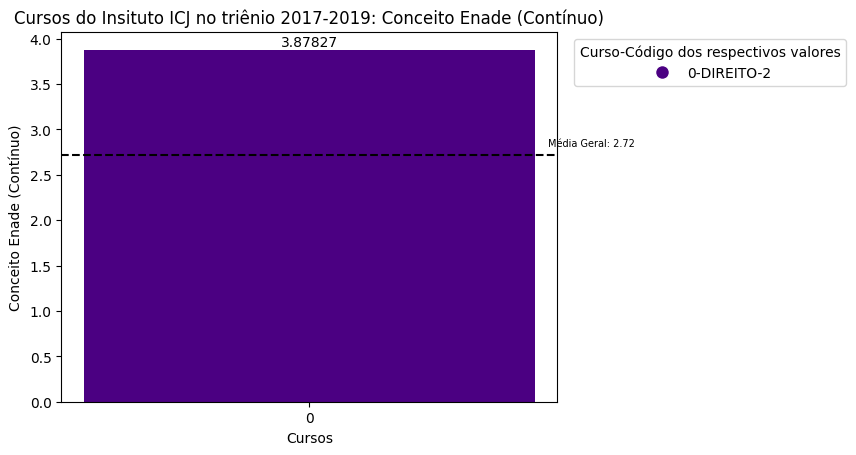

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICJ'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicj #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  #+ '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
"""posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')""" #desnecessária

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

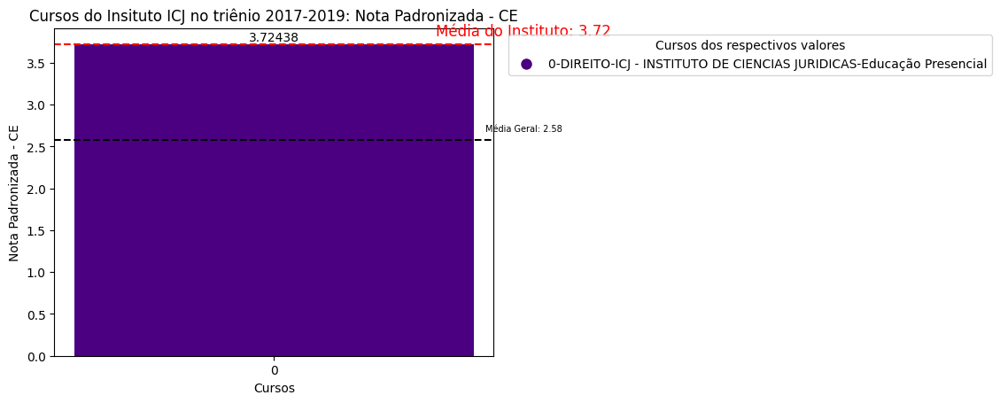

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICJ'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicj #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico

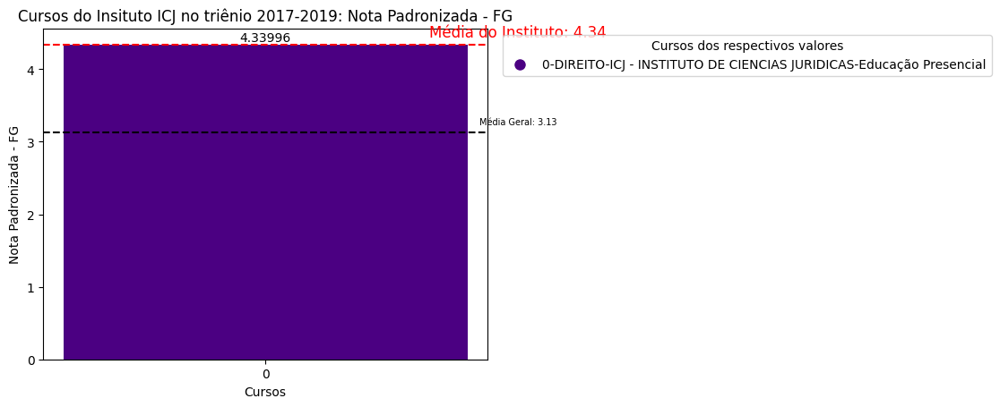

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ICJ'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaicj #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y
plt.show()  # Exibe o gráfico

### ICS

In [ ]:
# Código dos cursos de belém
valor_desejado = 'ICS - INSTITUTO DE CIENCIAS DA SAUDE'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
ics2 = instituto

#media do instituto
mediaics = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediaics)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

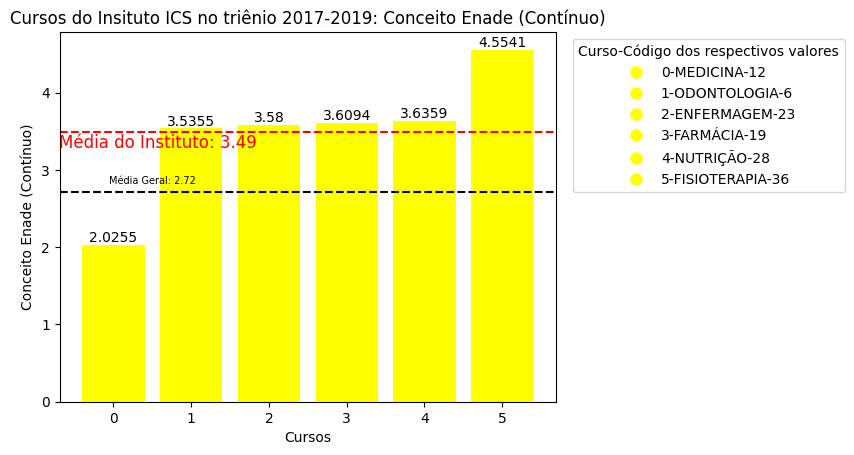

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICS'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaics #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  #+ '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.57, posicao_y-0.21, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

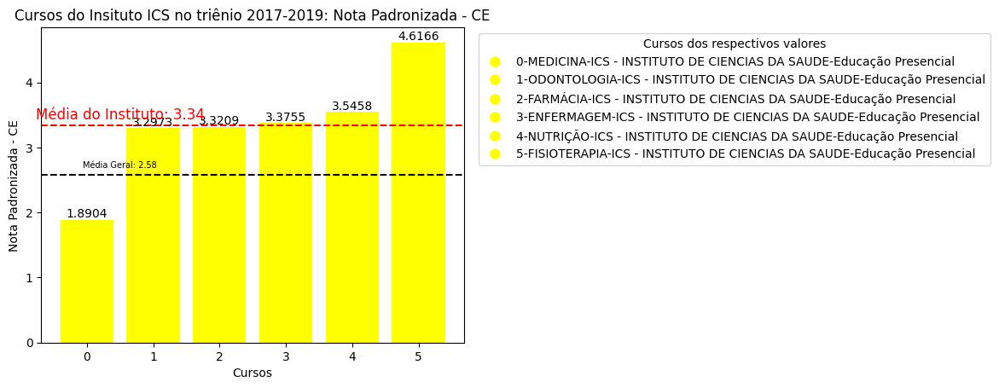

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'ICS'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaics #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

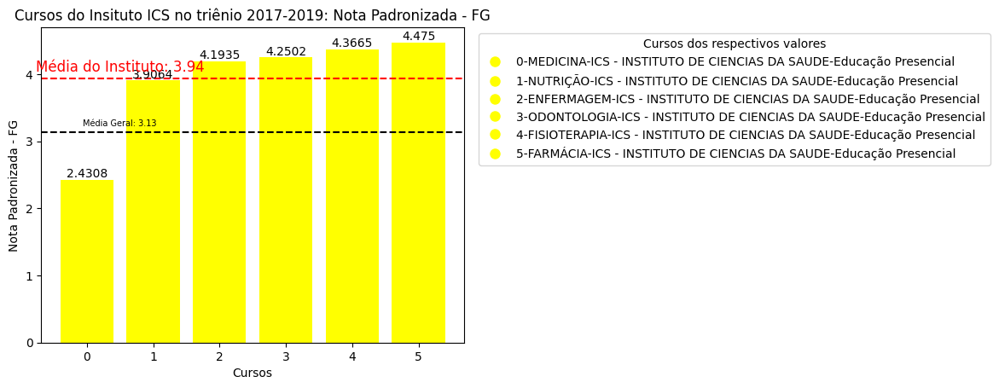

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'ICS'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediaics #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos do Insituto ' + area + ' no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### Sem Instituto

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Não Identificado'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
instituto = ufpasegundo[ufpasegundo['Instituto'] == valor_desejado]
sem2 = instituto

#media do instituto
mediasem = instituto['Conceito Enade (Contínuo)'].mean()
media2.append(mediasem)

mediafg = instituto['Nota Padronizada - FG'].mean()
mediace = instituto['Nota Padronizada - CE'].mean()
fg2.append(mediafg)
ce2.append(mediace)

In [ ]:
instituto.columns

Index(['Ano', 'Código da Área', 'Área de Avaliação', 'Nome da IES',
       'Sigla da IES', 'Código do Curso', 'Modalidade de Ensino',
       'Município do Curso', 'Concluintes Inscritos',
       'Concluintes Participantes', 'Nota Padronizada - FG',
       'Nota Padronizada - CE', 'Conceito Enade (Contínuo)', 'Observação',
       'Grau Acadêmico', 'Instituto', 'Cor'],
      dtype='object')

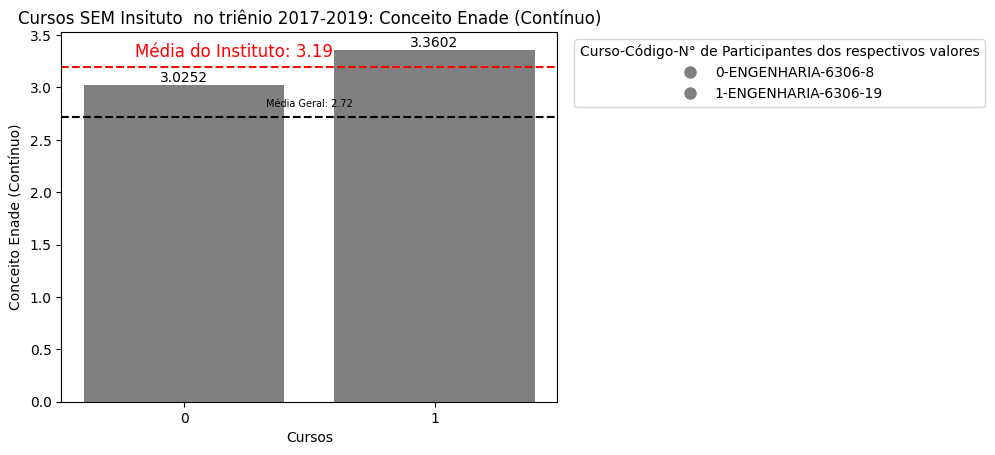

In [ ]:
#Gráfico da UFPA
avalia = 'Conceito Enade (Contínuo)'#'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'SEM'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediasem #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Código da Área'].astype(str)  + '-' + instituto['Concluintes Participantes'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Curso-Código-N° de Participantes dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.2, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos ' + area + ' Insituto  no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

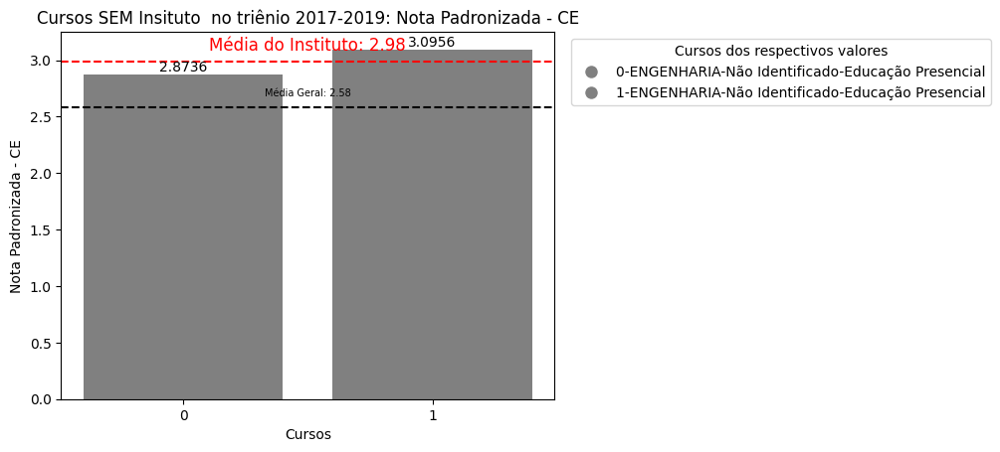

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - CE'
instituto= instituto.sort_values(by=avalia)
area = 'SEM'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediasem #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos ' + area + ' Insituto  no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

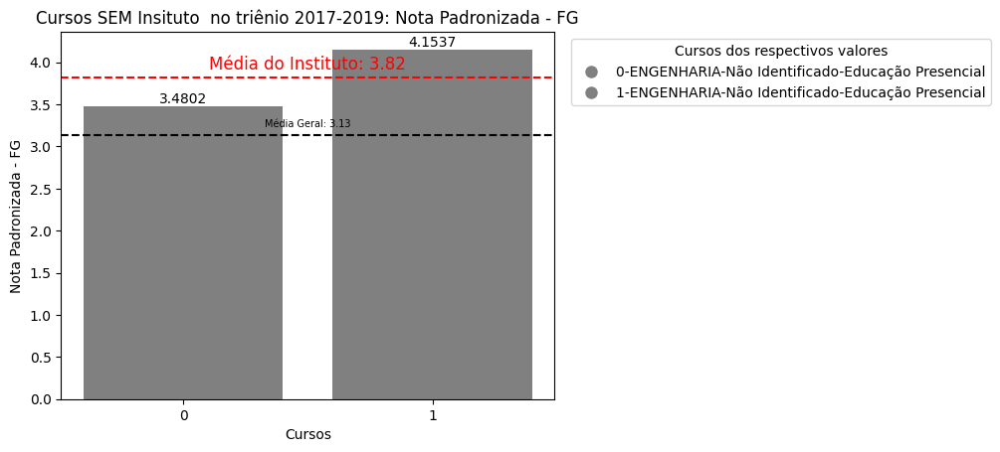

In [ ]:
#Gráfico da UFPA
avalia = 'Nota Padronizada - FG'
instituto= instituto.sort_values(by=avalia)
area = 'SEM'
if (avalia == 'Nota Padronizada - FG'):
  medial = mediafg #local
  mediag = geralfg2 #geral
elif (avalia == 'Nota Padronizada - CE'):
  medial = mediace #local
  mediag = geralce2 #geral
elif (avalia == 'Conceito Enade (Contínuo)'):
  medial = mediasem #local
  mediag = mediageral #geral
# Concatenando as colunas para criar o eixo y
aux = instituto['Área de Avaliação'].astype(str) + '-' + instituto['Instituto'].astype(str)  + '-' + instituto['Modalidade de Ensino'].astype(str)
lista = list(range(len(aux)))

# Criar o gráfico
#plt.figure(figsize=(20, 10))  # Define o tamanho da figura
plt.bar(lista, instituto[avalia], color=instituto['Cor'])
plt.xticks(range(0, len(lista), 1), lista[::1]) #para que o eixo x tenha a qttd de valores exatos

# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, instituto['Cor'])]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

plt.bar_label( (plt.bar(lista ,instituto[avalia], color=instituto['Cor'])) , size=10, label_type="edge")

# Adicionar uma linha horizontal na posição y desejada
posicao_y = medial
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y+0.1, f'Média do Instituto: {medial:.2f}', color='red', fontsize=12, ha='center')

posicao_y2 = mediag
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2+0.1, f'Média Geral: {mediag :.2f}', color='black', fontsize=7, ha='center')

titulo = 'Cursos ' + area + ' Insituto  no triênio 2017-2019: ' + avalia
plt.title(titulo, loc='center')
plt.ylabel(avalia)  # Define o rótulo do eixo x
plt.xlabel('Cursos')  # Define o rótulo do eixo y

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

plt.show()  # Exibe o gráfico

### Comparação de Institutos

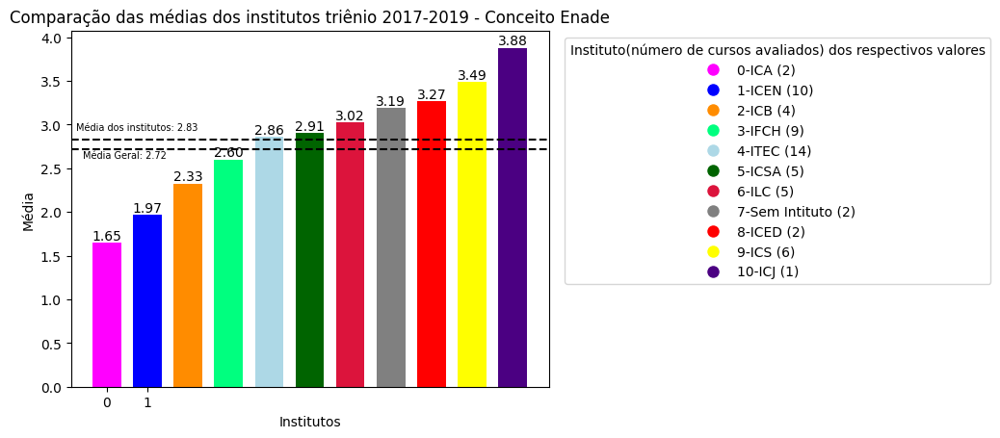

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (10)', 'IFCH (9)', 'ICSA (5)', 'ICB (4)', 'ICA (2)', 'ILC (5)', 'ITEC (14)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (2)']
medias = [mediaicen, mediaifch, mediaicsa, mediaicb, mediaica, mediailc, mediaitec, mediaiced, mediaicj, mediaics, mediasem]
#medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

#Ordenando todas as listas de acordo com a media
dados_combinados = list(zip(range(len(medias)), cursos, medias, cores))
dados_combinados.sort(key=lambda x: x[2])
cursos = [item[1] for item in dados_combinados]
medias = [item[2] for item in dados_combinados]
cores = [item[3] for item in dados_combinados]

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Instituto(número de cursos avaliados) dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = mediageral
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.45, posicao_y2-0.1, f'Média Geral: {mediageral :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos triênio 2017-2019 - Conceito Enade")

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

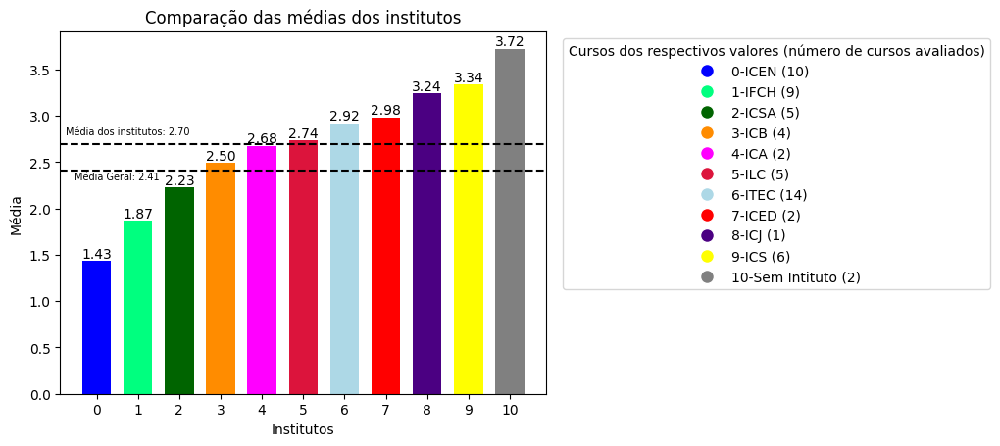

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (10)', 'IFCH (9)', 'ICSA (5)', 'ICB (4)', 'ICA (2)', 'ILC (5)', 'ITEC (14)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (2)']
medias = ce2
medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores (número de cursos avaliados)", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = geralce
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.1, f'Média Geral: {geralce :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos")

# Exibir o gráfico
plt.show()

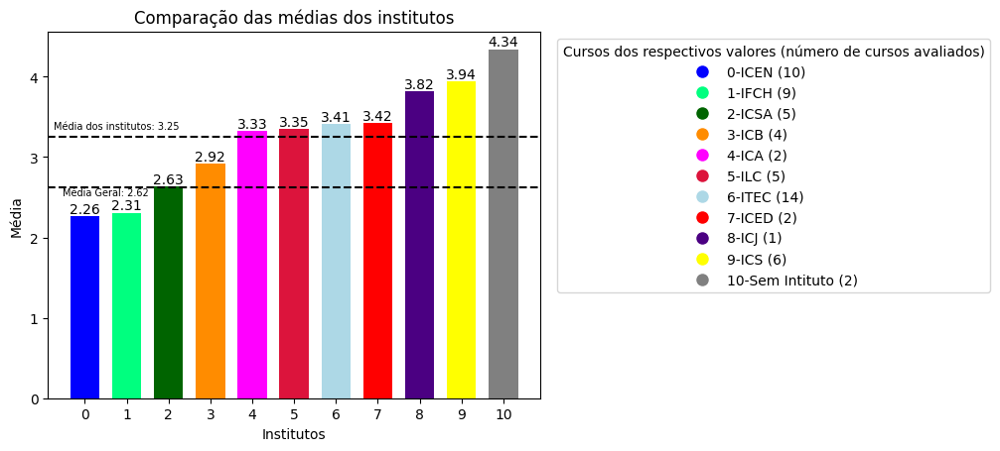

In [ ]:
# Dados do gráfico de barras
cursos = ['ICEN (10)', 'IFCH (9)', 'ICSA (5)', 'ICB (4)', 'ICA (2)', 'ILC (5)', 'ITEC (14)', 'ICED (2)', 'ICJ (1)', 'ICS (6)', 'Sem Intituto (2)']
medias = fg2
medias.sort()
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Cursos dos respectivos valores (número de cursos avaliados)", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y+0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='black', fontsize=7, ha='center')

posicao_y2 = geralfg
plt.axhline(y=posicao_y2, color='black', linestyle='--', label='Linha Horizontal')
plt.text(0.5, posicao_y2-0.1, f'Média Geral: {geralfg :.2f}', color='black', fontsize=7, ha='center')

# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("Média")
plt.title("Comparação das médias dos institutos")

# Exibir o gráfico
plt.show()

## Comparação entre os triênios

In [ ]:
if cont==0:
  media3.append(0)
  media4.append(0)
  cont=1
preguica=[]
media3

[0]

###ICEN

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Educação Presencial'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
icen21 = icen2[icen2['Modalidade de Ensino'] == valor_desejado]

valor_desejado = 'Educação a Distância'
icen2 = icen2[icen2['Modalidade de Ensino'] == valor_desejado]

In [ ]:
newmedia=icen21['Conceito Enade (Contínuo)'].mean()
media=icen2['Conceito Enade (Contínuo)'].mean()
media3.append(media1[0])
media4.append(newmedia)

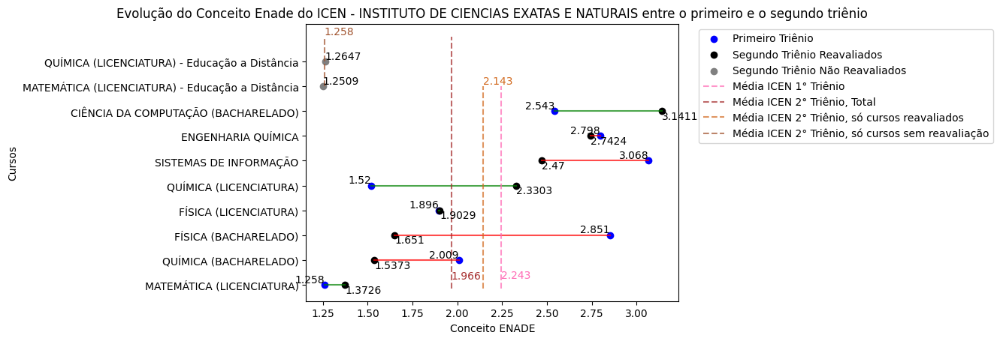

In [ ]:
df1 = icen1.copy()
df2 = icen21.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio Reavaliados')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(icen2['Área de Avaliação'], icen2['Modalidade de Ensino'])]
plt.scatter(icen2['Conceito Enade (Contínuo)'], rotulos, color='gray', label='Segundo Triênio Não Reavaliados')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

# Adicionar um rótulo de texto com o nome da avaliação no eixo y
cont=0
for index, row in icen2.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)']
    plt.text(x1+0.2, len(df_combined)+cont, x1, ha='right', va='bottom')
    cont+=1

# plotando as linhas das médias
plt.plot([media1[0],media1[0]],[-0.15,len(df_combined)], linestyle='--', color='hotpink', label='Média ICEN 1° Triênio', alpha=0.7) #[-0.15,len(df_combined)-0.88]
plt.text(media1[0], 0.17, f'{media1[0]:.3f}', color='hotpink', ha='left', va='bottom')

plt.plot([media2[0],media2[0]],[-0.15,len(df_combined)+2], linestyle='--', color='brown', label='Média ICEN 2° Triênio, Total', alpha=0.7)
plt.text(media2[0], 0.15, f'{media2[0]:.3f}', color='brown', ha='left', va='bottom')

plt.plot([newmedia,newmedia],[-0.15,len(df_combined)], linestyle='--', color='chocolate', label='Média ICEN 2° Triênio, só cursos reavaliados', alpha=0.7)
plt.text(newmedia, len(df_combined), f'{newmedia:.3f}', color='chocolate', ha='left', va='bottom')

plt.plot([media,media],[len(df_combined),len(df_combined)+2], linestyle='--', color='Sienna', label='Média ICEN 2° Triênio, só cursos sem reavaliação', alpha=0.7)
plt.text(media, len(df_combined)+2, f'{media:.3f}', color='Sienna', ha='left', va='bottom')


# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

### IFCH

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Educação Presencial'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
ifch21 = ifch2[ifch2['Modalidade de Ensino'] == valor_desejado]

valor_desejado = 'Educação a Distância'
ifch2 = ifch2[ifch2['Modalidade de Ensino'] == valor_desejado]

In [ ]:
media3.append(media1[1])
media4.append(media2[1])

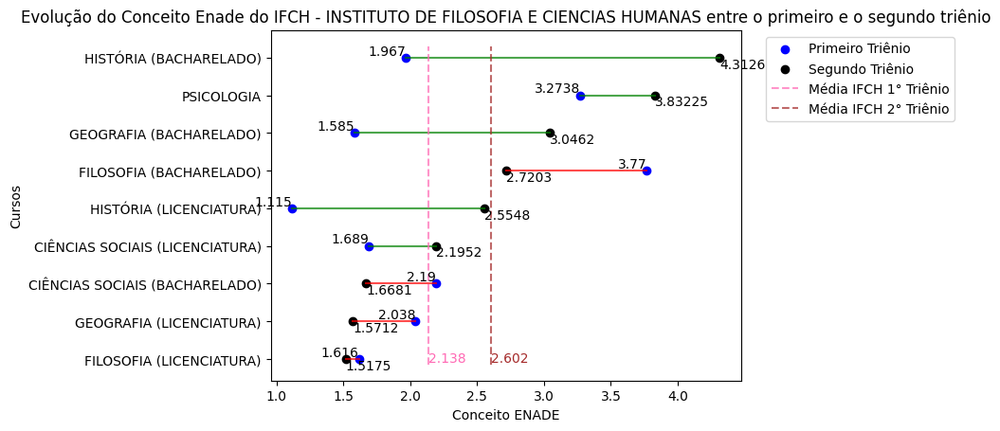

In [ ]:
df1 = ifch1.copy()
df2 = ifch21.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(ifch2['Área de Avaliação'], ifch2['Modalidade de Ensino'])]
#plt.scatter(ifch2['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)
plt.plot([media1[1],media1[1]],[-0.15,len(df_combined)-0.70], linestyle='--', color='hotpink', label='Média IFCH 1° Triênio', alpha=0.7)
plt.text(media1[1], -0.15, f'{media1[1]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[1],media2[1]],[-0.15,len(df_combined)-0.70], linestyle='--', color='brown', label='Média IFCH 2° Triênio', alpha=0.7)
plt.text(media2[1], -0.15, f'{media2[1]:.3f}', color='brown', ha='left', va='bottom')
# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
print(preguica)
preguica=[]

[-0.09850000000000003, -0.4667999999999999, -0.5219, 0.5061999999999998, 1.4398000000000002, -1.0497, 1.4611999999999998, 0.5584500000000001, 2.3455999999999997]


### ICSA

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Educação Presencial'
desejado = 'Presencial'

# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
icsa11 = icsa1[(icsa1['Modalidade de Ensino'] == valor_desejado) | (icsa1['Modalidade de Ensino'] == desejado)]

valor_desejado = 'Educação a Distância'
icsa12 = icsa1[icsa1['Modalidade de Ensino'] == valor_desejado]

newmedia=icsa11['Conceito Enade (Contínuo)'].mean()
media=icsa12['Conceito Enade (Contínuo)'].mean()
media3.append(newmedia)
media4.append(media2[2])

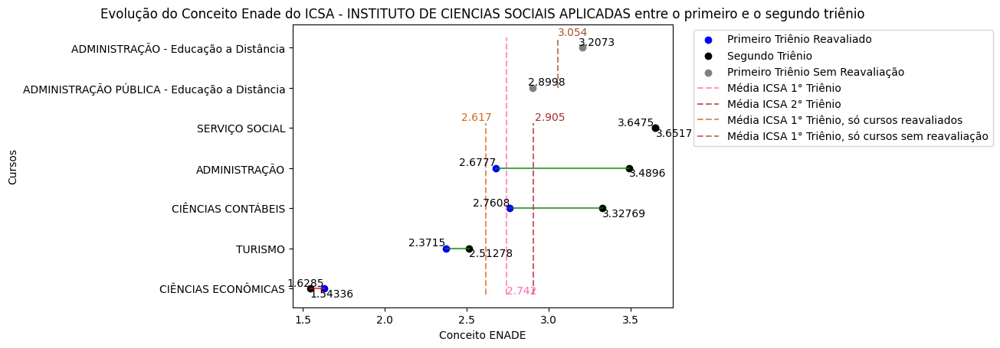

In [ ]:
df1 = icsa11.copy()
df2 = icsa2.copy()
distancia = icsa12.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio Reavaliado')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(distancia['Área de Avaliação'], distancia['Modalidade de Ensino'])]
plt.scatter(distancia['Conceito Enade (Contínuo)'], rotulos, color='gray', label='Primeiro Triênio Sem Reavaliação')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

# Traçar linhas para conectar os valores correspondentes de df1 e df2
cont=0
for index, row in distancia.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1+0.2, len(df_combined)+cont, x1, ha='right', va='bottom')
    cont+=1

# Médias
plt.plot([media1[2],media1[2]],[-0.15,len(distancia)+len(df_combined)-0.75], linestyle='--', color='hotpink', label='Média ICSA 1° Triênio', alpha=0.7)
plt.text(media1[2], -0.2, f'{media1[2]:.3f}', color='hotpink', ha='left', va='bottom')

plt.plot([media2[2],media2[2]],[-0.15,len(df_combined)-0.88], linestyle='--', color='brown', label='Média ICSA 2° Triênio', alpha=0.7)
plt.text(media2[2]+0.01, len(df_combined)-0.88, f'{media2[2]:.3f}', color='brown', ha='left', va='bottom')

plt.plot([newmedia,newmedia],[-0.15,len(df_combined)-0.88], linestyle='--', color='chocolate', label='Média ICSA 1° Triênio, só cursos reavaliados', alpha=0.7)
plt.text(newmedia-0.15, len(df_combined)-0.88, f'{newmedia:.3f}', color='chocolate', ha='left', va='bottom')

plt.plot([media,media],[len(df_combined),len(distancia)+len(df_combined)-0.75], linestyle='--', color='Sienna', label='Média ICSA 1° Triênio, só cursos sem reavaliação', alpha=0.7)
plt.text(media, len(distancia)+len(df_combined)-0.75, f'{media:.3f}', color='Sienna', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:

print(preguica)
preguica=[]

[-0.08514, 0.14127999999999963, 0.5668899999999999, 0.8118999999999996, 0.0041999999999999815]


### ICB

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Educação Presencial'
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
icb21 = icb2[icb2['Modalidade de Ensino'] == valor_desejado]

valor_desejado = 'Educação a Distância'
icb22 = icb2[icb2['Modalidade de Ensino'] == valor_desejado]

newmedia=icb21['Conceito Enade (Contínuo)'].mean()
media=icb22['Conceito Enade (Contínuo)'].mean()
media3.append(media1[3])
media4.append(newmedia)

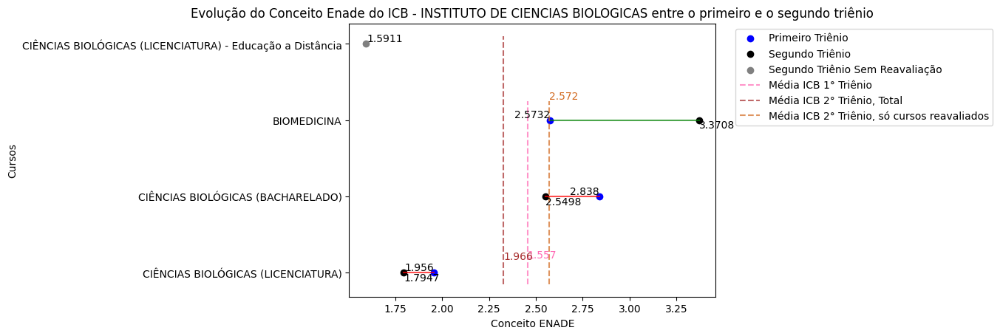

In [ ]:
df1 = icb1.copy()
df2 = icb21.copy()
distancia = icb22.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(distancia['Área de Avaliação'], distancia['Modalidade de Ensino'])]
plt.scatter(distancia['Conceito Enade (Contínuo)'], rotulos, color='gray', label='Segundo Triênio Sem Reavaliação')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

# Traçar linhas para conectar os valores correspondentes de df1 e df2
cont=0
for index, row in distancia.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1+0.2, len(df_combined)+cont, x1, ha='right', va='bottom')
    cont+=1

# Médias
plt.plot([media1[3],media1[3]],[-0.15,len(df_combined)-0.75], linestyle='--', color='hotpink', label='Média ICB 1° Triênio', alpha=0.7) #[-0.15,len(df_combined)-0.88]
plt.text(media1[3], 0.17, f'{media1[4]:.3f}', color='hotpink', ha='left', va='bottom')

plt.plot([media2[3],media2[3]],[-0.15,len(df_combined)+len(distancia)-0.9], linestyle='--', color='brown', label='Média ICB 2° Triênio, Total', alpha=0.7)
plt.text(media2[3], 0.15, f'{media2[0]:.3f}', color='brown', ha='left', va='bottom')

plt.plot([newmedia,newmedia],[-0.15,len(df_combined)-0.75], linestyle='--', color='chocolate', label='Média ICB 2° Triênio, só cursos reavaliados', alpha=0.7)
plt.text(newmedia, len(df_combined)-0.75, f'{newmedia:.3f}', color='chocolate', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[-0.1613, -0.28820000000000023, 0.7976000000000001]


### ICA

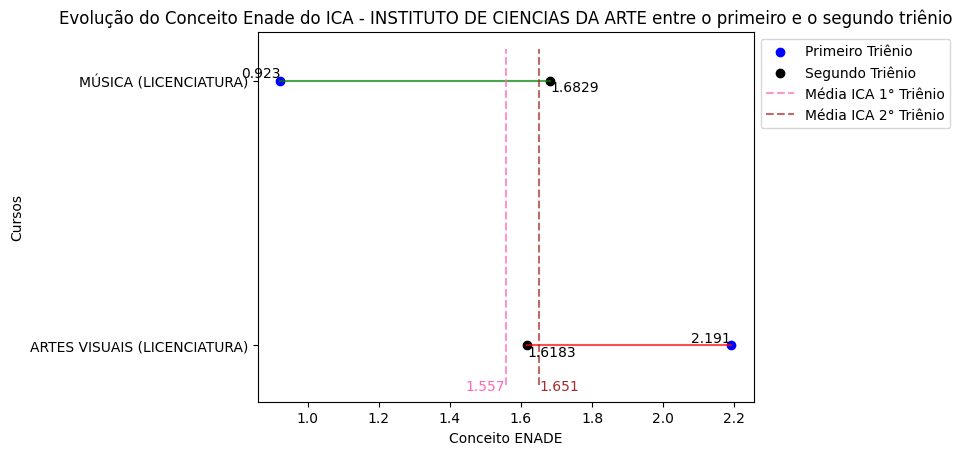

In [ ]:
df1 = ica1.copy()
df2 = ica2.copy()
media4.append(media2[4])
media3.append(media1[4])


# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(ifch2['Área de Avaliação'], ifch2['Modalidade de Ensino'])]
#plt.scatter(ifch2['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[4],media1[4]],[-0.15,1.12], linestyle='--', color='hotpink', label='Média ICA 1° Triênio', alpha=0.7)
plt.text(media1[4]-0.112, -0.18, f'{media1[4]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[4],media2[4]],[-0.15,1.12], linestyle='--', color='brown', label='Média ICA 2° Triênio', alpha=0.7)
plt.text(media2[4], -0.18, f'{media2[4]:.3f}', color='brown', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[-0.5726999999999998, 0.7599]


### ILC

In [ ]:
# Localize a linha que contém 'abc - port' na coluna 'Coluna A'
linha_index = ilc2[ilc2['Área de Avaliação'] == 'COMUNICAÇÃO SOCIAL - JORNALISMO'].index[0]
# Renomeie o valor para 'port'
ilc2.at[linha_index, 'Área de Avaliação'] = 'JORNALISMO'

# Localize a linha que contém 'abc - port' na coluna 'Coluna A'
linha_index = ilc2[ilc2['Área de Avaliação'] == 'COMUNICAÇÃO SOCIAL - PUBLICIDADE E PROPAGANDA'].index[0]
# Renomeie o valor para 'port'
ilc2.at[linha_index, 'Área de Avaliação'] = 'PUBLICIDADE E PROPAGANDA'

In [ ]:
# Código dos cursos de belém
valor_desejado = 'Educação Presencial'
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
ilc21 = ilc2[ilc2['Modalidade de Ensino'] == valor_desejado]

valor_desejado = 'Educação a Distância'
desejado = 'Letras - Inglês'
distancia = ilc2[(ilc2['Modalidade de Ensino'] == valor_desejado) | (ilc2['Área de Avaliação'] == desejado)]

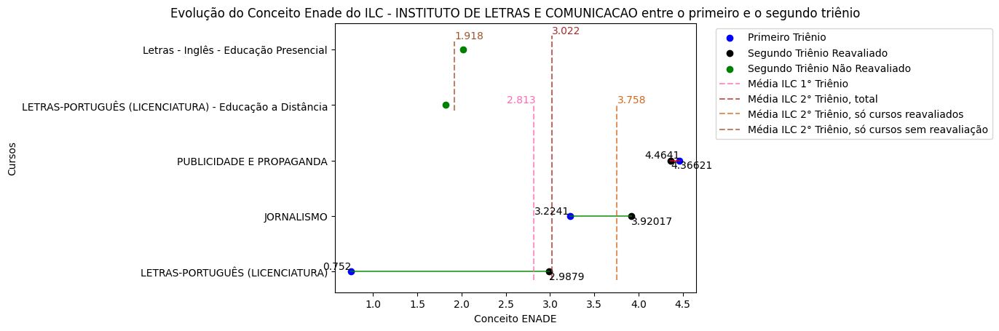

In [ ]:
df1 = ilc1.copy()
df2 = ilc21.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='inner')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

newmedia=df_combined['Conceito Enade (Contínuo)_y'].mean()
media=distancia['Conceito Enade (Contínuo)'].mean()
media3.append(media1[5])
media4.append(newmedia)

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio Reavaliado')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(distancia['Área de Avaliação'], distancia['Modalidade de Ensino'])]
plt.scatter(distancia['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio Não Reavaliado')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[5],media1[5]],[-0.15,len(df_combined)], linestyle='--', color='hotpink', label='Média ILC 1° Triênio', alpha=0.7)
plt.text(media1[5]-0.3, len(df_combined), f'{media1[5]:.3f}', color='hotpink', ha='left', va='bottom')

plt.plot([media2[5],media2[5]],[-0.15,len(df_combined)+len(distancia)-0.75], linestyle='--', color='brown', label='Média ILC 2° Triênio, total', alpha=0.7)
plt.text(media2[5], len(df_combined)+len(distancia)-0.75, f'{media2[5]:.3f}', color='brown', ha='left', va='bottom')

plt.plot([newmedia,newmedia],[-0.15,len(df_combined)], linestyle='--', color='chocolate', label='Média ILC 2° Triênio, só cursos reavaliados', alpha=0.7)
plt.text(newmedia, len(df_combined), f'{newmedia:.3f}', color='chocolate', ha='left', va='bottom')

plt.plot([media,media],[len(df_combined)-0.1,len(df_combined)+1.15], linestyle='--', color='Sienna', label='Média ILC 2° Triênio, só cursos sem reavaliação', alpha=0.7)
plt.text(media, len(df_combined)+1.15, f'{media:.3f}', color='Sienna', ha='left', va='bottom')


# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[2.2359, 0.6960700000000002, -0.09789000000000048]


### ITEC

In [ ]:
# Localize a linha que contém 'abc - port' na coluna 'Coluna A'
linha_index = itec1[itec1['Área de Avaliação'] == 'ENGENHARIA DE COMPUTAÇÃO'].index[0]
# Renomeie o valor para 'port'
itec1.at[linha_index, 'Área de Avaliação'] = 'ENGENHARIA DA COMPUTAÇÃO'

In [ ]:
# Código dos cursos de belém
valor_desejado = 2017
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
itec21 = itec2[itec2['Ano'] == valor_desejado]

# Código dos cursos de belém
valor_desejado = 2019
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
itec22 = itec2[itec2['Ano'] == valor_desejado]

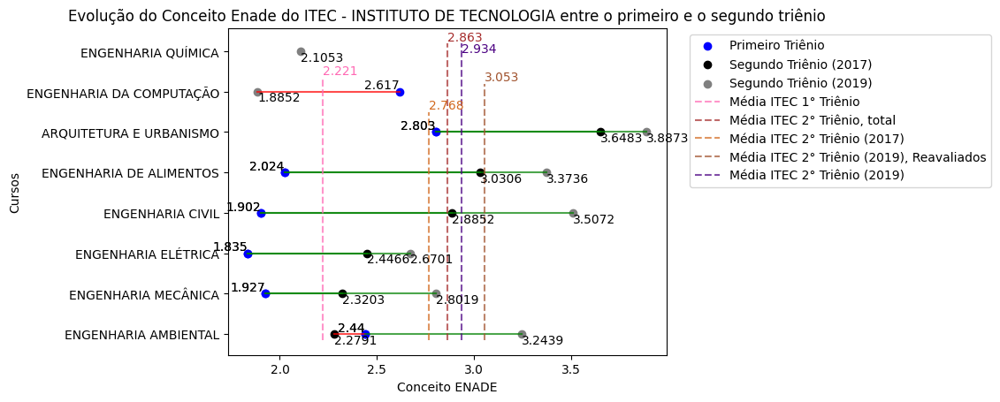

In [ ]:
df1 = itec1.copy()
df2 = itec21.copy() #2017
df3 = itec22.copy() #2019

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome' (2014-2017)
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso'], how='inner')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')
# Combine df1 e df3 em um único DataFrame com base na coluna 'Nome'
#Em nenhum dos casos conseguiu captar o curso de Eng da Computação, por isso foi feito o método abaixo (2014-2019)
df_combined2 = df1.merge(df3, on=['Área de Avaliação'], how='inner')
df_combined2 = df_combined2.sort_values(by='Conceito Enade (Contínuo)_y')
# Identifique os elementos exclusivos de 2019 que não foram avaliados em 2017
df_comb = itec22[~itec22['Área de Avaliação'].isin(itec1['Área de Avaliação'])]

newmedia=df_combined['Conceito Enade (Contínuo)_y'].mean() #2017
media=df_combined2['Conceito Enade (Contínuo)_y'].mean() #2019 reavaliados
#media2019=(media+df_comb['Conceito Enade (Contínuo)'])/2 #diferença entre 2017 e 2019
#media2019=float(media2019)
media3.append(media1[6])
media4.append(media2019)
cont = media

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')
plt.scatter(df_combined2['Conceito Enade (Contínuo)_x'], df_combined2['Área de Avaliação'], color='blue')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio (2017)')

# Plotar os valores de df3 no eixo Y e X
plt.scatter(df_combined2['Conceito Enade (Contínuo)_y'], df_combined2['Área de Avaliação'], color='gray', label='Segundo Triênio (2019)')

# Plotar os valores de 2019 no eixo Y e X
plt.scatter(df_comb['Conceito Enade (Contínuo)'], df_comb['Área de Avaliação'], color='gray')
plt.text(df_comb['Conceito Enade (Contínuo)'], df_comb['Área de Avaliação'], float(df_comb['Conceito Enade (Contínuo)']), ha='left', va='top')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)
# Traçar linhas para conectar os valores correspondentes de df1 e df3
for index, row in df_combined2.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[6],media1[6]],[-0.15,len(df_combined)+0.35], linestyle='--', color='hotpink', label='Média ITEC 1° Triênio', alpha=0.7)
plt.text(media1[6], len(df_combined)+0.35, f'{media1[6]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[6],media2[6]],[-0.15,len(df_combined)+1.2], linestyle='--', color='brown', label='Média ITEC 2° Triênio, total', alpha=0.7)
plt.text(media2[6], len(df_combined)+1.2, f'{media2[6]:.3f}', color='brown', ha='left', va='bottom')

plt.plot([media2017,media2017],[-0.15,len(df_combined)-0.5], linestyle='--', color='chocolate', label='Média ITEC 2° Triênio (2017)', alpha=0.7)
plt.text(media2017, len(df_combined)-0.5, f'{media2017:.3f}', color='chocolate', ha='left', va='bottom')

plt.plot([media,media],[-0.15,len(df_combined)+0.2], linestyle='--', color='Sienna', label='Média ITEC 2° Triênio (2019), Reavaliados', alpha=0.7)
plt.text(media, len(df_combined)+0.2, f'{media:.3f}', color='Sienna', ha='left', va='bottom')

plt.plot([media2019,media2019],[-0.15,len(df_combined)+1.2], linestyle='--', color='indigo', label='Média ITEC 2° Triênio (2019)', alpha=0.7)
plt.text(media2019, len(df_combined)+0.9, f'{media2019:.3f}', color='indigo', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[-0.7318, 0.8351000000000002, 0.8748999999999998, 0.8039000000000001, 1.3496000000000001, 1.6052000000000002, 1.0843000000000003]


### ICED

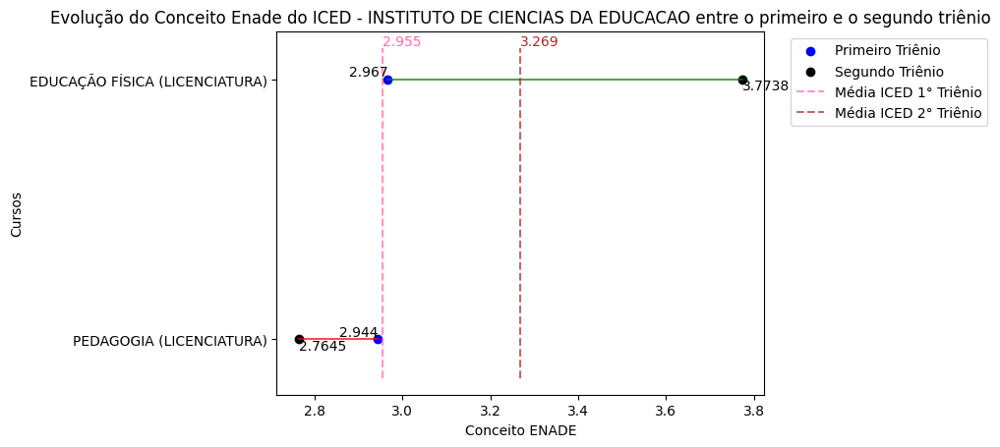

In [ ]:
df1 = iced1.copy()
df2 = iced2.copy()
media3.append(media1[7])
media4.append(media2[7])

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(ifch2['Área de Avaliação'], ifch2['Modalidade de Ensino'])]
#plt.scatter(ifch2['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[7],media1[7]],[-0.15,1.12], linestyle='--', color='hotpink', label='Média ICED 1° Triênio', alpha=0.7)
plt.text(media1[7], 1.12, f'{media1[7]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[7],media2[7]],[-0.15,1.12], linestyle='--', color='brown', label='Média ICED 2° Triênio', alpha=0.7)
plt.text(media2[7], 1.12, f'{media2[7]:.3f}', color='brown', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[-0.1795, 0.8068]


### ICJ

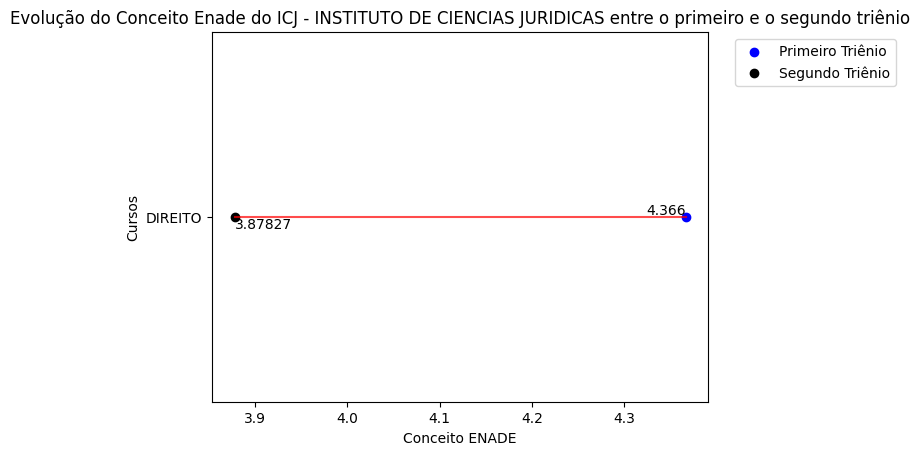

In [ ]:
df1 = icj1.copy()
df2 = icj2.copy()
media3.append(media1[8])
media4.append(media2[8])

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(ifch2['Área de Avaliação'], ifch2['Modalidade de Ensino'])]
#plt.scatter(ifch2['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[-0.48772999999999955]


### ICS

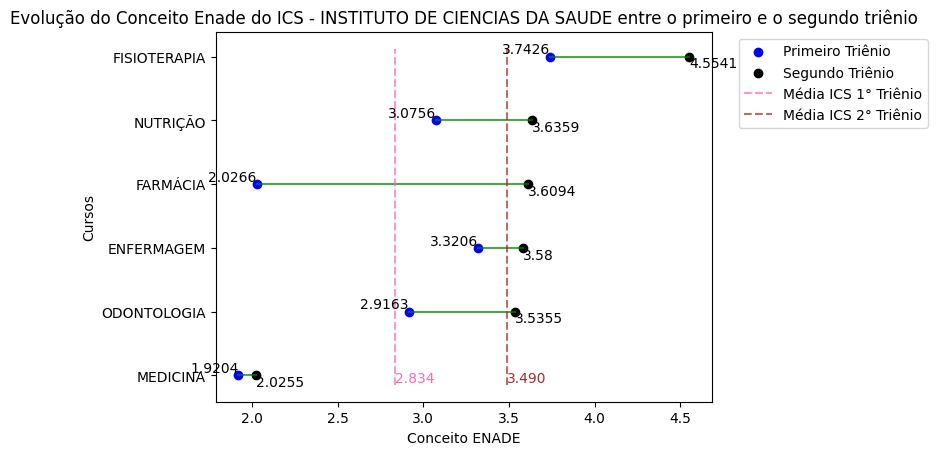

In [ ]:
df1 = ics1.copy()
df2 = ics2.copy()
media3.append(media1[9])
media4.append(media2[9])

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(ifch2['Área de Avaliação'], ifch2['Modalidade de Ensino'])]
#plt.scatter(ifch2['Conceito Enade (Contínuo)'], rotulos, color='green', label='Segundo Triênio')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[9],media1[9]],[-0.15,5.12], linestyle='--', color='hotpink', label='Média ICS 1° Triênio', alpha=0.7)
plt.text(media1[9], -0.16, f'{media1[9]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[9],media2[9]],[-0.15,5.12], linestyle='--', color='brown', label='Média ICS 2° Triênio', alpha=0.7)
plt.text(media2[9], -0.16, f'{media2[9]:.3f}', color='brown', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[0.10509999999999997, 0.6191999999999998, 0.25939999999999985, 1.5827999999999998, 0.5602999999999998, 0.8115000000000001]


### Sem Instituto

In [ ]:
# Código dos cursos de belém
valor_desejado = 87758
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
sem21 = sem2[sem2['Código do Curso'] == valor_desejado]

# Código dos cursos de belém
valor_desejado = 1191473
# Filtrar o DataFrame original e criar um novo DataFrame só com cursos de Belém
sem22 = sem2[sem2['Código do Curso'] == valor_desejado]

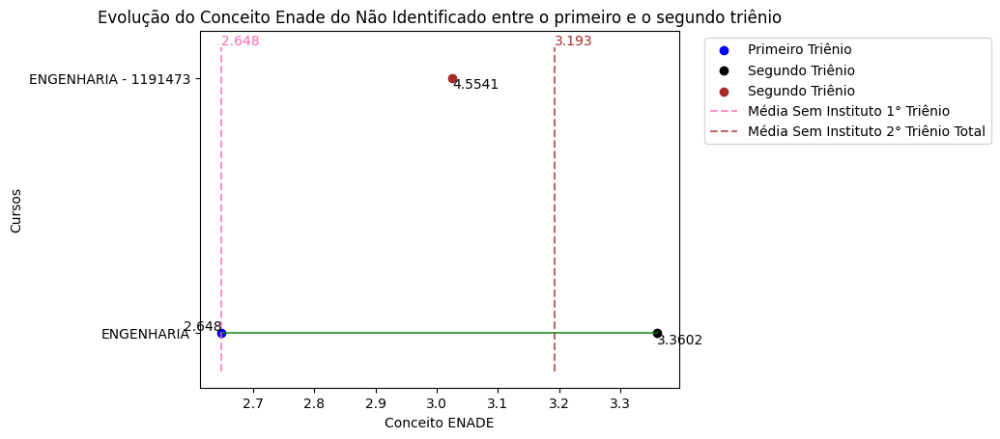

In [ ]:
df1 = sem1.copy()
df2 = sem21.copy()

# Combine df1 e df2 em um único DataFrame com base na coluna 'Nome'
df_combined = df1.merge(df2, on=['Área de Avaliação', 'Código do Curso', 'Código da Área'], how='outer')
df_combined = df_combined.sort_values(by='Conceito Enade (Contínuo)_y')
media3.append(media1[10])
aux=df_combined['Conceito Enade (Contínuo)_y']
media4.append(float(aux))

# Plotar os valores de df1 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_x'], df_combined['Área de Avaliação'], color='blue', label='Primeiro Triênio')

# Plotar os valores de df2 no eixo Y e X
plt.scatter(df_combined['Conceito Enade (Contínuo)_y'], df_combined['Área de Avaliação'], color='black', label='Segundo Triênio')

# Plotar os valores de df3 no eixo Y e X
rotulos = [f"{area} - {modalidade}" for area, modalidade in zip(sem22['Área de Avaliação'], sem22['Código do Curso'])]
plt.scatter(sem22['Conceito Enade (Contínuo)'], rotulos, color='brown', label='Segundo Triênio')
plt.text(sem22['Conceito Enade (Contínuo)'], rotulos, x2, ha='left', va='top')

# Traçar linhas para conectar os valores correspondentes de df1 e df2
for index, row in df_combined.iterrows():
    nome = row['Área de Avaliação']
    x1 = row['Conceito Enade (Contínuo)_x']
    x2 = row['Conceito Enade (Contínuo)_y']

    # Adicionar um rótulo de texto com o nome da avaliação no eixo y
    plt.text(x1, nome, x1, ha='right', va='bottom')
    plt.text(x2, nome, x2, ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    preguica.append(x2-x1)
    if x1>x2 :
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([x1, x2], [nome, nome], linestyle='-', color='green', alpha=0.7)

plt.plot([media1[10],media1[10]],[-0.15,1.12], linestyle='--', color='hotpink', label='Média Sem Instituto 1° Triênio', alpha=0.7)
plt.text(media1[10], 1.12, f'{media1[10]:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([media2[10],media2[10]],[-0.15,1.12], linestyle='--', color='brown', label='Média Sem Instituto 2° Triênio Total', alpha=0.7)
plt.text(media2[10], 1.12, f'{media2[10]:.3f}', color='brown', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Cursos')
titulo = 'Evolução do Conceito Enade do '+ df_combined['Instituto_y'][0] + ' entre o primeiro e o segundo triênio'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
#preguica.append(x2-x1)
print(preguica)
preguica=[]

[0.7121999999999997]


### Institutos

In [ ]:
media5 = media4.copy()
if len(media5) == 12:
  media5[7] = cont
else:
  media5[6] = cont
if len(media1) == 12:
  del(media1[0])
  del(media2[0])
if len(media4) == 12:
  del(media3[0])
  del(media4[0])
  del(media5[0])

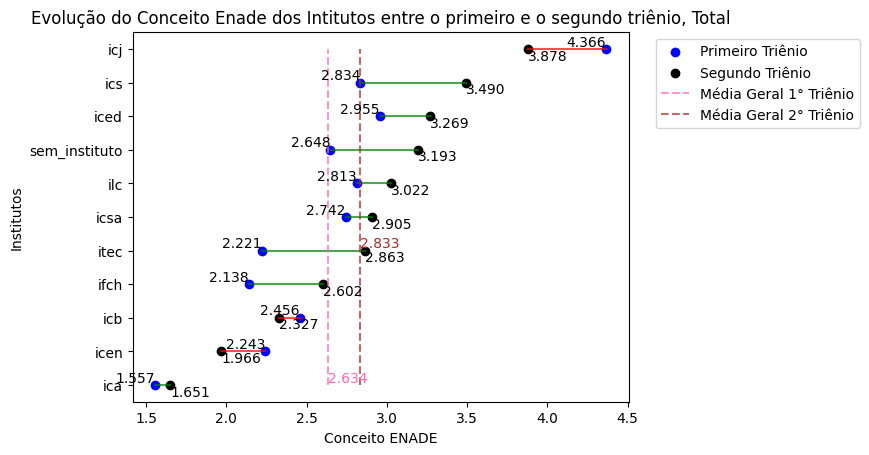

In [ ]:
y=['icen', 'ifch', 'icsa', 'icb', 'ica', 'ilc', 'itec', 'iced', 'icj', 'ics', 'sem_instituto']
mediageral1 = sum(media1)/len(media1)
mediageral2 = sum(media2)/len(media2)

#Ordenando todas as listas de acordo com a media
dados_combinados = list(zip(range(len(y)), media1, media2, y))
dados_combinados.sort(key=lambda x: x[2])
media1 = [item[1] for item in dados_combinados]
media2 = [item[2] for item in dados_combinados]
y = [item[3] for item in dados_combinados]

plt.scatter(media1, y, color='blue', label='Primeiro Triênio')
plt.scatter(media2, y, color='black', label='Segundo Triênio')

for i in range(len(media1)):
    plt.text(media1[i], y[i], f'{media1[i]:.3f}', ha='right', va='bottom')
    plt.text(media2[i], y[i], f'{media2[i]:.3f}', ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    if media1[i]>media2[i] :
      plt.plot([media1[i], media2[i]], [y[i], y[i]], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([media1[i], media2[i]], [y[i],y[i]], linestyle='-', color='green', alpha=0.7)

plt.plot([mediageral1,mediageral1],[y[0],y[10]], linestyle='--', color='hotpink', label='Média Geral 1° Triênio', alpha=0.7)
plt.text(mediageral1, y[0], f'{mediageral1:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([mediageral2,mediageral2],[y[0],y[10]], linestyle='--', color='brown', label='Média Geral 2° Triênio', alpha=0.7)
plt.text(mediageral2, y[4], f'{mediageral2:.3f}', color='brown', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Institutos')
titulo = 'Evolução do Conceito Enade dos Intitutos entre o primeiro e o segundo triênio, Total'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
#images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
#plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
for i in range(len(media4)):
  print(media4[i],media5[i])

2.14345 2.14345
2.6020166666666666 2.6020166666666666
2.905026 2.905026
2.5717666666666665 2.5717666666666665
1.6506 1.6506
3.7580933333333335 3.7580933333333335
2.9343125 3.052742857142857
3.26915 3.26915
3.87827 3.87827
3.490066666666666 3.490066666666666
3.3602 3.3602


In [ ]:
y=['icen', 'ifch', 'icsa', 'icb', 'ica', 'ilc', 'itec', 'iced', 'icj', 'ics', 'sem_instituto']
mediageral3 = sum(media3)/len(media3)
mediageral4 = sum(media4)/len(media4)
mediageral5 = sum(media5)/len(media5)

#Ordenando todas as listas de acordo com a media
dados_combinados = list(zip(media3, media4, y, media5))
dados_combinados.sort(key=lambda x: x[3])
media3 = [item[0] for item in dados_combinados]
media4 = [item[1] for item in dados_combinados]
y = [item[2] for item in dados_combinados]
media5 = [item[3] for item in dados_combinados]

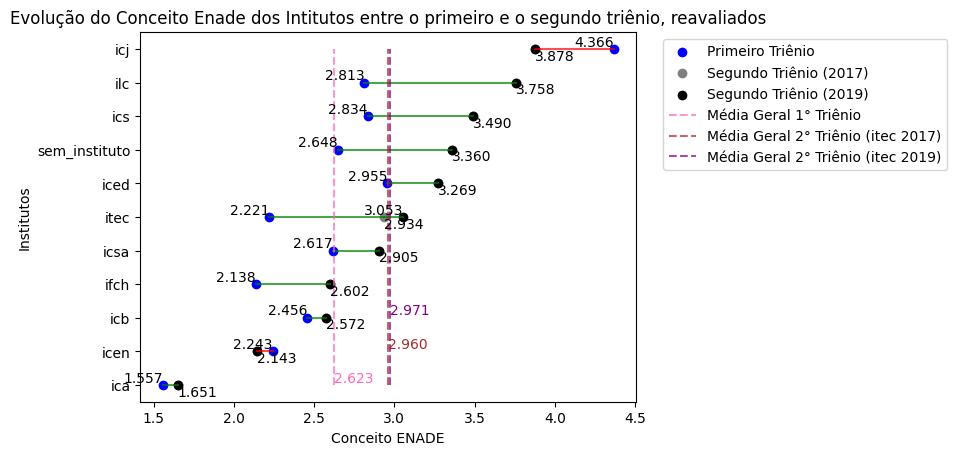

In [ ]:
plt.scatter(media3, y, color='blue', label='Primeiro Triênio')
plt.scatter(media4, y, color='grey', label='Segundo Triênio (2017)')
plt.scatter(media5, y, color='black', label='Segundo Triênio (2019)')

for i in range(len(media1)):
    plt.text(media3[i], y[i], f'{media3[i]:.3f}', ha='right', va='bottom')
    plt.text(media4[i], y[i], f'{media4[i]:.3f}', ha='left', va='top') #'top', 'bottom', 'center', 'baseline', 'center_baseline'
    if media5[i] != media4[i]:
      plt.text(media5[i], y[i], f'{media5[i]:.3f}', ha='right', va='bottom')
    #--------------para 2017---------------------
    if media3[i]>media4[i] :
      plt.plot([media3[i], media4[i]], [y[i], y[i]], linestyle='-', color='red', alpha=0.7)
    else:
      plt.plot([media3[i], media4[i]], [y[i],y[i]], linestyle='-', color='green', alpha=0.7)
    #---------------para 2019---------------------
    if media4[i]>media5[i]:
      plt.plot([media4[i], media5[i]], [y[i], y[i]], linestyle='-', color='red', alpha=0.7)
    elif media4[i]<media5[i]:
      plt.plot([media4[i], media5[i]], [y[i],y[i]], linestyle='-', color='green', alpha=0.7)

plt.plot([mediageral3,mediageral3],[y[0],y[10]], linestyle='--', color='hotpink', label='Média Geral 1° Triênio', alpha=0.7)
plt.text(mediageral3, y[0], f'{mediageral3:.3f}', color='hotpink', ha='left', va='bottom')
plt.plot([mediageral4,mediageral4],[y[0],y[10]], linestyle='--', color='brown', label='Média Geral 2° Triênio (itec 2017)', alpha=0.7)
plt.text(mediageral4, y[1], f'{mediageral4:.3f}', color='brown', ha='left', va='bottom')
plt.plot([mediageral5,mediageral5],[y[0],y[10]], linestyle='--', color='purple', label='Média Geral 2° Triênio (itec 2019)', alpha=0.7)
plt.text(mediageral5, y[2], f'{mediageral5:.3f}', color='purple', ha='left', va='bottom')

# Configurar os rótulos dos eixos e título
plt.xlabel('Conceito ENADE')
plt.ylabel('Institutos')
titulo = 'Evolução do Conceito Enade dos Intitutos entre o primeiro e o segundo triênio, reavaliados'
plt.title(titulo, loc='center')

# Adicionar uma legenda
plt.legend(loc="upper left", bbox_to_anchor=(1.04, 1))

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()

In [ ]:
for i in range(len(media3)):
  print(media4[i]-media3[i])
medias2 = [0] * len(media3)
medias2

In [ ]:
# Dados do gráfico de barras
for i in range(len(media3)):
  medias[i]=(media4[i]-media3[i]) #2017
  medias2[i]=(media5[i]-media3[i]) #2019
cursos = ['ICEN ', 'IFCH', 'ICSA', 'ICB', 'ICA', 'ILC', 'ITEC ', 'ICED', 'ICJ', 'ICS', 'Sem Intituto']
cores = ['#0000FF', '#00FF7F', '#006400', '#FF8C00', '#FF00FF', '#DC143C', '#ADD8E6', '#FF0000', '#4B0082', '#FFFF00', '#808080']

#Ordenando de acordo com o último
dados_combinados = list(zip(range(len(medias)), cursos, medias, cores, medias2))
dados_combinados.sort(key=lambda x: x[2])
cursos = [item[1] for item in dados_combinados]
medias = [item[2] for item in dados_combinados]
cores = [item[3] for item in dados_combinados]
medias2 = [item[4] for item in dados_combinados]

# Criar o gráfico de barras
plt.bar(cursos, medias, color=cores, width=0.7)
plt.xticks(range(0, len(lista), 1), lista[::1])

aux = cursos
lista = list(range(len(aux)))
# Criar a legenda personalizada
legenda_personalizada = aux
listat = [f"{a}-{b}" for a, b in zip(lista, legenda_personalizada)]
legenda_personalizada = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=cor) for label, cor in zip(listat, cores)]
plt.legend(handles=legenda_personalizada, title="Instituto(número de cursos avaliados) dos respectivos valores", loc="upper left", bbox_to_anchor=(1.02, 1))

# Adicionar os valores acima das barras
for i, media in enumerate(medias):
    if media>0:
      plt.text(cursos[i], media, f'{media:.2f}',color='black', ha='center', va='bottom')
    else:
      plt.text(cursos[i], media-0.058, f'{media:.2f}',color='black', ha='center', va='bottom')

posicao_y = sum(medias)/len(medias)
plt.axhline(y=posicao_y, color='red', linestyle='--', label='Linha Horizontal')
plt.text(0.75, posicao_y-0.1, f'Média dos institutos: {sum(medias)/len(medias) :.2f}', color='red', fontsize=7, ha='center')


# Configurar rótulos e título
plt.xlabel("Institutos")
plt.ylabel("evolução")
titulo = "Diferença entre os triênios por Instituto" #considerando somente os cursos que tiveram reavaliações
plt.title(titulo)

#Salvando a Imagem gerada em formato pdf em uma pasta especificada do meu Drive
images_dir = '/content/gdrive/My Drive/Faculdade/TCC/Gráficos'
plt.savefig(f"{images_dir}/"+titulo+".pdf", dpi=300, bbox_inches='tight')

# Exibir o gráfico
plt.show()